In [1]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, OrdinalEncoder, RobustScaler
import category_encoders as ce
from pandas_profiling import ProfileReport
import datetime
import pandas_profiling
from datetime import datetime
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import warnings
warnings.filterwarnings('ignore')
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 200)

In [2]:
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.base import clone
from sklearn.metrics import pairwise_distances
from scipy.cluster.hierarchy import dendrogram
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from collections import Counter

In [3]:
from sklearn.neighbors import LocalOutlierFactor
from numpy import quantile, where, random

In [4]:
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram
import matplotlib.cm as cm
from yellowbrick.cluster import KElbowVisualizer

In [7]:
#pip install yellowbrick

* [Exclusion with Correlation](#corr)
* [Endoding](#enc)
* [Imputation for Outliers](#imput)
* [Scaling and Normalization for Outliers](#scal_norm)
* [Outliers](#outl)
* [PCA](#pca)
* [Division of variables](#div)
* [K-mean Hierarchical](#hier)
* [R2-score](#r2)
<a class="anchor" id="none">

In [11]:
data = pd.read_csv('donors.csv')
data.head(3)

,Unnamed: 0,ODATEDW,OSOURCE,TCODE,STATE,ZIP,MAILCODE,PVASTATE,DOB,NOEXCH,RECINHSE,RECP3,RECPGVG,RECSWEEP,MDMAUD,DOMAIN,HOMEOWNR,CHILD03,CHILD07,CHILD12,CHILD18,NUMCHLD,INCOME,GENDER,WEALTH1,HIT,MBCRAFT,MBGARDEN,MBBOOKS,MBCOLECT,MAGFAML,MAGFEM,MAGMALE,PUBGARDN,PUBCULIN,PUBHLTH,PUBDOITY,PUBNEWFN,PUBPHOTO,PUBOPP,DATASRCE,MALEMILI,MALEVET,VIETVETS,WWIIVETS,LOCALGOV,STATEGOV,FEDGOV,SOLP3,SOLIH,MAJOR,WEALTH2,GEOCODE,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,LIFESRC,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,ETH8,ETH9,ETH10,ETH11,ETH12,ETH13,ETH14,ETH15,ETH16,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC10,IC11,IC12,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE4,TPE5,TPE6,TPE7,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC8,LFC9,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC2,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,OEDC7,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC1,AFC2,AFC3,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC9,HC10,HC11,HC12,HC13,HC14,HC15,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_15,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_20,ADATE_21,ADATE_22,ADATE_23,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RDATE_3,RDATE_4,RDATE_5,RDATE_6,RDATE_7,RDATE_8,RDATE_9,RDATE_10,RDATE_11,RDATE_12,RDATE_13,RDATE_14,RDATE_15,RDATE_16,RDATE_17,RDATE_18,RDATE_19,RDATE_20,RDATE_21,RDATE_22,RDATE_23,RDATE_24,RAMNT_3,RAMNT_4,RAMNT_5,RAMNT_6,RAMNT_7,RAMNT_8,RAMNT_9,RAMNT_10,RAMNT_11,RAMNT_12,RAMNT_13,RAMNT_14,RAMNT_15,RAMNT_16,RAMNT_17,RAMNT_18,RAMNT_19,RAMNT_20,RAMNT_21,RAMNT_22,RAMNT_23,RAMNT_24,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2R,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A,GEOCODE2
0,0,2009-01-01,GRI,0,IL,61081,,,1957-12-01,0,,,,,XXXX,T2,,,,,,NaN,NaN,F,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,0,39,34,18,10,2,1,,,,5.0,,,,,,,,,,,,,,,,,,,,,X,992,264,332,0,35,65,47,53,92,1,0,0,11,0,0,0,0,0,0,0,11,0,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,23,23,23,15,1,0,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,0,0,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,99,0,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,0,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,0,120,16,10,39,21,8,4,3,5,20,3,19,4,0,0,0,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,0,0,90,0,10,0,0,0,33,65,40,99,99,6,2,10,7,2017-06-01,2016-06-01,2016-04-01,2016-04-01,2016-03-01,

In [12]:
data.drop(['Unnamed: 0'], axis=1, inplace=True)

In [13]:
data.shape[0]

95412

In [14]:
df = data.copy() 

In [15]:
any(df.duplicated())

False

In [16]:
df.drop(df.loc[df['MAILCODE']=='B'].index, inplace=True)
df.drop(['MAILCODE'], axis = 1, inplace = True)

In [17]:
df.shape[0]/data.shape[0]

0.9853372741374251

In [18]:
df.drop(['DATASRCE', 'LIFESRC', 'NOEXCH', 'WEALTH1', ], axis = 1, inplace = True) 
df.drop(df.loc[df['SOLP3']=='00'].index, inplace=True)
df.drop(df.loc[df['SOLIH']=='00'].index, inplace=True)

In [19]:
df.shape[0]/data.shape[0]

0.9817737810757556

In [20]:
df['DOB'] = 2017 - df['DOB'].str[:4].fillna(0).astype(int)
df['DOB'] = df['DOB'].replace(2017, np.nan)
df['DOB'].isna().sum()

23292

In [21]:
df=df.rename(columns={'DOB':'AGE'}) 

In [22]:
df['ETH4']= df['ETH12']+ df['ETH4']
df['ETH5']= df['ETH5']+df['ETH13']+ df['ETH14']+ df['ETH15'] + df['ETH16']
df['ETH6']= df['ETH6']+df['ETH8']+ df['ETH9']+ df['ETH10'] + df['ETH11']
df.drop(['ETH12', 'ETH13', 'ETH14', 'ETH15','ETH16', 'ETH8', 'ETH9', 'ETH10', 'ETH11'], axis = 1, inplace = True)

df['IC7']= df['IC7']+df['IC8']
df['IC8']= df['IC9']+df['IC10']
df['IC9']= df['IC11']+df['IC12']
df.drop(['IC10', 'IC11', 'IC12'], axis = 1, inplace = True)

In [23]:
df = df[df.POP901 >0] #it must have at least someone 

In [24]:
df.shape[0]/data.shape[0]

0.9737139982392152

In [25]:
df.drop(['TPE4', 'TPE5', 'TPE6', 'TPE7', 'EIC2', 'OEDC7', 'AFC1', 'AFC2', 'AFC3','HC9','HC10','HC15'], axis=1, inplace=True) #large number of zeros
df.drop(['LFC8', 'LFC9'], axis=1, inplace=True) #many extreme percentages 0 and 100% 
df.drop('GEOCODE2', axis=1, inplace=True) #we have no information of what the codes mean
df.drop(['RECINHSE', 'RECP3', 'RECPGVG', 'RECSWEEP', 'PVASTATE','SOLP3', 'SOLIH', 'GEOCODE'], axis=1, inplace=True) #too many null values (not defined as nan by default)
df.drop(['RFA_2R'], axis=1, inplace=True) #RFA_2R - constant value
df.drop(['MALEMILI','MALEVET','VIETVETS','WWIIVETS','LOCALGOV','STATEGOV','FEDGOV'], axis=1, inplace=True) #not related to the census, can't really understand to each population it refers to 
df=df.reset_index(drop=True)
for index in range(len(df)):
    if pd.isna(df['NUMCHLD'][index]):
        if ((df['CHILD03'][index]==' ' and df['CHILD07'][index]==' ') and (df['CHILD12'][index]==' ' and df['CHILD18'][index]==' ')):
            df['NUMCHLD'][index] = 0
            
df.drop(['CHILD03', 'CHILD07','CHILD12','CHILD18'], axis=1, inplace=True)
df[['ZIP','null']] = df.ZIP.str.split("-",1, expand=True)
df.drop(['null'], axis=1, inplace=True)
df.ZIP = df.ZIP.astype('int')

In [26]:
df.NUMCHLD.isna().sum()

1525

In [27]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
for index in range(len(missing_value_df)):
    if missing_value_df['percent_missing'][index]>=45:
        df.drop(missing_value_df['column_name'][index], axis=1, inplace=True)

In [28]:
#find which columns represent booleans
bools=[]
for col in df:
    if len(df[col].unique()) == 2:
        bools.append(col)

#find wich columns are dates
dates = df.filter(like='DATE').columns

#tranform those dates into datetime and then into days
df[dates] = df[dates].apply(pd.to_datetime)
df[dates] = (datetime(2017, 12, 31) - df[dates]) #CONFIRMAR ESTE DIA
df[dates]= df[dates].astype('timedelta64[D]')

#transform booleans to binary
df[bools]=df[bools].replace([' ','U'],0)
df[bools]=df[bools].replace(['X','Y','H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,H,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,13,28,2,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,96,0,4,0,0,99,0

In [29]:
#turn variables into binary
bols = ['HOMEOWNR']
df[bols]=df[bols].replace([' ','U'],0)
df[bols]=df[bols].replace(['H'],1)
df

,ODATEDW,OSOURCE,TCODE,STATE,ZIP,AGE,MDMAUD,DOMAIN,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP901,POP902,POP903,POP90C1,POP90C2,POP90C3,POP90C4,POP90C5,ETH1,ETH2,ETH3,ETH4,ETH5,ETH6,ETH7,AGE901,AGE902,AGE903,AGE904,AGE905,AGE906,AGE907,CHIL1,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,AGEC6,AGEC7,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHAGE1,HHAGE2,HHAGE3,HHN1,HHN2,HHN3,HHN4,HHN5,HHN6,MARR1,MARR2,MARR3,MARR4,HHP1,HHP2,DW1,DW2,DW3,DW4,DW5,DW6,DW7,DW8,DW9,HV1,HV2,HV3,HV4,HU1,HU2,HU3,HU4,HU5,HHD1,HHD2,HHD3,HHD4,HHD5,HHD6,HHD7,HHD8,HHD9,HHD10,HHD11,HHD12,ETHC1,ETHC2,ETHC3,ETHC4,ETHC5,ETHC6,HVP1,HVP2,HVP3,HVP4,HVP5,HVP6,HUR1,HUR2,RHP1,RHP2,RHP3,RHP4,HUPA1,HUPA2,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP1,RP2,RP3,RP4,MSA,ADI,DMA,IC1,IC2,IC3,IC4,IC5,IC6,IC7,IC8,IC9,IC13,IC14,IC15,IC16,IC17,IC18,IC19,IC20,IC21,IC22,IC23,HHAS1,HHAS2,HHAS3,HHAS4,MC1,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE11,TPE12,TPE13,LFC1,LFC2,LFC3,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC9,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC1,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC4,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC1,POBC2,LSC1,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC2,HC3,HC4,HC5,HC6,HC7,HC8,HC11,HC12,HC13,HC14,HC16,HC17,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,ADATE_2,ADATE_3,ADATE_4,ADATE_5,ADATE_6,ADATE_7,ADATE_8,ADATE_9,ADATE_10,ADATE_11,ADATE_12,ADATE_13,ADATE_14,ADATE_16,ADATE_17,ADATE_18,ADATE_19,ADATE_21,ADATE_22,ADATE_24,RFA_2,RFA_3,RFA_4,RFA_5,RFA_6,RFA_7,RFA_8,RFA_9,RFA_10,RFA_11,RFA_12,RFA_13,RFA_14,RFA_15,RFA_16,RFA_17,RFA_18,RFA_19,RFA_20,RFA_21,RFA_22,RFA_23,RFA_24,CARDPROM,MAXADATE,NUMPROM,CARDPM12,NUMPRM12,RAMNTALL,NGIFTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,FISTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,HPHONE_D,RFA_2F,RFA_2A,MDMAUD_R,MDMAUD_F,MDMAUD_A
0,3286.0,GRI,0,IL,61081,60.0,XXXX,T2,0,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,992,264,332,0,35,65,47,53,92,1,0,0,22,0,0,39,48,51,40,50,54,25,31,42,27,11,14,18,17,13,11,15,12,11,34,25,18,26,10,23,18,33,49,28,12,4,61,7,12,19,198,276,97,95,2,2,0,0,7,7,0,479,635,3,2,86,14,96,4,7,38,80,70,32,84,16,6,2,5,9,15,3,17,50,25,0,0,0,2,7,13,27,47,0,1,61,58,61,15,4,2,0,0,14,1,0,0,2,5,17,73,0.0,177.0,682.0,307,318,349,378,12883,13,46,38,1,0,1,4,25,24,26,17,2,0,0,2,28,4,51,1,46,54,3,88,8,0,0,4,1,13,14,16,2,45,56,64,50,64,44,62,53,0,9,3,8,13,9,0,3,9,3,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,120,16,10,39,21,8,4,3,5,20,3,19,4,18,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,3,74,88,8,0,4,96,77,19,13,31,5,14,14,31,54,46,90,0,10,0,0,33,65,40,99,99,6,2,10,7,213.0,578.0,639.0,639.0,670.0,699.0,730.0,791.0,822.0,822.0,883.0,914.0,944.0,1036.0,1064.0,1095.0,1156.0,1187.0,1217.0,1309.0,L4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,S4E,27,333.0,74,6,14,240.0,31,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2982.0,2862.0,4.0,7.741935,95515,0,4,E,X,X,X
1,1460.0,BOA,1,CA,91326,45.0,XXXX,S1,1,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3611,940,998,99,0,0,50,50,67,0,0,31,13,28,2,34,41,43,32,42,45,32,33,46,21,13,14,33,23,10,4,2,11,16,36,22,15,12,1,5,4,21,75,55,23,9,69,4,3,24,317,360,99,99,0,0,0,0,0,0,0,5468,5218,12,10,96,4,97,3,9,59,94,88,55,95,5,4,1,3,5,4,2,18,44,5,0,0,0,97,98,98,98,99,94,0,83,76,73,21,5,0,0,0,4,0,0,0,91,91,91,94,4480.0,13.0,803.0,1088,1096,1026,1037,36175,2,8,20,27,10,33,2,5,2,5,15,14,14,10,32,6,2,66,3,56,44,9,80,14,0,0,6,0,2,24,32,12,71,70,83,58,81,57,64,57,0,22,24,4,21,13,2,1,6,0,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,160,5,5,12,21,7,30,20,14,24,4,24,10,8,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,42,39,50,7,27,16,99,92,53,5,10,2,26,56,97,99,0,96,0,4,0,0,99,


<a class="anchor" id="corr">

In [30]:
blacklist=[]
corr_matrix=df.corr()
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[j, i]) > 0.85:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            
            if colname in blacklist or rowname in blacklist:
                continue
            list1 = []
            list2 = []
            for k, index in enumerate(corr_matrix[colname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list1.append(1-abs(index)) 
            for k, index in enumerate(corr_matrix[rowname]):
                if(corr_matrix.columns[k] not in blacklist):
                    list2.append(1-abs(index))
            if sum(list1)>sum(list2):
                blacklist.append(colname)
                df.drop(colname, axis=1, inplace=True)

            else:
                blacklist.append(rowname)
                df.drop(rowname, axis=1, inplace=True)
                
for column in corr_matrix.columns:
    if (corr_matrix[column]< 0.1).all() is True:
        corr_matrix.drop(column, axis=1, inplace=True)
        df.drop(column, axis=1, inplace=True)

In [31]:
df.drop(df.loc[:,'ADATE_2':'RFA_24'], axis=1, inplace =True)   
#RFA has a high degree of cardinality
#we have other more important dates than to know for each gift

df.drop(['OSOURCE', 'DOMAIN', 'MDMAUD'], axis=1, inplace=True) #high cardinality
#Domain has other variables that explain this, is redundant 
#MDMAUD we have other values that contain this information (the other MDMAUD_)

df.drop(['HVP5',  # we already have the median home value, it's skewed
         'IC7','IC8', 'IC16', 'IC17', 'IC18', 'IC19','IC20','IC21','IC23','IC22',  #we have the income per capita and other values that explain this
         'TPE11'], axis=1, inplace=True)  #drop the average bc we have the median and it's slightly skewed

df.drop(['HHD11',  #we have hhd10 and hhd3, redundant
         'ETHC1','ETHC2','ETHC3','ETHC5','ETHC6'], axis=1, inplace=True)   #we have other variables that explain this information

df.drop(['TCODE', 'HPHONE_D'], axis=1, inplace=True)
df.drop(['MSA', 'ADI', 'DMA'], axis=1,inplace=True) #codes
df.drop(['MDMAUD_F', 'MDMAUD_R', 'MDMAUD_A'], axis=1, inplace=True) 
df_ = df.replace(' ', np.nan)  

In [32]:
df_.GENDER.value_counts()

F    50000
M    38052
U     1673
J      357
C        2
A        2
Name: GENDER, dtype: int64

In [33]:
df_.GENDER.fillna('U', inplace = True)  

df_.drop(df_[df_.GENDER == 'C'].index, inplace=True)  #in metadata there is no reference to these two values
df_.drop(df_[df_.GENDER == 'A'].index, inplace=True)

df_.GENDER = df_.GENDER.replace(['F'],0)
df_.GENDER = df_.GENDER.replace(['M'],1)
df_.GENDER = df_.GENDER.replace(['U','J'],2)

In [34]:
df

,STATE,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A
0,IL,60.0,0,0.0,NaN,F,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,E
1,CA,45.0,1,1.0,6.0,M,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,G
2,NC,NaN,0,0.0,3.0,M,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,E
3,CA,69.0,0,0.0,1.0,F,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,E
4,FL,77.0,1,1.0,3.0,F,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,10,25,254.0,8,3.0,1552.0,15.0,730.0,15.0,730.0,6453.0,14.0,6.864865,7112,2,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,

### Encode variables

<a class="anchor" id="enc">

In [35]:
df_.RFA_2A.value_counts()

F    45838
E    21083
G    18743
D     7236
Name: RFA_2A, dtype: int64

In [36]:
 # create object of Ordinalencoding to deal with the variable education level
encoder= ce.OrdinalEncoder(cols=['RFA_2A'],return_df=True,
                           mapping=[{'col':'RFA_2A',
'mapping':{'D':0, 'E':1, 'F':2, 'G':3}}])

#fit and transform train data 
df_transformed = encoder.fit_transform(df_)
#check
df_transformed.RFA_2A.value_counts() 

2    45838
1    21083
3    18743
0     7236
Name: RFA_2A, dtype: int64

In [37]:
#keep only the top 5 states
df_transformed.STATE = df_transformed.STATE.replace(['NC', 'AL', 'IN', 'LA', 'IA', 'TN', 'KS', 'MN',
       'UT', 'MO', 'OR', 'WA', 'WI', 'GA', 'OK', 'KY', 'MD',
       'SD', 'NV', 'NE', 'AZ', 'VA', 'SC', 'ND', 'AK', 'AR', 'NM', 'MT',
       'MS', 'CO', 'HI', 'ME', 'WY', 'ID', 'OH', 'NJ', 'MA', 'VT', 'NY',
       'PA', 'DC', 'CT', 'DE', 'WV', 'RI', 'AA', 'NH'],'Others')

#'IL', 'CA', 'FL', 'TX', 'MI'

In [38]:
df_transformed.STATE.value_counts()

Others    48646
CA        16991
FL         8154
TX         7284
IL         6293
MI         5532
Name: STATE, dtype: int64

In [39]:
df_ohc= df_transformed.copy()

one_hot_feat= ["STATE"]
ohc= OneHotEncoder(sparse=False)
ohc_feat= ohc.fit_transform(df_ohc[one_hot_feat])
ohc_feat_names= ohc.get_feature_names(["STATE"])
ohc_df = pd.DataFrame(ohc_feat, index=df_ohc.index, columns=ohc_feat_names)
df_ohc = pd.concat([df_ohc.drop(columns=one_hot_feat), ohc_df], axis=1)
df_ohc

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,

In [40]:
df_=df_ohc.copy()

### Imputation of the nan values and normalization for outlier removal

<a class="anchor" id="imput">

In [41]:
numeric_data = df_.select_dtypes(include=[np.number]).columns.to_list()
categorical_data = df_.columns.drop(numeric_data).to_list()
df_[numeric_data]

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0,

In [42]:
df_[numeric_data].isna().sum().tail(200)

HOMEE              0
PETS               0
CDPLAY             0
STEREO             0
PCOWNERS           0
PHOTO              0
CRAFTS             0
FISHER             0
GARDENIN           0
BOATS              0
WALKER             0
KIDSTUFF           0
CARDS              0
PLATES             0
PEPSTRFL           0
POP903             0
POP90C1            0
POP90C2            0
POP90C3            0
POP90C5            0
ETH1               0
ETH3               0
ETH7               0
CHIL2              0
CHIL3              0
AGEC1              0
AGEC2              0
AGEC3              0
AGEC4              0
AGEC5              0
CHILC1             0
CHILC2             0
CHILC3             0
CHILC4             0
CHILC5             0
HHN2               0
HHN6               0
MARR2              0
MARR3              0
MARR4              0
DW2                0
DW3                0
DW7                0
DW8                0
DW9                0
HU2                0
HU4                0
HU5          

In [43]:
df_outliers = df_.apply(lambda x: x.fillna(x.median()),axis=0)
df_outliers

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,60.0,0,0.0,4.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,95515,4,1,0.0,0.0,1.0,0.0,0.0,0.0
1,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,148535,2,3,1.0,0.0,0.0,0.0,0.0,0.0
2,59.0,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,15078,4,1,0.0,0.0,0.0,0.0,1.0,0.0
3,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,172556,4,1,1.0,0.0,0.0,0.0,0.0,0.0
4,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3,7,22,9,0,7,2,2,6,1,5,2,2,12,2,7,6,4,15,29,4,3,26,3,2,7,49,12,16,20,30,13,3,12,5,2,26,1,20,7,28,4,9,16,53,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,65,0,0,0,90,45,18,25,0,3,67,9,14,72,3,0,1,21,99,96,6,2,7,11,333.0

In [44]:
std_data=df_outliers.copy()

df_.set_index(['CONTROLN'],inplace=True)
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3

The reason why we decided to use robust scaler.
1st scale the data
2nd eliminate outliers. 
Depois no report explicar que este é o mais indicado para se tratar dos outliers.

<a class="anchor" id="scal_norm">
https://www.kaggle.com/mikalaichaly/compare-different-scalers-on-data-with-outliers

In [45]:
numeric_data.remove('CONTROLN')
std_data.reset_index(drop=True, inplace=True)


In [46]:
#from sklearn.preprocessing import MinMaxScaler   #fazer com o outro  ROBUSTSCALER E DEPOIS OUTLIERS
scaler = StandardScaler()
std_data[numeric_data] = pd.DataFrame(scaler.fit_transform(std_data[numeric_data]), columns = numeric_data)
std_data

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,CONTROLN,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
0,0.086509,-1.115063,-0.338523,0.050855,-0.863635,-0.358988,-0.053788,-0.241511,-0.351735,-0.321728,-0.301178,-0.097003,-0.422794,-0.38582,-0.395211,-0.353125,-0.230764,-0.307868,-0.285861,-0.406948,-0.147952,-0.353221,-0.1288,-0.105311,-0.077102,1.055397,-0.422835,-1.247156,0.678832,0.960261,0.479312,0.327897,-0.224496,-0.179596,0.621568,1.051195,-0.216806,-1.110308,-0.478566,0.681230,0.258971,-0.874927,-1.552550,0.460630,1.210839,0.479734,-0.118720,0.017942,-0.853606,0.930729,-0.477813,1.101575,-0.171259,0.882489,1.368552,-0.157247,-0.752745,-0.526735,-0.325346,0.697161,-0.112499,0.323648,-0.278623,-0.672060,-0.452524,-0.358454,-0.514375,0.734355,0.334001,-0.384968,-0.597158,0.355857,-0.569421,-0.620561,-0.540124,-0.178312,-0.350862,0.074884,-0.346385,0.460427,-0.986804,0.181499,-0.916867,0.992522,-0.771923,-0.430794,-0.746943,0.194403,-0.205294,-0.287805,-0.870425,-0.627282,-0.939944,-0.471781,-0.730396,-0.173710,0.224978,-0.722660,-0.642315,-1.372492,1.732091,0.090966,-1.189712,-0.422558,0.711092,-0.272122,0.609065,2.150247,0.296208,0.075970,-0.032736,-0.846110,2.366527,-1.040825,-1.174770,0.838547,-0.675166,-0.197490,0.091918,-1.025817,1.092855,0.198956,-0.774294,-1.276679,-0.398651,0.691514,-0.535559,-0.532246,-0.205395,0.743548,-0.955970,0.866227,-0.391722,1.007650,0.005225,0.416526,-1.052121,-0.627975,0.324470,-0.305274,0.810611,0.276310,-0.507761,0.738729,-0.785199,0.220081,0.511468,-0.928828,0.430324,0.119425,-0.356299,-0.639490,1.544228,-0.270152,-0.334070,0.032621,-0.327072,-0.363902,-0.464713,-0.194448,-0.279597,-0.747776,1.000027,-0.201772,0.774945,0.163142,-0.384927,0.114704,0.369640,0.891325,-0.112661,1.532715,0.396300,-0.372002,0.306880,1.062385,-0.573567,-0.716745,-0.474094,-0.512257,1.852503,-0.924568,0.174305,0.599212,-0.630055,-0.417499,1.454708,0.300810,-0.059802,0.542345,0.261454,1.180097,1.988099,-0.335988,0.124479,-0.318042,0.447558,-0.538735,-0.094676,0.644482,-0.494956,-0.525022,95515,1.953735,-0.973721,-0.473111,-0.310189,3.709776,-0.251631,-1.048449,-0.291681
1,-0.946586,0.896810,1.346474,1.270683,0.816681,1.353212,-0.053788,-0.241511,-0.351735,-0.321728,-0.301178,-0.097003,-0.422794,-0.38582,-0.395211,-0.353125,-0.230764,-0.307868,-0.285861,-0.406948,-0.147952,-0.353221,-0.1288,-0.105311,-0.077102,-0.947511,-0.108024,0.844495,-0.438279,-0.657695,-0.409721,-0.946888,-0.224496,0.719011,1.371582,-0.035180,0.118890,-1.110308,2.047416,2.133154,-0.488309,-1.078106,-0.081658,0.900738,0.495144,-0.069544,-1.685755,1.336857,-1.531849,-0.922413,0.100510,1.257063,-0.542827,-0.304290,-0.273476,-0.157247,-1.234281,-0.627212,-0.230213,1.868614,-1.033622,-0.570110,-0.707042,-1.243256,-0.696617,4.824462,-0.647139,2.039053,3.044366,0.511406,-0.597158,-0.937475,-0.703344,-0.620561,-0.540124,0.721

In [47]:
std_data.set_index(['CONTROLN'],inplace=True) #unique number 

#meter no df_ depois dos outliers tambem
std_data

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.086509,-1.115063,-0.338523,0.050855,-0.863635,-0.358988,-0.053788,-0.241511,-0.351735,-0.321728,-0.301178,-0.097003,-0.422794,-0.38582,-0.395211,-0.353125,-0.230764,-0.307868,-0.285861,-0.406948,-0.147952,-0.353221,-0.1288,-0.105311,-0.077102,1.055397,-0.422835,-1.247156,0.678832,0.960261,0.479312,0.327897,-0.224496,-0.179596,0.621568,1.051195,-0.216806,-1.110308,-0.478566,0.681230,0.258971,-0.874927,-1.552550,0.460630,1.210839,0.479734,-0.118720,0.017942,-0.853606,0.930729,-0.477813,1.101575,-0.171259,0.882489,1.368552,-0.157247,-0.752745,-0.526735,-0.325346,0.697161,-0.112499,0.323648,-0.278623,-0.672060,-0.452524,-0.358454,-0.514375,0.734355,0.334001,-0.384968,-0.597158,0.355857,-0.569421,-0.620561,-0.540124,-0.178312,-0.350862,0.074884,-0.346385,0.460427,-0.986804,0.181499,-0.916867,0.992522,-0.771923,-0.430794,-0.746943,0.194403,-0.205294,-0.287805,-0.870425,-0.627282,-0.939944,-0.471781,-0.730396,-0.173710,0.224978,-0.722660,-0.642315,-1.372492,1.732091,0.090966,-1.189712,-0.422558,0.711092,-0.272122,0.609065,2.150247,0.296208,0.075970,-0.032736,-0.846110,2.366527,-1.040825,-1.174770,0.838547,-0.675166,-0.197490,0.091918,-1.025817,1.092855,0.198956,-0.774294,-1.276679,-0.398651,0.691514,-0.535559,-0.532246,-0.205395,0.743548,-0.955970,0.866227,-0.391722,1.007650,0.005225,0.416526,-1.052121,-0.627975,0.324470,-0.305274,0.810611,0.276310,-0.507761,0.738729,-0.785199,0.220081,0.511468,-0.928828,0.430324,0.119425,-0.356299,-0.639490,1.544228,-0.270152,-0.334070,0.032621,-0.327072,-0.363902,-0.464713,-0.194448,-0.279597,-0.747776,1.000027,-0.201772,0.774945,0.163142,-0.384927,0.114704,0.369640,0.891325,-0.112661,1.532715,0.396300,-0.372002,0.306880,1.062385,-0.573567,-0.716745,-0.474094,-0.512257,1.852503,-0.924568,0.174305,0.599212,-0.630055,-0.417499,1.454708,0.300810,-0.059802,0.542345,0.261454,1.180097,1.988099,-0.335988,0.124479,-0.318042,0.447558,-0.538735,-0.094676,0.644482,-0.494956,-0.525022,1.953735,-0.973721,-0.473111,-0.310189,3.709776,-0.251631,-1.048449,-0.291681
148535,-0.946586,0.896810,1.346474,1.270683,0.816681,1.353212,-0.053788,-0.241511,-0.351735,-0.321728,-0.301178,-0.097003,-0.422794,-0.38582,-0.395211,-0.353125,-0.230764,-0.307868,-0.285861,-0.406948,-0.147952,-0.353221,-0.1288,-0.105311,-0.077102,-0.947511,-0.108024,0.844495,-0.438279,-0.657695,-0.409721,-0.946888,-0.224496,0.719011,1.371582,-0.035180,0.118890,-1.110308,2.047416,2.133154,-0.488309,-1.078106,-0.081658,0.900738,0.495144,-0.069544,-1.685755,1.336857,-1.531849,-0.922413,0.100510,1.257063,-0.542827,-0.3042

In [48]:
std_data.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92900 entries, 95515 to 185114
Data columns (total 210 columns):
AGE             92900 non-null float64
HOMEOWNR        92900 non-null float64
NUMCHLD         92900 non-null float64
INCOME          92900 non-null float64
GENDER          92900 non-null float64
HIT             92900 non-null float64
MAJOR           92900 non-null float64
COLLECT1        92900 non-null float64
VETERANS        92900 non-null float64
BIBLE           92900 non-null float64
CATLG           92900 non-null float64
HOMEE           92900 non-null float64
PETS            92900 non-null float64
CDPLAY          92900 non-null float64
STEREO          92900 non-null float64
PCOWNERS        92900 non-null float64
PHOTO           92900 non-null float64
CRAFTS          92900 non-null float64
FISHER          92900 non-null float64
GARDENIN        92900 non-null float64
BOATS           92900 non-null float64
WALKER          92900 non-null float64
KIDSTUFF        92900 non-n

In [44]:
corr_matrix=std_data.corr()
corr_features =[]
for i in range(len(corr_matrix .columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) >= 0.80:
            colname = corr_matrix.columns[i]
            rowname = corr_matrix.columns[j]
            corr_features.append((colname, rowname))

In [45]:
corr_features

[('HHD3', 'HU2'), ('HUPA6', 'HU2'), ('VOC2', 'HHD3'), ('VOC3', 'VOC2')]

In [49]:
std_data.shape[0]/data.shape[0] 

0.9736720747914308

In [50]:
std_data.describe(include='all')

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
count,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04,9.290000e+04
mean,1.337492e-15,1.281544e-1

### Outliers

<a class="anchor" id="outl">

In [51]:
import seaborn as sns
from math import ceil

In [52]:
numeric_data = std_data.select_dtypes(include=[np.number]).copy()

In [53]:
numeric_data.drop(['HOMEOWNR','GENDER',
 'COLLECT1',
 'VETERANS',
 'BIBLE',
 'CATLG',
 'HOMEE',
 'PETS',
 'CDPLAY',
 'STEREO',
 'PCOWNERS',
 'PHOTO',
 'CRAFTS',
 'FISHER',
 'GARDENIN',
 'BOATS',
 'WALKER',
 'KIDSTUFF',
 'CARDS',
 'PLATES',
 'PEPSTRFL',
 'STATE_CA',       
'STATE_FL',        
'STATE_IL',       
'STATE_MI',        
'STATE_Others','STATE_TX', 'RFA_2A', 'MAJOR','RFA_2F'], axis=1, inplace=True)

#encoders and binaries are not metric features

In [73]:
df_outliers2 = numeric_data.copy()

q25 = df_outliers2.quantile(.25)
q75 = df_outliers2.quantile(.75)
iqr = (q75 - q25) * 2.5

upper_lim = q75 + 7 * iqr
lower_lim = q25 - 7 * iqr

filters = []
for metric in numeric_data:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters.append(df_outliers2[metric].between(llim, ulim, inclusive=True))

df_outliers3 = df_outliers2[np.all(filters, 0)]
print('Percentage of data kept after removing outliers:', np.round(df_outliers3.shape[0] / data.shape[0], 4))

#too much data lost

Percentage of data kept after removing outliers: 0.1745


In [54]:
from scipy import stats

In [83]:
z_scores = stats.zscore(df_outliers2)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 9).all(axis=1)
new_df = df_outliers2[filtered_entries]

print('Percentage of data kept after removing outliers:', np.round(new_df.shape[0] / data.shape[0], 4))

new_df


Percentage of data kept after removing outliers: 0.9186


,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.086509,-0.338523,0.050855,-0.358988,-0.422835,-1.247156,0.678832,0.960261,0.479312,0.327897,-0.224496,-0.179596,0.621568,1.051195,-0.216806,-1.110308,-0.478566,0.681230,0.258971,-0.874927,-1.552550,0.460630,1.210839,0.479734,-0.118720,0.017942,-0.853606,0.930729,-0.477813,1.101575,-0.171259,0.882489,1.368552,-0.157247,-0.752745,-0.526735,-0.325346,0.697161,-0.112499,0.323648,-0.278623,-0.672060,-0.452524,-0.358454,-0.514375,0.734355,0.334001,-0.384968,-0.597158,0.355857,-0.569421,-0.620561,-0.540124,-0.178312,-0.350862,0.074884,-0.346385,0.460427,-0.986804,0.181499,-0.916867,0.992522,-0.771923,-0.430794,-0.746943,0.194403,-0.205294,-0.287805,-0.870425,-0.627282,-0.939944,-0.471781,-0.730396,-0.173710,0.224978,-0.722660,-0.642315,-1.372492,1.732091,0.090966,-1.189712,-0.422558,0.711092,-0.272122,0.609065,2.150247,0.296208,0.075970,-0.032736,-0.846110,2.366527,-1.040825,-1.174770,0.838547,-0.675166,-0.197490,0.091918,-1.025817,1.092855,0.198956,-0.774294,-1.276679,-0.398651,0.691514,-0.535559,-0.532246,-0.205395,0.743548,-0.955970,0.866227,-0.391722,1.007650,0.005225,0.416526,-1.052121,-0.627975,0.324470,-0.305274,0.810611,0.276310,-0.507761,0.738729,-0.785199,0.220081,0.511468,-0.928828,0.430324,0.119425,-0.356299,-0.639490,1.544228,-0.270152,-0.334070,0.032621,-0.327072,-0.363902,-0.464713,-0.194448,-0.279597,-0.747776,1.000027,-0.201772,0.774945,0.163142,-0.384927,0.114704,0.369640,0.891325,-0.112661,1.532715,0.396300,-0.372002,0.306880,1.062385,-0.573567,-0.716745,-0.474094,-0.512257,1.852503,-0.924568,0.174305,0.599212,-0.630055,-0.417499,1.454708,0.300810,-0.059802,0.542345,0.261454,1.180097,1.988099,-0.335988,0.124479,-0.318042,0.447558,-0.538735,-0.094676,0.644482,-0.494956,-0.525022
148535,-0.946586,1.346474,1.270683,1.353212,-0.108024,0.844495,-0.438279,-0.657695,-0.409721,-0.946888,-0.224496,0.719011,1.371582,-0.035180,0.118890,-1.110308,2.047416,2.133154,-0.488309,-1.078106,-0.081658,0.900738,0.495144,-0.069544,-1.685755,1.336857,-1.531849,-0.922413,0.100510,1.257063,-0.542827,-0.304290,-0.273476,-0.157247,-1.234281,-0.627212,-0.230213,1.868614,-1.033622,-0.570110,-0.707042,-1.243256,-0.696617,4.824462,-0.647139,2.039053,3.044366,0.511406,-0.597158,-0.937475,-0.703344,-0.620561,-0.540124,0.721560,2.398139,-1.532150,-0.668093,1.360934,-0.785711,-0.467609,-0.328953,0.286163,0.135452,-0.430794,-0.746943,0.736159,-0.365114,-0.863836,0.674864,1.242149,0.629053,0.779665,0.277352,-0.043400,0.463736,-0.722660,0.951496,1.596829,0.167366,1.560508,-0.472874,1.576710,-0.349106,-0.774545,-1.291891,-0.913347,-1.258289,-0.260236,-0.391622,-0.114033,-0.408632,-1.040825,-0.317466,1.162260,0.157540,0.881836,-0.235378,-0.096339,1.092855,0.423578,-0.210532,1.031891,-0.888826,-0.252792,-0.535559,-0.532246,1.448392,-0.109602,-0.262121,-0.464965,-1.054510,-1.705

In [84]:
df_outliers2[filtered_entries == False]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
134891,0.775238,-0.338523,0.050855,1.460224,-0.471522,-1.247156,2.721549,-0.657695,-0.706065,0.633845,0.061794,-0.179596,1.559086,0.145883,2.300916,-0.977770,-0.310167,-0.044732,-0.239216,-0.874927,-0.670015,0.680684,0.733709,0.113549,-0.641065,4.238468,-1.757930,-0.922413,1.025827,0.557367,0.757660,-0.304290,-0.273476,-0.157247,-0.415669,-0.325780,-0.325346,1.152726,-0.531191,-1.463868,-0.492832,-1.100457,0.523849,-0.358454,-0.381610,1.604154,1.237456,0.511406,-0.597158,-0.678809,-0.033731,-0.115302,-0.540124,0.164496,-0.877129,0.001837,-0.989801,-0.019843,0.018659,0.441142,0.062989,0.462753,-0.923152,-0.430794,0.530599,-0.347354,-0.365114,-0.706736,-1.797598,-0.627282,-2.750326,-0.103708,-0.652877,0.477840,0.404046,-0.722660,0.583693,-0.948303,0.167366,1.193122,-0.652083,-0.422558,1.241191,1.235148,-1.119077,-1.083547,1.539805,-0.596443,0.326149,-1.090136,-1.300647,-0.413568,1.397143,0.514835,0.823705,-0.413355,-0.562673,1.762615,1.092855,-1.148775,1.668676,-0.353251,0.581699,0.455437,1.240277,-0.051257,0.162113,-0.867958,-0.262121,-1.070052,-1.187067,-1.504547,0.730753,0.714314,1.736004,1.074324,-0.980500,3.432953,0.073086,1.244328,2.333664,-1.240664,-0.785199,-1.600456,1.342455,2.516111,-1.066893,-0.314365,10.206326,-0.639490,-0.515409,-0.270152,-0.334070,-1.176540,-0.725443,-0.363902,-0.464713,-0.194448,-0.279597,0.272438,-0.578015,-0.201772,1.104893,-0.416716,0.022415,-0.549594,0.692922,1.501555,1.935716,1.280381,0.562431,0.296206,-0.334383,-0.431512,-0.573567,-0.537864,3.438447,0.445285,-0.571189,0.754223,0.174305,0.126716,-0.630055,-0.417499,-0.662306,0.611395,-0.059802,0.542345,-0.404876,-0.254697,-0.452029,-0.335988,-0.189214,-0.197384,-0.040532,-0.167735,1.425758,-0.526523,-0.494956,-0.258341
190166,0.017636,-0.338523,0.050855,-0.358988,-0.246049,-0.528811,-0.438279,0.985152,-0.113376,0.276905,-0.224496,-0.179596,-0.878462,0.508008,-0.552502,-0.050002,-0.478566,-0.044732,2.002626,0.344144,0.212521,-0.419585,-0.220551,0.113549,1.970661,-0.509623,-0.627525,-0.922413,-0.709143,0.207518,-0.542827,-0.304290,-0.273476,-0.157247,-0.126747,0.879951,2.433513,0.892403,-0.531191,-0.570110,-0.064413,-0.529261,0.279756,-0.358454,-0.514375,0.190731,-0.117726,-0.384968,-0.597158,-0.420142,-0.301576,0.277677,-0.540124,0.892964,-0.174417,0.220978,-0.507239,0.640529,-0.685165,-3.323685,4.766298,1.345701,-0.771923,-0.430794,-0.746943,-0.618233,-0.365114,-0.287805,-0.097781,-0.066452,1.172167,-0.619009,0.354871,-0.043400,0.404046,-0.290365,-0.029311,-0.099926,0.167366,1.376815,0.243964,-0.422558,1.241191,-0.104647,-0.082192,-0.743148,-0.325591,-0.932650,-0.391622,0.862071,-0.805083,-0.099939,0.111187,-0.132590,2.156034,-0.413355,-0.235378,-0.096339,-0.697470,0.198956,-0.398453,-0.353251,0.581699,1.163667,-0.338244,-0.291752,-0.389149,-0.014808,0.200444,-0.706999,0.4

### PCA


### Take outliers with PCA
https://www.dummies.com/programming/big-data/data-science/python-for-data-science-developing-a-multivariate-approach-to-find-outliers/
https://stats.stackexchange.com/questions/328109/k-means-does-it-make-sense-to-remove-the-outliers-after-clustering-the-datasets

In [59]:
df_pca1 = numeric_data.copy()
df_pca1

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.086509,-0.338523,0.050855,-0.358988,-0.422835,-1.247156,0.678832,0.960261,0.479312,0.327897,-0.224496,-0.179596,0.621568,1.051195,-0.216806,-1.110308,-0.478566,0.681230,0.258971,-0.874927,-1.552550,0.460630,1.210839,0.479734,-0.118720,0.017942,-0.853606,0.930729,-0.477813,1.101575,-0.171259,0.882489,1.368552,-0.157247,-0.752745,-0.526735,-0.325346,0.697161,-0.112499,0.323648,-0.278623,-0.672060,-0.452524,-0.358454,-0.514375,0.734355,0.334001,-0.384968,-0.597158,0.355857,-0.569421,-0.620561,-0.540124,-0.178312,-0.350862,0.074884,-0.346385,0.460427,-0.986804,0.181499,-0.916867,0.992522,-0.771923,-0.430794,-0.746943,0.194403,-0.205294,-0.287805,-0.870425,-0.627282,-0.939944,-0.471781,-0.730396,-0.173710,0.224978,-0.722660,-0.642315,-1.372492,1.732091,0.090966,-1.189712,-0.422558,0.711092,-0.272122,0.609065,2.150247,0.296208,0.075970,-0.032736,-0.846110,2.366527,-1.040825,-1.174770,0.838547,-0.675166,-0.197490,0.091918,-1.025817,1.092855,0.198956,-0.774294,-1.276679,-0.398651,0.691514,-0.535559,-0.532246,-0.205395,0.743548,-0.955970,0.866227,-0.391722,1.007650,0.005225,0.416526,-1.052121,-0.627975,0.324470,-0.305274,0.810611,0.276310,-0.507761,0.738729,-0.785199,0.220081,0.511468,-0.928828,0.430324,0.119425,-0.356299,-0.639490,1.544228,-0.270152,-0.334070,0.032621,-0.327072,-0.363902,-0.464713,-0.194448,-0.279597,-0.747776,1.000027,-0.201772,0.774945,0.163142,-0.384927,0.114704,0.369640,0.891325,-0.112661,1.532715,0.396300,-0.372002,0.306880,1.062385,-0.573567,-0.716745,-0.474094,-0.512257,1.852503,-0.924568,0.174305,0.599212,-0.630055,-0.417499,1.454708,0.300810,-0.059802,0.542345,0.261454,1.180097,1.988099,-0.335988,0.124479,-0.318042,0.447558,-0.538735,-0.094676,0.644482,-0.494956,-0.525022
148535,-0.946586,1.346474,1.270683,1.353212,-0.108024,0.844495,-0.438279,-0.657695,-0.409721,-0.946888,-0.224496,0.719011,1.371582,-0.035180,0.118890,-1.110308,2.047416,2.133154,-0.488309,-1.078106,-0.081658,0.900738,0.495144,-0.069544,-1.685755,1.336857,-1.531849,-0.922413,0.100510,1.257063,-0.542827,-0.304290,-0.273476,-0.157247,-1.234281,-0.627212,-0.230213,1.868614,-1.033622,-0.570110,-0.707042,-1.243256,-0.696617,4.824462,-0.647139,2.039053,3.044366,0.511406,-0.597158,-0.937475,-0.703344,-0.620561,-0.540124,0.721560,2.398139,-1.532150,-0.668093,1.360934,-0.785711,-0.467609,-0.328953,0.286163,0.135452,-0.430794,-0.746943,0.736159,-0.365114,-0.863836,0.674864,1.242149,0.629053,0.779665,0.277352,-0.043400,0.463736,-0.722660,0.951496,1.596829,0.167366,1.560508,-0.472874,1.576710,-0.349106,-0.774545,-1.291891,-0.913347,-1.258289,-0.260236,-0.391622,-0.114033,-0.408632,-1.040825,-0.317466,1.162260,0.157540,0.881836,-0.235378,-0.096339,1.092855,0.423578,-0.210532,1.031891,-0.888826,-0.252792,-0.535559,-0.532246,1.448392,-0.109602,-0.262121,-0.464965,-1.054510,-1.705

In [60]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca1)
pca_feat  

array([[-7.51332604e-01, -4.42610398e+00,  6.70488133e-01, ...,
        -4.67786423e-02,  1.16725550e-03, -8.68512964e-04],
       [-8.80618169e+00,  1.43187592e+00, -4.95152841e+00, ...,
        -5.49117349e-03,  2.47670520e-04,  1.40098557e-03],
       [ 2.33626431e+00, -5.79997200e+00,  3.96369460e-01, ...,
        -1.51738357e-02,  3.54544289e-03,  6.40052627e-03],
       ...,
       [ 2.91305736e+00,  1.42157853e+00, -3.90237026e+00, ...,
         2.02831477e-02, -6.89378058e-04, -3.07334478e-03],
       [-4.10722136e+00,  2.47526356e-01, -2.87169414e+00, ...,
        -1.55864218e-02, -4.32209948e-04, -1.64613030e-05],
       [-6.07541374e+00,  5.80387096e-01, -6.15941303e-01, ...,
        -8.38365110e-03,  1.76604077e-03, -1.50405443e-02]])

In [61]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,17.823982,0.000000,9.902106e-02,0.099021
2,15.958436,-1.865546,8.865702e-02,0.187678
3,11.429154,-4.529282,6.349462e-02,0.251173
4,6.814769,-4.614385,3.785942e-02,0.289032
5,5.746901,-1.067868,3.192688e-02,0.320959
6,4.968496,-0.778406,2.760246e-02,0.348561
7,4.196884,-0.771612,2.331577e-02,0.371877
8,3.478937,-0.717947,1.932722e-02,0.391204
9,3.313226,-0.165711,1.840661e-02,0.409611
10,2.990460,-0.322766,1.661349e-02,0.426225


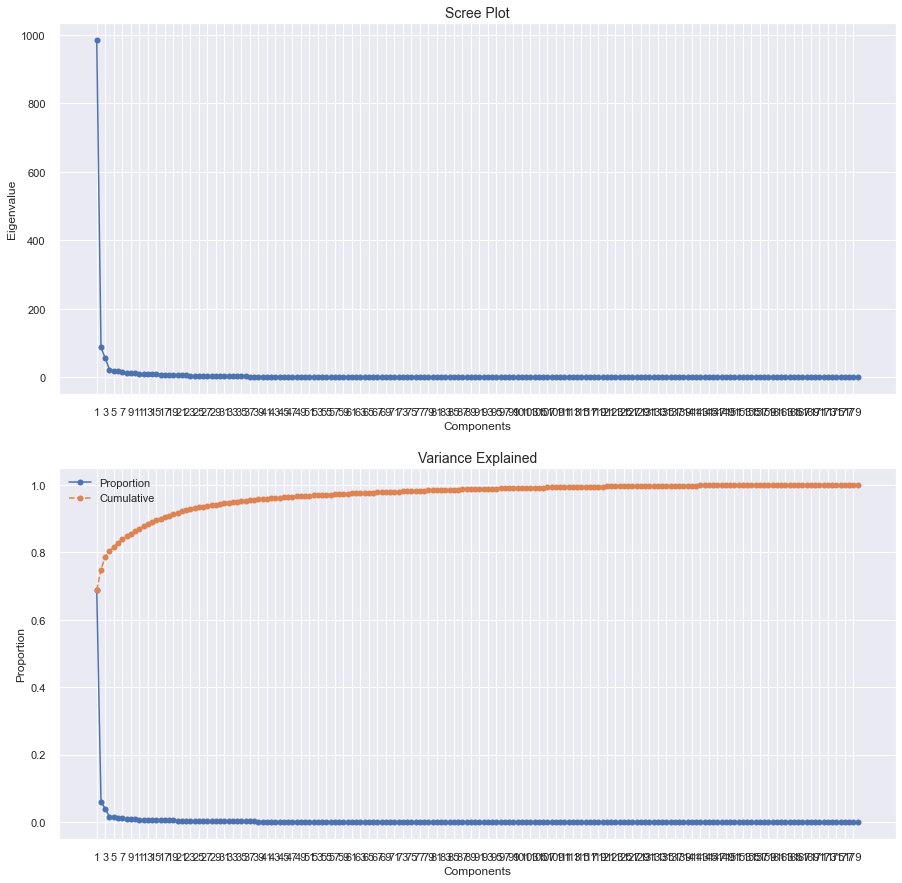

In [200]:
%matplotlib inline
# figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

#6

In [62]:
pca = PCA(n_components=12)
pca_feat = pca.fit_transform(df_pca1)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca1.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,
95515,-0.751333,-4.426104,0.670488,-2.287290,-0.779869,-2.306876,1.406971,1.577954,-1.568738,0.997834,-0.085384,-1.291616
148535,-8.806182,1.431876,-4.951528,-3.439178,2.105154,6.390179,1.300097,-1.016042,-0.488626,-0.625302,-0.850445,-3.111149
15078,2.336264,-5.799972,0.396369,1.392211,1.227567,-0.962122,2.892861,1.373784,-1.716029,0.765768,-1.491453,1.917454
172556,5.302748,-2.733647,-0.645307,0.669787,3.142362,3.060566,1.187513,-2.865033,-3.352153,-0.264840,0.424579,-2.878392
7112,3.726075,-1.899319,0.475165,-5.875772,0.453652,1.654155,-4.594545,0.237252,-3.709959,1.838731,2.002617,3.712759
...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-1.091798,3.890124,-3.719736,2.093350,0.666847,-0.287972,-3.413247,-1.166159,2.120947,0.290510,1.737145,0.768989
122706,-7.330273,0.141426,-5.475710,0.837990,1.899378,2.612403,-1.021036,0.458988,1.545331,-0.488760,-3.119715,-2.460406
189641,2.913057,1.421578,-3.902372,-2.299412,0.716477,-3.589849,-3.103416,-1.085530,0.760251,-0.695688,0.797088,3.047107


In [63]:
# Reassigning df to contain pca variables
df_pca1 = pd.concat([df_pca1, pca_df], axis=1)  #df_pca1 em vez disto se calhar devia ser df_[numerical_data] - para nao incluir a normalizacao
df_pca1.head()

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.086509,-0.338523,0.050855,-0.358988,-0.422835,-1.247156,0.678832,0.960261,0.479312,0.327897,-0.224496,-0.179596,0.621568,1.051195,-0.216806,-1.110308,-0.478566,0.681230,0.258971,-0.874927,-1.552550,0.460630,1.210839,0.479734,-0.118720,0.017942,-0.853606,0.930729,-0.477813,1.101575,-0.171259,0.882489,1.368552,-0.157247,-0.752745,-0.526735,-0.325346,0.697161,-0.112499,0.323648,-0.278623,-0.672060,-0.452524,-0.358454,-0.514375,0.734355,0.334001,-0.384968,-0.597158,0.355857,-0.569421,-0.620561,-0.540124,-0.178312,-0.350862,0.074884,-0.346385,0.460427,-0.986804,0.181499,-0.916867,0.992522,-0.771923,-0.430794,-0.746943,0.194403,-0.205294,-0.287805,-0.870425,-0.627282,-0.939944,-0.471781,-0.730396,-0.173710,0.224978,-0.722660,-0.642315,-1.372492,1.732091,0.090966,-1.189712,-0.422558,0.711092,-0.272122,0.609065,2.150247,0.296208,0.075970,-0.032736,-0.846110,2.366527,-1.040825,-1.174770,0.838547,-0.675166,-0.197490,0.091918,-1.025817,1.092855,0.198956,-0.774294,-1.276679,-0.398651,0.691514,-0.535559,-0.532246,-0.205395,0.743548,-0.955970,0.866227,-0.391722,1.007650,0.005225,0.416526,-1.052121,-0.627975,0.324470,-0.305274,0.810611,0.276310,-0.507761,0.738729,-0.785199,0.220081,0.511468,-0.928828,0.430324,0.119425,-0.356299,-0.639490,1.544228,-0.270152,-0.334070,0.032621,-0.327072,-0.363902,-0.464713,-0.194448,-0.279597,-0.747776,1.000027,-0.201772,0.774945,0.163142,-0.384927,0.114704,0.369640,0.891325,-0.112661,1.532715,0.396300,-0.372002,0.306880,1.062385,-0.573567,-0.716745,-0.474094,-0.512257,1.852503,-0.924568,0.174305,0.599212,-0.630055,-0.417499,1.454708,0.300810,-0.059802,0.542345,0.261454,1.180097,1.988099,-0.335988,0.124479,-0.318042,0.447558,-0.538735,-0.094676,0.644482,-0.494956,-0.525022,-0.751333,-4.426104,0.670488,-2.287290,-0.779869,-2.306876,1.406971,1.577954,-1.568738,0.997834,-0.085384,-1.291616
148535,-0.946586,1.346474,1.270683,1.353212,-0.108024,0.844495,-0.438279,-0.657695,-0.409721,-0.946888,-0.224496,0.719011,1.371582,-0.035180,0.118890,-1.110308,2.047416,2.133154,-0.488309,-1.078106,-0.081658,0.900738,0.495144,-0.069544,-1.685755,1.336857,-1.531849,-0.922413,0.100510,1.257063,-0.542827,-0.304290,-0.273476,-0.157247,-1.234281,-0.627212,-0.230213,1.868614,-1.033622,-0.570110,-0.707042,-1.243256,-0.696617,4.824462,-0.647139,2.039053,3.044366,0.511406,-0.597158,-0.937475,-0.703344,-0.620561,-0.540124,0.721560,2.398139,-1.532150,-0.668093,1.360934,-0.785711,-0.467609,-0.328953,0.286163,0.135452,-0.430794,-0.746943,0.736159,-0.365114,-0.863836,0.674864,1.242149,0.629053,0.779665,0.277352,-0.043400,0.463736,-0.722660,0.951496,1.596829,0.167366,1.560508,-0.472874,1.576710,-0.349106,-0.774545,-1.291891,-0.913347,-1.258289,-0.260236,-0.391622,-0.114033,-0.408632,-1.040825,-0.317466,1

In [89]:
metric_features = numeric_data.columns.tolist()

def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca1[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
AGE,0.039035,0.016014,0.019399,-0.024474,-0.011721,-0.017696,-0.007748,0.104394,-0.071666,0.014802,0.076837,0.079527
NUMCHLD,-0.002574,-0.027837,-0.032151,-0.006787,-0.017996,0.011057,-0.022390,-0.065880,0.050652,-0.048702,0.013994,0.005590
INCOME,-0.072806,0.215343,-0.065912,-0.107969,-0.083847,0.067366,-0.005533,-0.081799,0.197504,-0.043417,0.001207,-0.048137
HIT,0.009362,0.009554,-0.011198,-0.032880,-0.124548,0.028886,-0.080131,0.123279,0.125243,-0.134008,0.651419,0.638065
POP903,0.013516,0.031400,0.021810,0.101787,-0.023511,-0.006258,0.016024,-0.046984,-0.004242,0.077732,-0.244952,-0.092165
POP90C1,-0.546076,0.194847,0.027416,0.307183,-0.474209,-0.012733,-0.006265,0.146281,0.198881,-0.113078,-0.016966,0.020359
POP90C2,0.999897,0.013222,-0.004846,0.001193,-0.000519,0.000637,0.000140,-0.000190,0.000382,-0.000043,0.000376,-0.000671
POP90C3,-0.132178,-0.239714,-0.034330,-0.368441,0.543849,0.011404,0.006545,-0.181072,-0.236486,0.133498,0.005368,-0.016123
POP90C5,0.098677,0.006461,-0.148651,0.009375,-0.227839,-0.055057,-0.008511,0.323575,-0.140525,0.040982,-0.010674,0.053209
ETH1,0.062655,-0.019225,-0.119912,-0.623748,-0.093976,0.184315,-0.010033,0.134167,-0.013669,0.011115,0.014315,-0.108952


In [64]:
df = df_pca1.copy()
df_pca2 = pd.concat([df_pca1, std_data[categorical_data]], axis=1)  #depois arranjar, 
df_pca2

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.086509,-0.338523,0.050855,-0.358988,-0.422835,-1.247156,0.678832,0.960261,0.479312,0.327897,-0.224496,-0.179596,0.621568,1.051195,-0.216806,-1.110308,-0.478566,0.681230,0.258971,-0.874927,-1.552550,0.460630,1.210839,0.479734,-0.118720,0.017942,-0.853606,0.930729,-0.477813,1.101575,-0.171259,0.882489,1.368552,-0.157247,-0.752745,-0.526735,-0.325346,0.697161,-0.112499,0.323648,-0.278623,-0.672060,-0.452524,-0.358454,-0.514375,0.734355,0.334001,-0.384968,-0.597158,0.355857,-0.569421,-0.620561,-0.540124,-0.178312,-0.350862,0.074884,-0.346385,0.460427,-0.986804,0.181499,-0.916867,0.992522,-0.771923,-0.430794,-0.746943,0.194403,-0.205294,-0.287805,-0.870425,-0.627282,-0.939944,-0.471781,-0.730396,-0.173710,0.224978,-0.722660,-0.642315,-1.372492,1.732091,0.090966,-1.189712,-0.422558,0.711092,-0.272122,0.609065,2.150247,0.296208,0.075970,-0.032736,-0.846110,2.366527,-1.040825,-1.174770,0.838547,-0.675166,-0.197490,0.091918,-1.025817,1.092855,0.198956,-0.774294,-1.276679,-0.398651,0.691514,-0.535559,-0.532246,-0.205395,0.743548,-0.955970,0.866227,-0.391722,1.007650,0.005225,0.416526,-1.052121,-0.627975,0.324470,-0.305274,0.810611,0.276310,-0.507761,0.738729,-0.785199,0.220081,0.511468,-0.928828,0.430324,0.119425,-0.356299,-0.639490,1.544228,-0.270152,-0.334070,0.032621,-0.327072,-0.363902,-0.464713,-0.194448,-0.279597,-0.747776,1.000027,-0.201772,0.774945,0.163142,-0.384927,0.114704,0.369640,0.891325,-0.112661,1.532715,0.396300,-0.372002,0.306880,1.062385,-0.573567,-0.716745,-0.474094,-0.512257,1.852503,-0.924568,0.174305,0.599212,-0.630055,-0.417499,1.454708,0.300810,-0.059802,0.542345,0.261454,1.180097,1.988099,-0.335988,0.124479,-0.318042,0.447558,-0.538735,-0.094676,0.644482,-0.494956,-0.525022,-0.751333,-4.426104,0.670488,-2.287290,-0.779869,-2.306876,1.406971,1.577954,-1.568738,0.997834,-0.085384,-1.291616
148535,-0.946586,1.346474,1.270683,1.353212,-0.108024,0.844495,-0.438279,-0.657695,-0.409721,-0.946888,-0.224496,0.719011,1.371582,-0.035180,0.118890,-1.110308,2.047416,2.133154,-0.488309,-1.078106,-0.081658,0.900738,0.495144,-0.069544,-1.685755,1.336857,-1.531849,-0.922413,0.100510,1.257063,-0.542827,-0.304290,-0.273476,-0.157247,-1.234281,-0.627212,-0.230213,1.868614,-1.033622,-0.570110,-0.707042,-1.243256,-0.696617,4.824462,-0.647139,2.039053,3.044366,0.511406,-0.597158,-0.937475,-0.703344,-0.620561,-0.540124,0.721560,2.398139,-1.532150,-0.668093,1.360934,-0.785711,-0.467609,-0.328953,0.286163,0.135452,-0.430794,-0.746943,0.736159,-0.365114,-0.863836,0.674864,1.242149,0.629053,0.779665,0.277352,-0.043400,0.463736,-0.722660,0.951496,1.596829,0.167366,1.560508,-0.472874,1.576710,-0.349106,-0.774545,-1.291891,-0.913347,-1.258289,-0.260236,-0.391622,-0.114033,-0.408632,-1.040825,-0.317466,1

In [62]:
# Do this after checking the new pandas profiling report
#df_pca2.drop(columns=['PC11], inplace=True)

In [65]:
pc_features = df_pca2.columns[df_pca2.columns.str.startswith('PC')]#.drop(['PCOWNERS'])
df_pca2[pc_features]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,
95515,-0.751333,-4.426104,0.670488,-2.287290,-0.779869,-2.306876,1.406971,1.577954,-1.568738,0.997834,-0.085384,-1.291616
148535,-8.806182,1.431876,-4.951528,-3.439178,2.105154,6.390179,1.300097,-1.016042,-0.488626,-0.625302,-0.850445,-3.111149
15078,2.336264,-5.799972,0.396369,1.392211,1.227567,-0.962122,2.892861,1.373784,-1.716029,0.765768,-1.491453,1.917454
172556,5.302748,-2.733647,-0.645307,0.669787,3.142362,3.060566,1.187513,-2.865033,-3.352153,-0.264840,0.424579,-2.878392
7112,3.726075,-1.899319,0.475165,-5.875772,0.453652,1.654155,-4.594545,0.237252,-3.709959,1.838731,2.002617,3.712759
...,...,...,...,...,...,...,...,...,...,...,...,...
184568,-1.091798,3.890124,-3.719736,2.093350,0.666847,-0.287972,-3.413247,-1.166159,2.120947,0.290510,1.737145,0.768989
122706,-7.330273,0.141426,-5.475710,0.837990,1.899378,2.612403,-1.021036,0.458988,1.545331,-0.488760,-3.119715,-2.460406
189641,2.913057,1.421578,-3.902372,-2.299412,0.716477,-3.589849,-3.103416,-1.085530,0.760251,-0.695688,0.797088,3.047107


https://www.dummies.com/programming/big-data/data-science/python-for-data-science-developing-a-multivariate-approach-to-find-outliers/

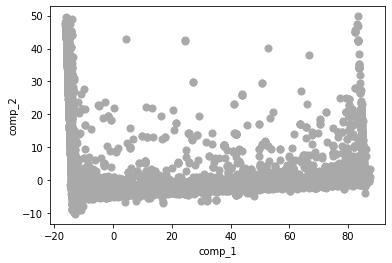

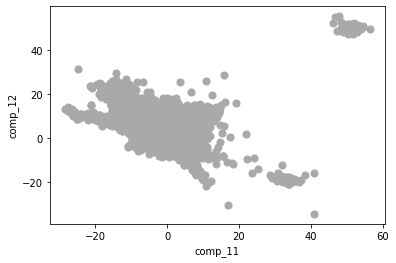

In [93]:
df9 = pd.DataFrame(pca_feat, columns=['comp_'+str(j+1) for j in range(12)])
first_two = df9.plot(kind='scatter', x='comp_1', y='comp_2', c='DarkGrey', s=50)
last_two = df9.plot(kind='scatter', x='comp_11', y='comp_12', c='DarkGrey', s=50)

nao usamos , 12x12


In [94]:
df

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
148535,-0.736842,1.0,1.0,5.333333,0.518331,0.000000,0.0,0.000000,-0.333333,-1.733333,0.0,2.0,0.0,1.5,1.166667,0.000000,0.2,-1.000,1.857143,2.25,-0.4,-0.833333,0.000000,1.00,0.50,0.00,-1.714286,2.000000,-1.2,-0.8,0.375,0.771429,-0.333333,0.0,0.0,0.0,-0.80,-0.375,0.2500,1.30,-0.818182,0.0,-0.4,-1.000000,-0.50,47.0,-0.4,1.9,3.5,1.0,0.000000,-0.666667,-0.285714,-0.133333,0.0,0.266667,0.207721,-0.757009,0.705882,3.038659,-1.176471,-0.333333,0.958333,-0.454545,-0.45,-0.083333,0.083333,0.250,0.0,-0.75,1.333333,-0.5,-0.391304,0.714286,1.6,0.318182,0.5625,0.1875,-0.117647,0.35,-0.444444,0.9,1.444444,0.333333,1.500000,-0.285714,2.0,0.0,-0.666667,-0.875,-0.571429,-1.00,0.000000,0.00,0.00,-0.230769,-0.75,0.000000,1.00,0.142857,1.0,0.000000,0.0,1.5,0.4,0.0,1.25,-0.75,0.0,-0.25,-0.333333,1.8,-0.153846,0.0,-0.111111,-0.636364,-1.214286,0.000000,0.2,1.384615,2.142857,2.75,0.125,1.0,0.857143,1.00,-1.333333,-0.5,1.470588,-0.727273,-1.000000,-0.750000,0.0,-0.6,-1.0,-0.625,1.0,1.0,-0.50,1.0,1.0,0.0,0.0,3.0,-1.0,0.0,0.0,-0.62500,1.25,13.5,4.666667,0.571429,1.208333,2.266667,-0.2,0.666667,1.333333,-0.557692,0.507042,-0.285714,-0.435897,0.00,-0.2,-0.055556,0.076923,0.0,0.2,4.000000,2.0,0.000000,-0.25,0.0,0.0,0.5,-0.333333,-0.6,0.714286,-0.019342,0.888889,-0.401316,1.0,0.000000,-0.654513,2.000000,0.57

In [95]:
outlying = (pca_feat[:,-1] < 1.4) & (pca_feat[:,-4] < 1.3)
df[outlying]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,ETH11,ETH16,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,MSA,ADI,DMA,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,0.052632,0.0,0.0,0.000000,-0.323641,-1.000000,35.0,1.203704,0.666667,-0.066667,0.0,0.0,0.0,-0.5,0.500000,1.000000,-0.2,-1.000,-0.285714,0.75,0.2,-0.666667,-1.666667,0.50,1.25,0.75,0.000000,0.333333,-0.6,1.0,-0.250,0.657143,0.333333,7.0,7.0,0.0,-0.40,-0.250,0.1250,0.40,0.181818,1.0,0.0,-0.428571,-0.25,0.0,-0.2,0.7,0.5,0.0,0.000000,0.444444,-0.142857,-0.133333,0.0,-0.433333,-0.615809,0.009346,0.197479,-0.123545,0.117647,0.000000,0.333333,-0.636364,0.05,-0.583333,0.750000,-0.500,0.0,-0.75,0.666667,0.0,0.086957,-0.714286,-0.4,-0.863636,-0.5000,-0.6250,-0.235294,0.15,-0.444444,-0.4,-0.888889,1.666667,0.166667,-0.857143,0.0,1.0,-0.166667,0.500,2.000000,0.25,0.333333,0.50,-0.75,1.923077,-0.75,-0.666667,0.75,-0.571429,0.0,0.333333,-1.5,1.5,0.2,-0.6,-1.25,-0.25,0.8,-0.25,-0.333333,0.0,0.538462,-0.6,1.111111,-0.181818,0.714286,0.000000,0.4,-0.615385,-0.285714,0.50,-0.375,0.5,0.142857,-0.50,0.666667,-0.5,0.235294,0.454545,-0.666667,0.583333,1.0,-0.2,-1.0,1.875,0.0,0.0,0.25,0.0,0.0,-1.0,0.0,0.0,-1.0,2.0,0.0,0.46875,1.50,0.0,0.666667,0.142857,0.583333,0.000000,1.4,1.666667,-0.066667,0.326923,0.422535,-0.285714,-0.282051,0.00,-0.2,3.555556,-1.057692,0.0,0.2,-0.666667,0.0,1.333333,0.25,0.0,0.0,1.0,1.811111,2.0,0.000000,0.255319,-0.555556,1.063596,-0.5,0.000000,0.455469,-0.333333,-0.552850,21.582011,-2.730909,5.057629,-4.713950,-1.415309,-3.716391,-0.398462,-2.929659,0.201314,-0.881070,0.882849,-1.085159
15078,0.000000,0.0,-0.5,0.666667,2.630847,-1.000000,2.0,1.814815,0.000000,0.200000,0.0,0.0,0.0,-0.5,0.166667,0.666667,0.2,-0.250,-0.142857,0.50,0.2,-0.166667,-0.666667,-0.50,0.50,1.00,0.285714,-0.333333,-0.2,0.4,-0.250,-0.085714,0.000000,3.0,3.0,0.0,-0.08,0.125,0.8125,0.15,0.000000,1.0,0.0,-0.142857,-0.25,0.0,0.4,-0.3,0.0,1.0,1.846154,0.111111,0.000000,0.066667,3.0,-1.400000,-0.615809,0.495327,-0.491597,-0.300988,0.117647,0.666667,-0.500000,0.272727,0.45,-0.166667,-0.416667,1.250,0.0,-0.25,0.000000,0.0,0.434783,0.000000,0.4,-0.136364,-0.1250,0.1250,0.705882,0.60,0.000000,-0.3,-0.666667,-0.333333,-1.000000,-0.428571,0.0,0.0,-0.166667,0.875,2.142857,0.25,1.333333,1.25,1.25,1.307692,0.00,0.333333,-0.50,-0.714286,-0.6,-0.333333,-0.5,-0.5,-0.2,0.2,-0.75,-0.25,0.0,1.00,-0.333333,0.2,0.230769,-0.4,1.777778,0.727273,-0.071429,-0.555556,0.0,-0.538462,-0.285714,-0.50,0.000,-0.5,-0.285714,0.00,-0.833333,-0.5,-0.117647,0.454545,0.000000,-0.083333,1.0,1.8,0.0,-0.375,0.0,0.0,0.75,-0.5,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.78125,0.25,0.0,-0.666667,-0.428571,0.083333,0.666667,0.6,1.000000,0.233333,0.038462,-0.845070,0.571429,0.358974,11.00,2.8,4.222222,-1.500000,-2.0,-1.2,0.333333,0.0,0.000000,-0.25,0.0,0.0,1.0,1.388889,2.0,-0.428571,0.431979,-0.111111,2.335526,-1.0,0.000000,0.272564,1.000000,-0.5898

https://www.datasciencelearner.com/projection-detecting-outliers-dbscan-method/

In [66]:
# Based on the hyperparameters found in the previous class
dbscan = DBSCAN(eps=7.3, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_pca2[pc_features])
Counter(dbscan_labels)


#5618 com 6
#3634 com 7
#3225 com 7.3

Counter({0: 92408, -1: 492})

In [94]:
(92900-4645)/data.shape[0]

0.9249884710518593

In [68]:
df_pca2[dbscan_labels==-1]

,AGE,NUMCHLD,INCOME,HIT,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
142846,0.017636,-0.338523,0.050855,-0.358988,-0.045157,0.844495,-0.438279,-0.657695,-4.558541,-0.538957,-0.224496,0.719011,-1.253469,-1.664741,8.343450,-0.315079,-1.825757,-2.464606,-2.481057,-0.468570,-0.964193,-3.720391,-2.844765,6.338691,-0.249306,-0.773406,-1.305768,-1.334223,6.693396,-2.591267,-0.542827,3.425587,-0.273476,5.417547,3.195857,0.277085,-0.039947,-3.142604,5.497977,-1.463868,-1.135461,5.182705,7.602555,5.100149,5.991089,-2.962289,-1.924636,1.407781,-0.597158,-1.454808,-0.435499,4.712726,-0.540124,0.892964,0.057971,-1.824338,-0.989801,-0.019843,3.537778,-2.479844,2.022701,-3.510517,-1.225610,0.461682,7.465826,-0.347354,-0.365114,-0.811469,-0.406838,-0.627282,-0.215792,-1.060696,1.052543,-1.085879,-0.252538,-0.722660,2.300105,-0.241322,0.949728,-0.092726,1.140012,-0.422558,0.180993,-0.272122,-1.637519,-0.743148,-0.947390,-1.268857,-0.571065,-1.334162,-1.102422,-1.040825,-0.746118,-1.103727,-0.508625,0.665971,-0.235378,-0.406165,-0.249889,0.872821,3.923726,2.417034,-0.643738,-0.724946,5.186579,-0.772741,0.162113,-2.100286,0.200444,-1.070052,-1.319625,-2.308450,-0.720303,-0.476840,1.013157,5.471929,0.324470,5.435575,-1.401965,-2.305070,10.325174,-2.032422,-0.785199,0.780247,0.615342,-0.988224,1.085356,0.119425,-0.825749,0.092774,-0.636564,1.136560,-0.33407,0.334911,0.071299,-0.363902,-0.464713,-0.194448,1.118766,0.272438,-0.578015,2.358273,-0.827660,-0.085368,2.873806,1.886165,-1.031248,-1.993400,-1.509281,-1.495302,-0.434358,2.092013,-0.270257,0.329530,-0.573567,0.141887,-0.474094,-0.512257,-0.571189,0.754223,0.174305,0.599212,-2.362328,-2.790221,-1.367977,-1.252118,-0.059802,0.542345,0.039344,-0.271984,-0.895689,1.380826,-0.660785,0.285247,-0.628496,0.722663,-0.094676,-1.185952,-0.112094,1.007312,5.259410,17.772719,-0.564579,2.161207,16.513859,-0.161554,4.185285,8.242253,0.685949,0.663952,4.006036,-0.135338
87813,0.017636,-0.338523,0.050855,-0.358988,-0.575041,0.844495,-0.438279,-0.657695,-3.669508,0.684836,-0.224496,-0.179596,-7.253586,2.137569,-0.720350,1.805533,-1.488959,-1.496657,0.009878,3.391822,4.919379,-7.021197,3.119359,-2.632837,0.795384,-1.037189,0.955043,-0.716509,3.107791,1.257063,-0.542827,2.747427,-0.273476,4.403948,0.017714,-0.024347,-0.658311,-1.255262,2.399654,-1.463868,-1.349671,2.326722,3.697062,-0.358454,-0.647139,1.277979,-0.117726,-1.281343,-0.597158,2.425188,-0.703344,-0.620561,-0.540124,-0.435418,0.085942,-1.970431,-0.989801,3.342048,-1.087350,3.102485,-1.210824,-1.921209,-1.981755,-0.430794,4.180719,3.986700,-0.365114,-0.968569,-2.261184,5.167954,-3.655516,2.104725,1.362620,2.237023,2.970693,-0.722660,-1.745722,2.021018,-1.397359,-2.297038,-2.802598,-0.422558,-0.879205,5.756957,2.682835,-1.083547,-1.258289,-1.268857,-0.571065,-1.578188,-1.697098,-1.354454,

In [89]:
lof = LocalOutlierFactor(n_neighbors=20, contamination=.05)
lof_labels = lof.fit_predict(df_pca2[pc_features])
Counter(lof_labels)

Counter({1: 88255, -1: 4645})

In [90]:
outliers = df_pca2[lof_labels==-1].merge(df_pca2[dbscan_labels==-1], on='CONTROLN')
outliers_ = outliers.merge(df_pca2[filtered_entries == False], on='CONTROLN')
outliers_.index

Int64Index([ 87813,  42329,   3583, 159410, 143714, 146172, 185128, 188411,
             13048,  32288,
            ...
            184941, 157243, 161153,   7916, 135438,  96541,  94564,   6648,
             33495, 185114],
           dtype='int64', name='CONTROLN', length=248)

In [92]:
(92900-len(outliers_.index))/data.shape[0]  #percentage of data prevailed after taking outliers

0.9710728210288014

In [91]:
#save the outliers in the dataframe

df_outliers = df_.loc[outliers_.index.to_list(),:]
df_outliers   

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
87813,NaN,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,10,99,0,0,39,99,0,0,0,33,8,36,12,8,12,33,33,0,33,1,40,0,15,4,50,99,0,18,0,18,30,9,0,40,46,0,0,30,20,0,0,66,14,3,0,30,0,0,0,67,16584,0,0,99,0,99,0,55,0,0,27,18,0,0,5,33,0,99,71,99,99,0,0,27,0,0,0,0,0,45,27,0,0,0,0,0,0,0,0,27,27,0,0,27,0,0,0,18,0,0,0,0,18,82,0,0,0,20,0,30,50,0,0,38,19,0,19,0,0,0,0,0,0,0,0,0,42,0,0,0,0,0,0,0,0,0,0,0,79,23,0,0,99,44,0,29,0,0,44,99,0,0,0,0,99,56,99,99,14,4,15,0,333.0,3,9,15.0,0,15.0,822.0,15.0,822.0,15.0,822.0,NaN,NaN,15.000000,1,2,0.0,0.0,1.0,0.0,0.0,0.0
42329,41.0,0,NaN,3.0,1,12,0,0,1,0,1,0,1,1,1,1,0,0,1,0,0,0,0,0,0,0,31,0,0,99,54,99,0,0,25,0,14,4,3,17,19,50,0,25,25,0,71,0,9,4,8,2,0,17,0,17,3,77,49,74,27,0,3,10,6,0,1,44,13,1,97,0,0,0,3,0,12888,38,0,81,37,0,99,99,0,0,0,0,0,99,20,0,99,0,40,99,0,0,0,0,0,50,0,0,0,50,0,0,0,0,0,0,50,0,0,0,0,0,0,0,50,0,0,0,0,0,0,0,0,99,0,0,12,38,12,10,12,16,0,17,9,9,0,99,23,0,52,71,0,0,10,11,20,0,0,13,0,0,0,0,0,0,0,0,19,0,0,0,99,35,0,0,76,99,0,0,0,99,0,0,9,91,99,99,0,0,38,0,333.0,6,13,37.0,2,5.0,1187.0,15.0,730.0,15.0,730.0,1064.0,4.0,9.250000,1,2,0.0,1.0,0.0,0.0,0.0,0.0
3583,37.0,0,0.0,1.0,0,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,141,0,99,0,65,92,0,0,38,14,7,6,7,7,15,22,13,30,22,13,27,1,12,38,13,22,2,2,0,2,86,12,0,26,48,1,4,16,3,0,48,33,10,4,0,10,4,71,0,93,11370,72,9,46,30,37,25,66,0,0,0,34,0,9,11,0,0,43,0,0,0,0,0,0,0,41,0,0,0,50,0,0,9,0,0,0,0,9,0,0,72,19,0,0,0,0,0,0,0,0,0,0,0,99,0,24,23,43,3,3,3,0,0,6,0,2,4,36,0,11,22,67,0,0,5,0,22,0,5,9,0,0,0,0,0,0,3,0,31,0,0,0,50,10,6,3,0,0,81,3,6,79,11,0,0,99,99,99,0,3,8,4,333.0,5,26,45.0,0,5.0,1552.0,15.0,1005.0,15.0,670.0,1187.0,12.0,11.250000,1,2,0.0,0.0,0.0,0.0,1.0,0.0
159410,NaN,0,0.0,NaN,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8,99,0,0,29,76,0,0,33,67,17,28,11,17,22,0,0,0,50,50,38,0,16,0,37,36,9,14,0,14,88,27,0,50,29,0,0,50,0,0,9,46,12,4,45,50,0,0,38,29,18000,0,0,0,0,0,99,0,0,0,99,0,0,0,3,0,0,99,0,0,0,0,0,0,0,0,0,0,0,0,99,0,0,0,0,0,99,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,99,0,0,0,0,0,0,99,0,0,44,0,0,44,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,99,0,0,0,99,99,0,3,0,0,0,99,0,0,0,0,0,99,99,99,0,0,0,0,333.0,6,13,76.0,2,15.0,2191.0,25.0,914.0,25.0,914.0,1856.0,11.0,19.000000,1,3,1.0,0.0,0.0,0.0,0.0,0.0
143714,77.0,1,0.0,1.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,667,99,0,0,57,8,0,0,38,14,29,33,21,9,5,19,21,34,17,9,18,21,16,5,58,2,3,0,0,0,99,6,0,18,6,4,62,3,1,0,40,34,21,11,0,3,7,85,0,36,3261,8,76,1,64,61,7,36,49,13,2,0,0,2,31,5,92,30,15,10,2,63,2,4,0,15,22,0,0,5,11,27,9,3,2,12,27,12,0,6,10,11,3,3,0,0,2,0,13,7,2,16,5,63,7,22,36,29,11,1,1

### Remove the outliers to the non standardized dataset

In [95]:
df_.drop(outliers_.index, axis=0,inplace=True)
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3

In [96]:
#df_.to_csv('sem_outliers.csv')

In [5]:
#correr isto para importar o df sem outliers 
df_ = pd.read_csv('sem_outliers.csv')

In [6]:
df_.set_index('CONTROLN', inplace=True)

In [7]:
df_

,AGE,HOMEOWNR,NUMCHLD,INCOME,GENDER,HIT,MAJOR,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES,PEPSTRFL,POP903,POP90C1,POP90C2,POP90C3,POP90C5,ETH1,ETH3,ETH7,CHIL2,CHIL3,AGEC1,AGEC2,AGEC3,AGEC4,AGEC5,CHILC1,CHILC2,CHILC3,CHILC4,CHILC5,HHN2,HHN6,MARR2,MARR3,MARR4,DW2,DW3,DW7,DW8,DW9,HU2,HU4,HU5,HHD3,HHD6,HHD8,HHD9,HHD10,HHD12,HVP6,HUR1,RHP2,RHP3,RHP4,HUPA3,HUPA4,HUPA5,HUPA6,HUPA7,RP4,IC5,HHAS1,HHAS2,HHAS3,HHAS4,MC2,MC3,TPE1,TPE2,TPE3,TPE8,TPE9,PEC1,PEC2,TPE10,TPE12,TPE13,LFC4,LFC5,LFC6,LFC7,LFC10,OCC1,OCC2,OCC3,OCC4,OCC5,OCC6,OCC7,OCC8,OCC10,OCC11,OCC12,OCC13,EIC1,EIC3,EIC4,EIC5,EIC6,EIC7,EIC8,EIC9,EIC10,EIC11,EIC12,EIC13,EIC14,EIC15,EIC16,OEDC1,OEDC2,OEDC3,OEDC4,OEDC5,OEDC6,EC2,EC3,EC4,EC5,EC6,EC7,EC8,SEC1,SEC2,SEC3,SEC4,SEC5,AFC5,AFC6,VC1,VC2,VC3,VC4,ANC1,ANC2,ANC3,ANC4,ANC5,ANC6,ANC7,ANC8,ANC9,ANC10,ANC11,ANC12,ANC13,ANC14,ANC15,POBC2,LSC2,LSC3,LSC4,VOC1,VOC2,VOC3,HC1,HC3,HC5,HC8,HC11,HC12,HC13,HC14,HC16,HC18,HC19,HC20,HC21,MHUC1,MHUC2,AC1,AC2,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,60.0,0,0.0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,332,0,35,65,53,92,0,0,42,27,11,14,18,17,13,12,11,34,25,18,33,4,7,12,19,95,2,7,7,0,14,4,7,70,16,2,5,9,3,0,1,61,15,4,0,14,1,0,0,73,12883,28,4,51,1,54,3,88,8,0,0,4,1,13,14,2,45,64,44,62,53,0,9,3,8,13,9,0,3,9,15,19,5,4,3,3,41,1,0,7,13,6,5,0,4,9,4,1,3,10,2,1,7,78,2,16,10,39,21,8,4,3,5,20,3,19,4,39,0,34,23,18,16,1,4,0,23,0,0,5,1,0,0,0,0,0,2,0,74,8,0,4,96,77,19,13,5,14,46,90,0,10,0,0,65,40,99,99,6,2,10,7,333.0,6,14,240.0,14,5.0,1978.0,12.0,1429.0,10.0,761.0,2862.0,4.0,7.741935,4,1,0.0,0.0,1.0,0.0,0.0,0.0
148535,45.0,1,1.0,6.0,1,16,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,998,99,0,0,50,67,0,2,46,21,13,14,33,23,10,11,16,36,22,15,21,9,4,3,24,99,0,0,0,0,4,3,9,88,5,1,3,5,2,94,0,73,21,5,0,4,0,0,0,94,36175,6,2,66,3,44,9,80,14,0,0,6,0,2,24,12,71,81,57,64,57,0,22,24,4,21,13,2,1,6,4,1,0,3,1,6,13,1,2,8,18,11,4,3,4,10,7,11,1,6,2,1,16,69,5,5,5,12,21,7,30,20,14,24,4,24,10,15,0,55,10,11,0,0,2,0,3,1,1,2,3,1,1,0,3,0,0,0,39,7,27,16,99,92,53,5,2,56,0,96,0,4,0,0,0,99,99,99,20,4,6,5,333.0,6,13,47.0,1,10.0,1552.0,25.0,761.0,25.0,761.0,1005.0,18.0,15.666667,2,3,1.0,0.0,0.0,0.0,0.0,0.0
15078,NaN,0,0.0,3.0,1,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2669,0,2,98,51,96,0,0,40,25,13,20,19,16,13,15,14,30,22,19,35,2,9,9,19,69,1,3,3,0,22,7,18,65,14,2,5,11,3,0,4,51,14,5,24,11,2,3,6,44,11576,28,8,31,11,62,8,74,22,0,2,2,1,21,19,6,61,70,56,78,62,4,10,5,2,6,12,0,1,9,18,20,5,7,6,11,33,4,3,2,12,3,3,2,0,7,8,3,3,6,7,1,8,74,3,22,20,28,16,6,5,3,1,23,1,16,6,21,0,28,23,32,8,1,14,1,5,0,0,7,0,0,0,0,0,1,0,0,84,3,0,0,92,65,29,9,3,23,31,0,6,35,44,15,77,17,97,92,9,2,6,5,333.0,6,14,202.0,14,2.0,2252.0,16.0,2009.0,5.0,761.0,2556.0,12.0,7.481481,4,1,0.0,0.0,0.0,0.0,1.0,0.0
172556,69.0,0,0.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,219,0,8,92,46,61,0,2,35,20,15,25,17,17,12,20,17,30,14,19,27,8,9,6,23,83,3,2,0,2,52,7,6,61,16,3,3,21,4,10,15,50,15,5,9,42,4,0,5,34,15130,22,14,26,20,54,3,58,36,0,6,0,0,17,13,0,43,68,45,33,31,23,17,3,0,6,6,0,0,13,12,0,0,0,42,6,3,0,0,0,23,3,3,6,0,3,3,3,3,3,0,3,6,87,0,28,12,14,27,10,3,5,0,19,1,17,0,23,0,14,40,31,16,0,1,0,13,0,0,4,0,0,0,3,0,0,0,0,67,41,3,0,94,43,27,4,0,19,55,45,22,17,0,16,77,22,93,89,16,2,6,6,333.0,6,14,109.0,7,2.0,3713.0,11.0,1156.0,10.0,761.0,3713.0,9.0,6.812500,4,1,1.0,0.0,0.0,0.0,0.0,0.0
7112,77.0,1,1.0,3.0,0,60,0,0,0,1,1,0,0,0,1,0,0,1,0,1,0,1,0,1,0,0,761,99,0,0,54,2,0,0,43,23,14,21,13,15,20,13,15,34,19,19,26,14,17,9,33,98,0,0,0,0,10,3,0,49,8,3,17,9,1,0,2,53,16,6,0,9,0,0,0,83,9836,35,8,11,14,80,4,73,22,1,3,1,2,1,24,3,76,65,49,80,31,10,17,8,2,6,15,3

### Divide the data by different perspectives

<a class="anchor" id="div">

In [98]:
df_.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92652 entries, 95515 to 4693
Data columns (total 210 columns):
AGE             float64
HOMEOWNR        int64
NUMCHLD         float64
INCOME          float64
GENDER          int64
HIT             int64
MAJOR           int64
COLLECT1        int64
VETERANS        int64
BIBLE           int64
CATLG           int64
HOMEE           int64
PETS            int64
CDPLAY          int64
STEREO          int64
PCOWNERS        int64
PHOTO           int64
CRAFTS          int64
FISHER          int64
GARDENIN        int64
BOATS           int64
WALKER          int64
KIDSTUFF        int64
CARDS           int64
PLATES          int64
PEPSTRFL        int64
POP903          int64
POP90C1         int64
POP90C2         int64
POP90C3         int64
POP90C5         int64
ETH1            int64
ETH3            int64
ETH7            int64
CHIL2           int64
CHIL3           int64
AGEC1           int64
AGEC2           int64
AGEC3           int64
AGEC4           int64
A

#demographic: 'AGE', 'NUMCHLD', 'STATE', 'HOMEOWNR', 'GENDER', 'INCOME', 'STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX'


#summary:  'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR'


#census: 'POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 'ETH11', 'ETH16', 'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'MSA', 'ADI', 'DMA', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2'    

-PCA?


#interests:  'HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS', 'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES', 'PEPSTRFL'

In [8]:
demographic = ['AGE', 'NUMCHLD', 'HOMEOWNR', 'GENDER', 'INCOME', 
              'STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX']


summary = [ 'MAXADATE', 'CARDPM12', 'NUMPRM12', 'RAMNTALL', 'CARDGIFT', 'MINRAMNT', 
           'MINRDATE', 'MAXRAMNT', 'MAXRDATE', 'LASTGIFT', 'LASTDATE', 'NEXTDATE', 
           'TIMELAG', 'AVGGIFT', 'RFA_2F',  'RFA_2A', 'MAJOR','PEPSTRFL']


census = ['POP903', 'POP90C1', 'POP90C2', 'POP90C3', 'POP90C5', 'ETH1', 'ETH3', 'ETH7', 
          'CHIL2', 'CHIL3', 'AGEC1', 'AGEC2', 'AGEC3', 'AGEC4', 'AGEC5', 'CHILC1', 'CHILC2', 'CHILC3', 'CHILC4', 
          'CHILC5', 'HHN2', 'HHN6', 'MARR2', 'MARR3', 'MARR4', 'DW2', 'DW3', 'DW7', 'DW8', 'DW9', 'HU2', 'HU4', 'HU5', 
          'HHD3', 'HHD6', 'HHD8', 'HHD9', 'HHD10', 'HHD12', 'HVP6', 'HUR1', 'RHP2', 'RHP3', 'RHP4', 'HUPA3', 'HUPA4', 
          'HUPA5', 'HUPA6', 'HUPA7', 'RP4', 'IC5', 'HHAS1', 'HHAS2', 'HHAS3', 'HHAS4', 'MC2', 
          'MC3', 'TPE1', 'TPE2', 'TPE3', 'TPE8', 'TPE9', 'PEC1', 'PEC2', 'TPE10', 'TPE12', 'TPE13', 'LFC4', 'LFC5', 
          'LFC6', 'LFC7', 'LFC10', 'OCC1', 'OCC2', 'OCC3', 'OCC4', 'OCC5', 'OCC6', 'OCC7', 'OCC8', 'OCC10', 'OCC11', 
          'OCC12', 'OCC13', 'EIC1', 'EIC3', 'EIC4', 'EIC5', 'EIC6', 'EIC7', 'EIC8', 'EIC9', 'EIC10', 'EIC11', 'EIC12', 
          'EIC13', 'EIC14', 'EIC15', 'EIC16', 'OEDC1', 'OEDC2', 'OEDC3', 'OEDC4', 'OEDC5', 'OEDC6', 'EC2', 'EC3', 'EC4', 
          'EC5', 'EC6', 'EC7', 'EC8', 'SEC1', 'SEC2', 'SEC3', 'SEC4', 'SEC5', 'AFC5', 'AFC6', 'VC1', 'VC2', 'VC3', 'VC4', 
          'ANC1', 'ANC2', 'ANC3', 'ANC4', 'ANC5', 'ANC6', 'ANC7', 'ANC8', 'ANC9', 'ANC10', 'ANC11', 'ANC12', 'ANC13', 
          'ANC14', 'ANC15', 'POBC2', 'LSC2', 'LSC3', 'LSC4', 'VOC1', 'VOC2', 'VOC3', 'HC1', 'HC3', 'HC5', 'HC8', 'HC11', 
          'HC12', 'HC13', 'HC14', 'HC16', 'HC18', 'HC19', 'HC20', 'HC21', 'MHUC1', 'MHUC2', 'AC1', 'AC2']    




interests = ['HIT', 'COLLECT1', 'VETERANS', 'BIBLE', 'CATLG', 'HOMEE', 'PETS', 'CDPLAY', 'STEREO', 'PCOWNERS',
             'PHOTO', 'CRAFTS', 'FISHER', 'GARDENIN', 'BOATS', 'WALKER', 'KIDSTUFF', 'CARDS', 'PLATES']


df_dem = df_[demographic].copy()
df_sum = df_[summary].copy()
df_cen = df_[census].copy()
df_int = df_[interests].copy()

In [9]:
imp_mean = IterativeImputer(random_state=0)
df_complete = imp_mean.fit_transform(df_dem[df_dem.columns])
df_dem[df_dem.columns] = df_complete

In [10]:
#arrendondar unidade
to_round = ['AGE', 'NUMCHLD', 'INCOME']

df_dem[to_round] = df_dem[to_round].apply(np.ceil).astype(int)

#, 'NEXTDATE', 'TIMELAG'

In [11]:
df_complete1 = imp_mean.fit_transform(df_sum[df_sum.columns])
df_sum[df_sum.columns] = df_complete1

In [12]:
#arrendondar unidade
to_round1 = ['NEXTDATE', 'TIMELAG']

df_sum[to_round1] = df_sum[to_round1].apply(np.ceil).astype(int)

In [13]:
#desvio padrão

sd =[] 
for col in df_cen:
    sd.append(np.std(df_cen[col]))
sd = pd.DataFrame(sd, index=df_cen.columns).sort_values([0] , ascending=False)
df_cen = df_cen[sd[sd[0]>10].index]

In [14]:
df_cen

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,HC16,OEDC5,MC3,EIC4,AFC5
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,12883,332,0,65,90,40,35,46,10,65,95,14,73,74,7,14,92,13,0,77,0,18,53,51,45,54,70,62,0,34,28,64,44,0,8,16,88,19,16,0,78,3,41,39
148535,36175,998,99,0,96,99,0,0,4,0,99,56,94,39,9,4,67,2,94,92,0,11,57,66,71,44,88,64,0,55,6,81,57,0,7,5,80,53,0,0,69,9,13,15
15078,11576,2669,0,98,0,17,2,31,35,77,69,23,44,84,18,22,96,21,0,65,3,32,62,31,61,62,65,78,24,28,28,70,56,6,3,14,74,29,8,15,74,8,33,21
172556,15130,219,0,92,45,22,8,55,17,77,83,19,34,67,6,52,61,17,10,43,0,31,31,26,43,54,61,33,9,14,22,68,45,22,41,16,58,27,16,16,87,3,3,23
7112,9836,761,99,0,9,21,0,67,72,1,98,3,83,65,0,10,2,1,0,45,0,53,31,11,76,80,49,80,0,9,35,65,49,14,0,8,73,18,20,0,49,4,1,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35088,11390,628,0,99,0,0,0,8,69,99,58,44,75,41,25,13,88,48,0,72,0,41,55,37,69,56,74,72,40,37,31,75,50,29,2,15,66,33,5,0,83,7,13,40
184568,18807,10037,99,0,86,98,0,9,12,7,38,32,97,26,3,44,78,2,0,60,12,11,57,70,69,37,56,69,13,48,9,83,69,1,3,17,76,19,25,1,59,27,4,35
122706,26538,361,96,4,82,67,0,6,16,31,88,90,79,51,0,12,91,3,5,84,0,19,43,61,61,17,85,48,10,43,8,87,52,2,3,4,80,29,15,0,78,36,9,31


In [15]:
df_dem.reset_index(inplace=True)
dem = df_dem.columns.to_list()
dem.remove('CONTROLN')

df_sum.reset_index(inplace=True)
sum_ = df_sum.columns.to_list()
sum_.remove('CONTROLN')

df_cen.reset_index(inplace=True)
cen = df_cen.columns.to_list()
cen.remove('CONTROLN')

df_int.reset_index(inplace=True)
int_ = df_int.columns.to_list()
int_.remove('CONTROLN')

In [16]:
scaler = StandardScaler()
df_dem[dem] = pd.DataFrame(scaler.fit_transform(df_dem[dem]), columns = dem)

scaler1 = StandardScaler()
df_sum[sum_] = pd.DataFrame(scaler1.fit_transform(df_sum[sum_]), columns = sum_)

scaler2 = StandardScaler()
df_cen[cen] = pd.DataFrame(scaler2.fit_transform(df_cen[cen]), columns = cen)

scaler3 = StandardScaler()
df_int[int_] = pd.DataFrame(scaler3.fit_transform(df_int[int_]), columns = int_)

In [17]:
df_dem.set_index(['CONTROLN'],inplace=True) #unique number 
df_sum.set_index(['CONTROLN'],inplace=True)
df_cen.set_index(['CONTROLN'],inplace=True)
df_int.set_index(['CONTROLN'],inplace=True)

In [18]:
df_dem

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX
CONTROLN,,,,,,,,,,,
95515,0.063169,-0.360666,-1.116268,-0.863232,-0.479556,-0.472468,-0.310142,3.711743,-0.251795,-1.049217,-0.291799
148535,-0.961915,1.302090,0.895842,0.817624,1.320615,2.116547,-0.310142,-0.269415,-0.251795,-1.049217,-0.291799
15078,0.131508,-0.360666,-1.116268,0.817624,-0.479556,-0.472468,-0.310142,-0.269415,-0.251795,0.953091,-0.291799
172556,0.678220,-0.360666,-1.116268,-0.863232,-1.679670,2.116547,-0.310142,-0.269415,-0.251795,-1.049217,-0.291799
7112,1.224931,1.302090,0.895842,-0.863232,-0.479556,-0.472468,3.224331,-0.269415,-0.251795,-1.049217,-0.291799
...,...,...,...,...,...,...,...,...,...,...,...
35088,-0.688559,-0.360666,0.895842,-0.863232,1.320615,-0.472468,3.224331,-0.269415,-0.251795,-1.049217,-0.291799
184568,0.131508,-0.360666,-1.116268,0.817624,-0.479556,-0.472468,-0.310142,-0.269415,-0.251795,0.953091,-0.291799
122706,-0.825237,1.302090,0.895842,0.817624,1.920673,-0.472468,-0.310142,-0.269415,-0.251795,-1.049217,3.427015


In [19]:
df_sum

,MAXADATE,CARDPM12,NUMPRM12,RAMNTALL,CARDGIFT,MINRAMNT,MINRDATE,MAXRAMNT,MAXRDATE,LASTGIFT,LASTDATE,NEXTDATE,TIMELAG,AVGGIFT,RFA_2F,RFA_2A,MAJOR,PEPSTRFL
CONTROLN,,,,,,,,,,,,,,,,,,
95515,-0.059791,0.542332,0.264839,1.352625,1.988605,-0.397786,0.123936,-0.561733,0.447914,-0.619897,-0.095332,0.714133,-0.552707,-0.681649,1.952539,-0.972350,-0.049994,1.054636
148535,-0.059791,0.542332,0.041784,-0.546557,-0.896453,0.299560,-0.315650,0.396992,-0.629007,0.687573,-0.095332,-0.982989,1.231130,0.313356,0.085925,1.406175,-0.049994,-0.948195
15078,-0.059791,0.542332,0.264839,0.978693,1.988605,-0.816193,0.406674,-0.266740,1.382965,-1.055720,-0.095332,0.434478,0.466629,-0.714351,1.952539,-0.972350,-0.049994,1.054636
172556,-0.059791,0.542332,0.264839,0.063543,0.435112,-0.816193,1.914267,-0.635481,0.007795,-0.619897,-0.095332,1.491866,0.084378,-0.798346,1.952539,-0.972350,-0.049994,1.054636
7112,-0.059791,3.843028,2.718450,1.490390,0.657040,-0.676724,-0.315650,-0.340488,-0.678984,-0.184074,-0.353119,3.995967,0.721463,-0.791771,0.085925,0.216912,-0.049994,-0.948195
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35088,-0.059791,-0.282842,-0.181272,-0.211986,1.544750,-0.816193,-1.195853,-0.782977,2.169698,-1.317214,-0.610906,0.630054,-0.680124,-1.229948,1.952539,-2.161613,-0.049994,1.054636
184568,-0.059791,-0.282842,-0.181272,-0.763045,-1.118381,2.391596,-1.195853,0.396992,-0.728961,0.687573,-0.610906,-1.264472,0.339212,1.485220,-0.847382,1.406175,-0.049994,-0.948195
122706,-0.059791,-1.933190,-1.073494,-0.812246,-1.118381,1.694251,-1.225778,0.028252,-0.775713,0.251750,-0.852062,-1.169426,0.339212,0.857435,-0.847382,0.216912,-0.049994,-0.948195


In [20]:
df_cen

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,HC16,OEDC5,MC3,EIC4,AFC5
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.352338,-0.423455,-1.246311,0.959165,1.061853,-0.925105,0.677643,0.305860,-0.717125,1.851766,1.101941,-0.372689,-0.180369,0.774356,-0.325350,-0.753171,0.327118,-0.289155,-0.358334,0.893161,-0.621063,-0.932702,0.221837,0.460977,-0.946933,0.179560,0.697753,-0.182569,-0.598100,0.218417,0.075577,-0.481658,-0.740784,-0.574412,0.163536,-0.107987,1.007220,-0.115840,0.431936,-0.512977,0.752127,-0.920120,2.371326,0.741690
148535,2.408909,-0.108711,0.845151,-0.658330,1.231047,0.754501,-0.438731,-1.169794,-0.931963,-0.571708,1.257895,1.383402,0.721516,-0.878950,-0.230131,-1.237107,-0.949797,-0.865391,4.837738,1.730879,-0.621063,-1.349916,0.462124,1.364826,0.630276,-0.472506,1.874786,-0.050531,-0.598100,1.694264,-1.540340,0.784055,0.275753,-0.574412,0.080631,-1.042754,0.285361,3.060149,-1.071259,-0.512977,-0.115308,-0.328952,-0.411873,-1.647552
15078,-0.507282,0.680983,-1.246311,1.780354,-1.476067,-1.579866,-0.374939,-0.175332,0.178037,2.299176,0.088237,0.003617,-1.425828,1.246729,0.198353,-0.366023,0.531424,0.129926,-0.358334,0.222987,-0.451906,-0.098275,0.762483,-0.744155,0.023657,0.701212,0.370800,0.873729,1.065863,-0.203253,0.075577,-0.034936,0.197558,-0.078245,-0.250986,-0.277945,-0.256033,0.818275,-0.319661,0.924204,0.366601,-0.427480,1.576127,-1.050242
172556,-0.085958,-0.476857,-1.246311,1.631047,-0.207107,-1.437527,-0.183560,0.594575,-0.466479,2.299176,0.634077,-0.163630,-1.855297,0.443694,-0.372959,1.085784,-1.256257,-0.079615,0.194440,-1.005666,-0.621063,-0.157877,-1.099742,-1.045438,-1.068257,0.179560,0.109237,-2.097108,0.025886,-1.187151,-0.365128,-0.183843,-0.662589,1.244867,2.899377,-0.107987,-1.699751,0.631452,0.431936,1.020016,1.619563,-0.920120,-1.405873,-0.851138
7112,-0.713557,-0.220715,0.845151,-0.658330,-1.222275,-1.465994,-0.438731,0.979528,1.502876,-0.534424,1.218907,-0.832617,0.249100,0.349220,-0.658616,-0.946746,-4.269776,-0.917776,-0.358334,-0.893970,-0.621063,1.153367,-1.099742,-1.949287,0.933586,1.874931,-0.675451,1.005766,-0.598100,-1.538543,0.589733,-0.407204,-0.349808,0.583311,-0.499698,-0.787818,-0.346266,-0.209251,0.807735,-0.512977,-2.042943,-0.821592,-1.604673,-0.353379
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35088,-0.529332,-0.283569,-1.246311,1.805239,-1.476067,-2.063820,-0.438731,-0.913159,1.395456,3.119429,-0.340638,0.881662,-0.094475,-0.784476,0.531619,-0.801565,0.122812,1.544323,-0.358334,0.613922,-0.621063,0.438143,0.341981,-0.382616,0.508953,0.309973,0.959316,0.477617,2.175171,0.429253,0.295929,0.337333,-0.271613,1.823729,-0.333890,-0.192966,-0.977892,1.191920,-0.601510,-0.512977,1.234036,-0.526008,-0.411873,0.841242
184568,0.349947,4.163009,0.845151,-0.658330,0.949056,0.726033,-0.438731,-0.881079,-0.645512,-0.310719,-1.120411,0.379922,0.850356,-1.493036,-0.515787,0.698635,-0.387954,-0.865391,-0.358334,-0.056252,0.055565,-1.349916,0.462124,1.605852,0.508953,-0.928952,-0.217716,0.279562,0.303213,1.202315,-1.319988,0.932963,1.214096,-0.491718,-0.250986,-0.023008,-0.075569,-0.115840,1.277483,-0.417165,-1.079125,1.444552,-1.306473,0.343483
122706,1.266451,-0.409750,0.781774,-0.558792,0.836260,-0.156472,-0.438731,-0.977318,-0.502286,0.584102,0.829020,2.805000,0.077312,-0.312103,-0.658616,-0.849958,0.276041,-0.813006,-0.081947,1.284096,-0.621063,-0.873100,-0.378880,1.063543,0.023657,-2.233084,1.678614,-1.106829,0.095218,0.850923,-1.393439,1.230777,-0.115223,-0.409023,-0.250986,-1.127733,0.285361,0.818275,0.337986,-0.512977,0.752127,2.331304,-0.809473,-0.054724


In [21]:
df_int

,HIT,COLLECT1,VETERANS,BIBLE,CATLG,HOMEE,PETS,CDPLAY,STEREO,PCOWNERS,PHOTO,CRAFTS,FISHER,GARDENIN,BOATS,WALKER,KIDSTUFF,CARDS,PLATES
CONTROLN,,,,,,,,,,,,,,,,,,,
95515,-0.359024,-0.241728,-0.351935,-0.321938,-0.301362,-0.097021,-0.422929,-0.386025,-0.395439,-0.353193,-0.23096,-0.308004,-0.286054,-0.407186,-0.147964,-0.353463,-0.128975,-0.105401,-0.077135
148535,1.351485,-0.241728,-0.351935,-0.321938,-0.301362,-0.097021,-0.422929,-0.386025,-0.395439,-0.353193,-0.23096,-0.308004,-0.286054,-0.407186,-0.147964,-0.353463,-0.128975,-0.105401,-0.077135
15078,-0.145210,-0.241728,-0.351935,-0.321938,-0.301362,-0.097021,-0.422929,-0.386025,-0.395439,-0.353193,-0.23096,-0.308004,-0.286054,-0.407186,-0.147964,-0.353463,-0.128975,-0.105401,-0.077135
172556,-0.145210,-0.241728,-0.351935,-0.321938,-0.301362,-0.097021,-0.422929,-0.386025,-0.395439,-0.353193,-0.23096,-0.308004,-0.286054,-0.407186,-0.147964,-0.353463,-0.128975,-0.105401,-0.077135
7112,6.055384,-0.241728,-0.351935,3.106192,3.318266,-0.097021,-0.422929,-0.386025,2.528834,-0.353193,-0.23096,3.246707,-0.286054,2.455879,-0.147964,2.829149,-0.128975,9.487558,-0.077135
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35088,0.710044,-0.241728,-0.351935,-0.321938,-0.301362,-0.097021,-0.422929,-0.386025,-0.395439,-0.353193,-0.23096,-0.308004,-0.286054,-0.407186,-0.147964,-0.353463,-0.128975,-0.105401,-0.077135
184568,-0.359024,-0.241728,-0.351935,-0.321938,-0.301362,-0.097021,-0.422929,-0.386025,-0.395439,-0.353193,-0.23096,-0.308004,-0.286054,-0.407186,-0.147964,-0.353463,-0.128975,-0.105401,-0.077135
122706,-0.252117,-0.241728,-0.351935,-0.321938,-0.301362,-0.097021,-0.422929,-0.386025,-0.395439,-0.353193,-0.23096,-0.308004,-0.286054,-0.407186,-0.147964,-0.353463,-0.128975,-0.105401,-0.077135


## Correlations between the variables

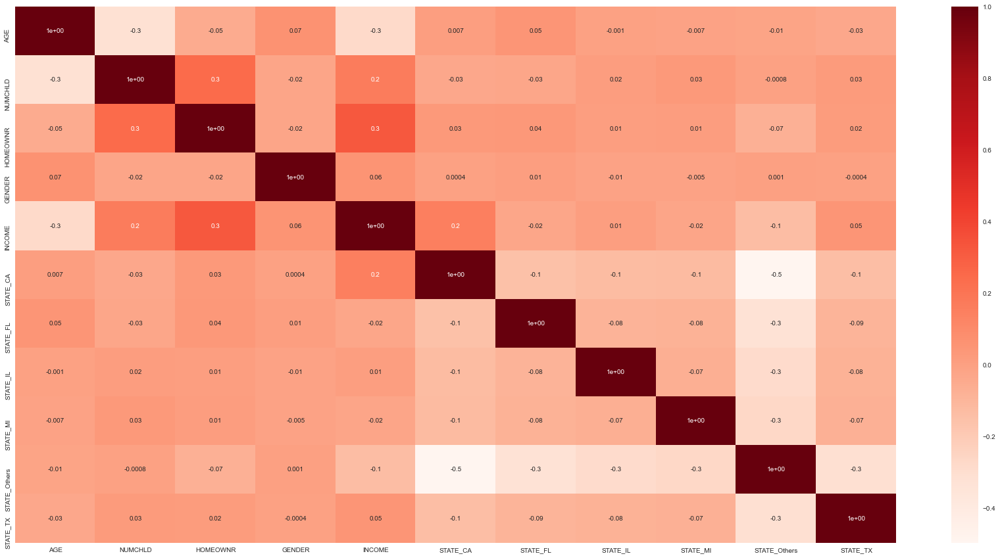

In [114]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_dem.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [ ]:
#gender corr really low, drop?

In [126]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestRegressor

def corr_rf(df):
    feature_table = pd.DataFrame(index=df.columns)
    i=0
    for col in df:
        embeded_rf_selector = SelectFromModel(RandomForestRegressor(n_estimators=100), max_features=len(df.columns)-1)
        embeded_rf_selector.fit(df.drop(col,axis=1), df[col])
        embeded_rf_support = embeded_rf_selector.get_support()
        embeded_rf_support = list(embeded_rf_support)
        embeded_rf_support.insert(i,True)
        i+=1

        feature_table[col]=embeded_rf_support
    feature_table['Total'] = np.sum(feature_table, axis=1)
    feature_table = feature_table.sort_values(['Total'] , ascending=False)
    return feature_table

corr_rf(df_dem)

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,STATE_CA,STATE_FL,STATE_IL,STATE_MI,STATE_Others,STATE_TX,Total
STATE_IL,False,False,False,False,False,True,True,True,True,True,True,6
STATE_MI,False,False,False,False,False,True,True,True,True,True,True,6
STATE_TX,False,False,False,False,False,True,True,True,True,True,True,6
AGE,True,True,True,True,True,False,False,False,False,False,False,5
INCOME,True,True,True,True,True,False,False,False,False,False,False,5
STATE_FL,False,False,False,False,False,True,True,True,False,True,True,5
HOMEOWNR,False,True,True,True,True,False,False,False,False,False,False,4
STATE_CA,False,False,False,False,False,True,True,False,False,True,True,4
STATE_Others,False,False,False,False,False,True,True,False,False,True,False,3
NUMCHLD,True,True,False,False,False,False,False,False,False,False,False,2


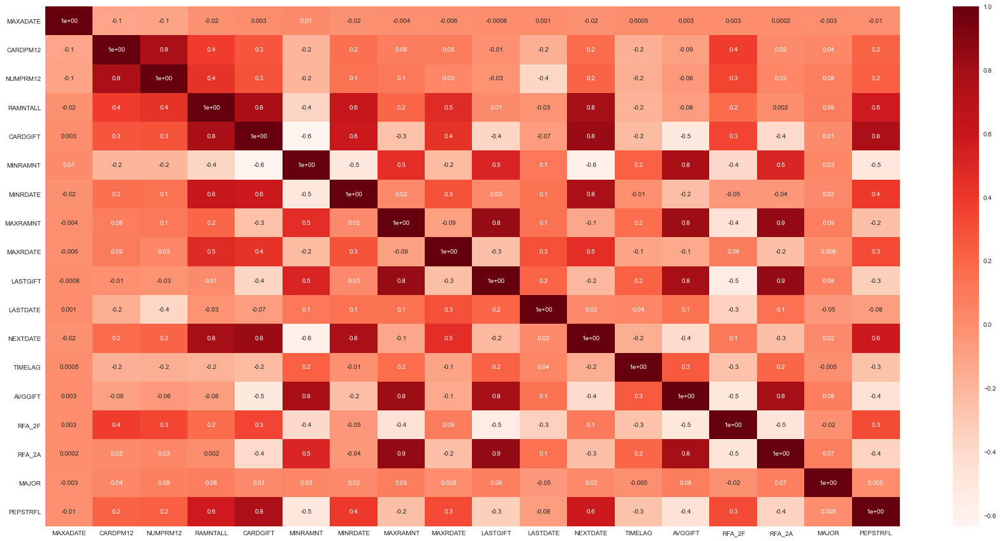

In [113]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_sum.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [22]:
df_sum.drop(['MAXADATE', 'MAJOR'], axis=1, inplace=True)  #no correlation

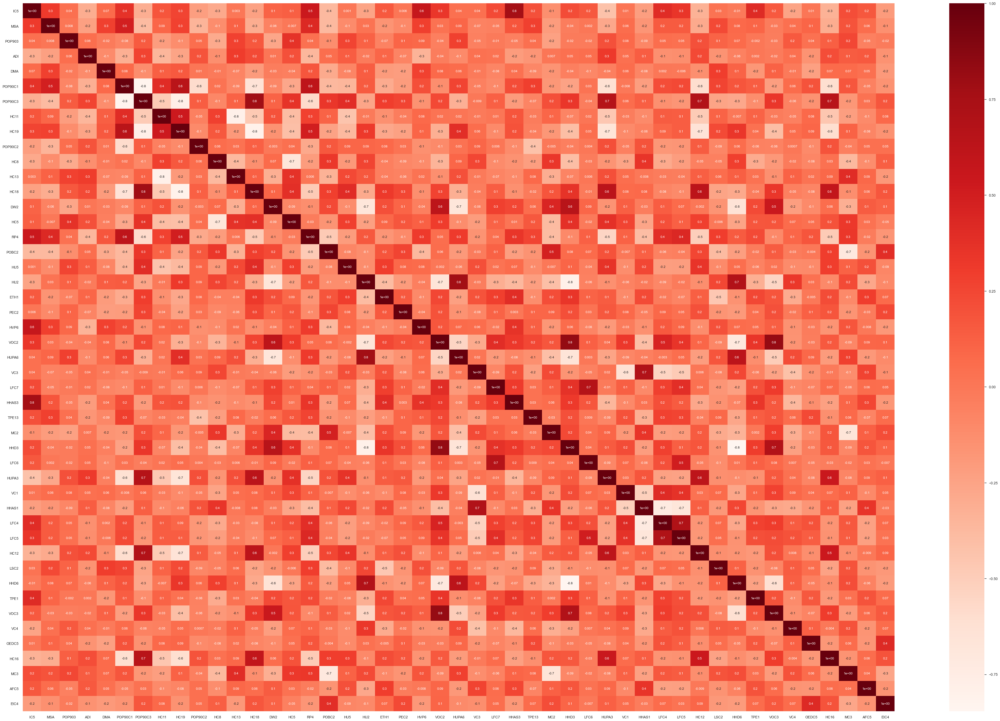

In [179]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(60,40))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_cen.corr(method ='spearman')
cor_heatmap(cor_spearman)

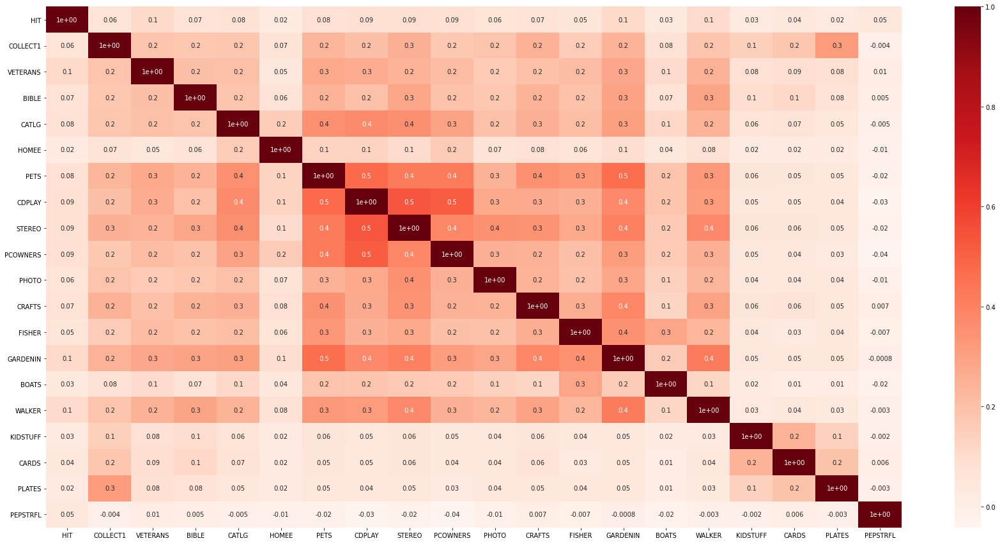

In [58]:
#Using Spearman correlation
%matplotlib inline

def cor_heatmap(cor):
    plt.figure(figsize=(30,15))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Reds, fmt='.1')
    plt.show()

cor_spearman = df_int.corr(method ='spearman')
cor_heatmap(cor_spearman)

In [123]:
#PEPSTRFL, HOMEE E HIT FAZER DROP

## PCA for census variables

<a class="anchor" id="pca">

In [292]:
#experimentamos e nao usamos, nao achamos que fosse necessario

In [258]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_cen)
pca_feat  

# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,7.905290,0.000000,0.179664,0.179664
2,5.953856,-1.951434,0.135313,0.314977
3,4.201096,-1.752760,0.095478,0.410456
4,3.936020,-0.265076,0.089454,0.499910
5,2.115360,-1.820660,0.048076,0.547986
6,1.881942,-0.233419,0.042771,0.590756
7,1.677236,-0.204705,0.038119,0.628875
8,1.402463,-0.274773,0.031874,0.660749
9,1.111232,-0.291232,0.025255,0.686004
10,1.020737,-0.090495,0.023198,0.709202


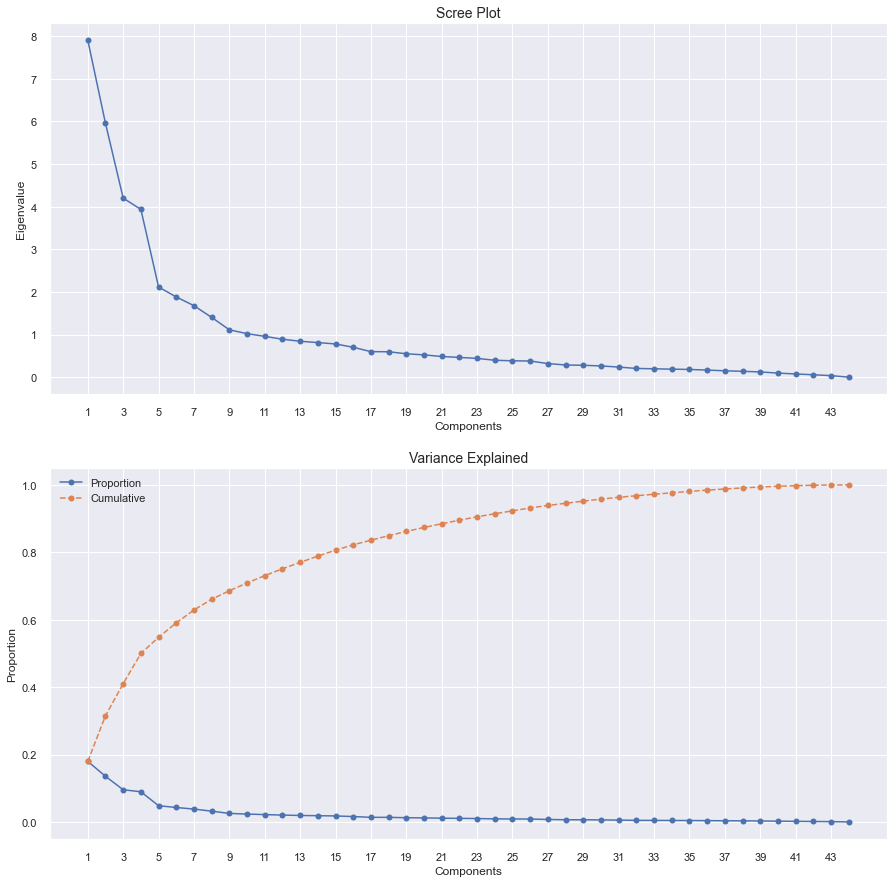

In [259]:
%matplotlib inline
# figure and axes
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 15))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [260]:
pca = PCA(n_components=7)
pca_feat = pca.fit_transform(df_cen)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_cen.index, columns=pca_feat_names)  
pca_df

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
CONTROLN,,,,,,,
95515,-2.408221,0.101923,-1.323414,-1.291452,-0.421332,-1.056894,-0.846627
148535,-1.292321,-5.845610,-0.888832,0.906693,2.395407,1.751108,3.156739
15078,-3.648010,1.681980,1.385633,-1.466670,-0.652436,1.169754,-1.292910
172556,-1.144774,3.372742,0.841250,-2.453636,2.452960,0.903020,1.984479
7112,0.446927,1.959718,-1.192694,-1.144573,1.902857,-0.406280,1.121172
...,...,...,...,...,...,...,...
184568,2.172393,-2.905227,1.913579,0.570003,-0.603130,-0.036392,1.483605
122706,-0.834068,-3.793905,1.852519,1.408131,1.322322,-1.488468,1.587608
189641,1.554024,-0.861986,-1.583491,-3.228019,-0.063700,0.178429,0.790787


In [261]:
# Reassigning df to contain pca variables
df_pca_cen = pd.concat([df_cen, pca_df], axis=1)  #df_pca1 em vez disto se calhar devia ser df_[numerical_data] - para nao incluir a normalizacao
df_pca_cen.head()

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,AFC5,EIC4,PC0,PC1,PC2,PC3,PC4,PC5,PC6
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.352473,-0.424938,-1.247266,0.959688,1.061732,-0.924867,0.678899,0.306590,-0.717164,1.851259,1.101689,-0.372590,-0.179904,0.773495,-0.325189,-0.752620,0.326534,-0.289322,-0.357930,0.891926,-0.621009,-0.930579,0.222571,0.460536,-0.944426,0.179597,0.697272,-0.179167,-0.597726,0.218715,0.074797,-0.479078,-0.736888,-0.573939,0.165141,-0.107562,1.002969,-0.115303,0.432684,0.747362,-0.512595,-0.916860,0.738342,2.368015,-2.408221,0.101923,-1.323414,-1.291452,-0.421332,-1.056894,-0.846627
148535,2.406506,-0.108115,0.844518,-0.657877,1.230893,0.754386,-0.438131,-1.168788,-0.931870,-0.571457,1.257643,1.381534,0.721196,-0.878214,-0.229971,-1.236379,-0.949901,-0.865113,4.838648,1.728501,-0.621009,-1.347170,0.462203,1.363070,0.628741,-0.470900,1.873973,-0.047884,-0.597726,1.691006,-1.536216,0.781314,0.275543,-0.573939,0.082030,-1.042099,0.283438,3.057497,-1.069701,-0.113329,-0.512595,-0.327475,-1.643113,-0.410769,-1.292321,-5.845610,-0.888832,0.906693,2.395407,1.751108,3.156739
15078,-0.507290,0.686797,-1.247266,1.780913,-1.475684,-1.579491,-0.374301,-0.174511,0.177446,2.298530,0.087994,0.003294,-1.424280,1.245412,0.198510,-0.365614,0.530764,0.129435,-0.357930,0.222666,-0.451667,-0.097398,0.761744,-0.742842,0.023677,0.699995,0.370411,0.871096,1.065822,-0.201939,0.074797,-0.034234,0.197664,-0.078091,-0.250410,-0.277478,-0.256210,0.817873,-0.318508,0.364832,0.926209,-0.425706,-1.047750,1.574077,-3.648010,1.681980,1.385633,-1.466670,-0.652436,1.169754,-1.292910
172556,-0.086312,-0.478694,-1.247266,1.631599,-0.206976,-1.437182,-0.182810,0.595251,-0.466673,2.298530,0.633830,-0.163766,-1.853375,0.443153,-0.372798,1.085661,-1.256245,-0.079944,0.194897,-1.004311,-0.621009,-0.156911,-1.095406,-1.043687,-1.065439,0.179597,0.108922,-2.082769,0.026104,-1.183467,-0.364570,-0.182515,-0.659009,1.244169,2.907774,-0.107562,-1.695272,0.631238,0.432684,1.608053,1.022129,-0.916860,-0.849295,-1.403192,-1.144774,3.372742,0.841250,-2.453636,2.452960,0.903020,1.984479
7112,-0.713396,-0.220858,0.844518,-0.657877,-1.221943,-1.465644,-0.438131,0.980132,1.501467,-0.534184,1.218654,-0.832003,0.249191,0.348770,-0.658452,-0.946124,-4.268632,-0.917457,-0.357930,-0.892767,-0.621009,1.152375,-1.095406,-1.946221,0.931273,1.870889,-0.675545,1.002379,-0.597726,-1.534012,0.587393,-0.404937,-0.347491,0.583039,-0.499740,-0.787225,-0.346152,-0.208621,0.808280,-2.025976,-0.512595,-0.818629,-0.353158,-1.601676,0.446927,1.959718,-1.192694,-1.144573,1.902857,-0.406280,1.121172


In [262]:
metric_features = df_cen.columns.tolist()

def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca_cen.corr().loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
IC5,0.0887631,-0.458775,-0.197458,0.515239,0.0901928,0.419158,0.0902834
POP903,0.0817305,0.0275576,0.165108,0.0317627,-0.000900899,-0.0116581,-0.0500314
POP90C1,0.60251,-0.495357,-0.169157,0.0951189,0.330187,0.0952618,-0.158861
POP90C3,-0.711276,0.40176,0.305665,-0.0825564,-0.0122109,0.256025,0.011627
HC11,0.295864,-0.372001,-0.61212,-0.283677,0.0517965,-0.0699901,0.0603446
HC19,0.732563,-0.306095,-0.357873,0.0243697,-0.0664348,-0.207416,0.00503116
POP90C2,-0.0031649,0.229083,-0.135706,-0.0369042,-0.486867,-0.475562,0.217519
HC8,0.254921,0.266942,-0.552257,-0.383911,-0.0550678,0.179846,0.0255413
HC13,0.128733,0.0808216,0.550554,0.452402,-0.0257979,-0.151311,-0.156952
HC18,-0.645874,0.271488,0.270169,-0.0786834,0.00987965,0.296036,-0.0483014


In [263]:
df_pca_cen[pca_feat_names]

,PC0,PC1,PC2,PC3,PC4,PC5,PC6
CONTROLN,,,,,,,
95515,-2.408221,0.101923,-1.323414,-1.291452,-0.421332,-1.056894,-0.846627
148535,-1.292321,-5.845610,-0.888832,0.906693,2.395407,1.751108,3.156739
15078,-3.648010,1.681980,1.385633,-1.466670,-0.652436,1.169754,-1.292910
172556,-1.144774,3.372742,0.841250,-2.453636,2.452960,0.903020,1.984479
7112,0.446927,1.959718,-1.192694,-1.144573,1.902857,-0.406280,1.121172
...,...,...,...,...,...,...,...
184568,2.172393,-2.905227,1.913579,0.570003,-0.603130,-0.036392,1.483605
122706,-0.834068,-3.793905,1.852519,1.408131,1.322322,-1.488468,1.587608
189641,1.554024,-0.861986,-1.583491,-3.228019,-0.063700,0.178429,0.790787


In [264]:
df_pca_cen[metric_features]

,IC5,POP903,POP90C1,POP90C3,HC11,HC19,POP90C2,HC8,HC13,HC18,DW2,HC5,RP4,POBC2,HU5,HU2,ETH1,PEC2,HVP6,VOC2,HUPA6,VC3,LFC7,HHAS3,TPE13,MC2,HHD3,LFC6,HUPA3,VC1,HHAS1,LFC4,LFC5,HC12,LSC2,HHD6,TPE1,VOC3,VC4,OEDC5,HC16,MC3,AFC5,EIC4
CONTROLN,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
95515,-0.352473,-0.424938,-1.247266,0.959688,1.061732,-0.924867,0.678899,0.306590,-0.717164,1.851259,1.101689,-0.372590,-0.179904,0.773495,-0.325189,-0.752620,0.326534,-0.289322,-0.357930,0.891926,-0.621009,-0.930579,0.222571,0.460536,-0.944426,0.179597,0.697272,-0.179167,-0.597726,0.218715,0.074797,-0.479078,-0.736888,-0.573939,0.165141,-0.107562,1.002969,-0.115303,0.432684,0.747362,-0.512595,-0.916860,0.738342,2.368015
148535,2.406506,-0.108115,0.844518,-0.657877,1.230893,0.754386,-0.438131,-1.168788,-0.931870,-0.571457,1.257643,1.381534,0.721196,-0.878214,-0.229971,-1.236379,-0.949901,-0.865113,4.838648,1.728501,-0.621009,-1.347170,0.462203,1.363070,0.628741,-0.470900,1.873973,-0.047884,-0.597726,1.691006,-1.536216,0.781314,0.275543,-0.573939,0.082030,-1.042099,0.283438,3.057497,-1.069701,-0.113329,-0.512595,-0.327475,-1.643113,-0.410769
15078,-0.507290,0.686797,-1.247266,1.780913,-1.475684,-1.579491,-0.374301,-0.174511,0.177446,2.298530,0.087994,0.003294,-1.424280,1.245412,0.198510,-0.365614,0.530764,0.129435,-0.357930,0.222666,-0.451667,-0.097398,0.761744,-0.742842,0.023677,0.699995,0.370411,0.871096,1.065822,-0.201939,0.074797,-0.034234,0.197664,-0.078091,-0.250410,-0.277478,-0.256210,0.817873,-0.318508,0.364832,0.926209,-0.425706,-1.047750,1.574077
172556,-0.086312,-0.478694,-1.247266,1.631599,-0.206976,-1.437182,-0.182810,0.595251,-0.466673,2.298530,0.633830,-0.163766,-1.853375,0.443153,-0.372798,1.085661,-1.256245,-0.079944,0.194897,-1.004311,-0.621009,-0.156911,-1.095406,-1.043687,-1.065439,0.179597,0.108922,-2.082769,0.026104,-1.183467,-0.364570,-0.182515,-0.659009,1.244169,2.907774,-0.107562,-1.695272,0.631238,0.432684,1.608053,1.022129,-0.916860,-0.849295,-1.403192
7112,-0.713396,-0.220858,0.844518,-0.657877,-1.221943,-1.465644,-0.438131,0.980132,1.501467,-0.534184,1.218654,-0.832003,0.249191,0.348770,-0.658452,-0.946124,-4.268632,-0.917457,-0.357930,-0.892767,-0.621009,1.152375,-1.095406,-1.946221,0.931273,1.870889,-0.675545,1.002379,-0.597726,-1.534012,0.587393,-0.404937,-0.347491,0.583039,-0.499740,-0.787225,-0.346152,-0.208621,0.808280,-2.025976,-0.512595,-0.818629,-0.353158,-1.601676
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184568,0.349235,4.191832,0.844518,-0.657877,0.948958,0.725924,-0.438131,-0.880127,-0.645595,-0.310549,-1.120642,0.379178,0.849924,-1.491705,-0.515625,0.698654,-0.388269,-0.865113,-0.357930,-0.056192,0.056358,-1.347170,0.462203,1.603746,0.507728,-0.926248,-0.217939,0.280323,0.303363,1.200243,-1.316533,0.929596,1.210094,-0.491298,-0.250410,-0.022604,-0.076328,-0.115303,1.277775,-1.069652,-0.416675,1.440679,0.341433,-1.303950
122706,1.264986,-0.411143,0.781131,-0.558335,0.836184,-0.156396,-0.438131,-0.976347,-0.502457,0.583992,0.828772,2.801540,0.077553,-0.311914,-0.658452,-0.849372,0.275477,-0.812768,-0.081516,1.282328,-0.621009,-0.871066,-0.376509,1.062225,0.023677,-2.227241,1.677856,-1.098147,0.095419,0.849697,-1.389761,1.226159,-0.113854,-0.408657,-0.250410,-1.127056,0.283438,0.817873,0.338785,0.747362,-0.512595,2.324757,-0.055477,-0.807738
189641,-0.435982,-0.485353,0.844518,-0.657877,1.259086,0.754386,-0.438131,2.006481,-1.075007,-0.571457,1.101689,-0.957298,0.592467,1.151028,-0.182362,0.214896,-0.184040,0.338813,-0.357930,-1.060082,-0.621009,-0.811553,-1.514762,-1.043687,0.507728,0.374746,-1.067779,0.805454,-0.597726,1.060024,-1.243305,-0.034234,1.210094,-0.573939,-0.084190,0.232269,0.553262,-0.768527,0.808280,-1.739079,-0.128914,-0.916860,-1.345431,-0.311527


In [ ]:
# Do this after checking the new pandas profiling report
#df_pca2.drop(columns=['PC11], inplace=True)

# Clustering

## Testing on K-means and Hierarchical clustering

<a class="anchor" id="hier">

In [23]:
def kelbowplots(clus_estim, data):
    """
    This function produces the k-elbow plot for a given clustering estimator according to 2 different clustering quality measures: "Distortion" and "Calinski Harabasz".
    """
    sns.set()
    fig, axes = plt.subplots(1, 2, figsize=(20,7))

    # Plot the data
    metrics = ["distortion", "calinski_harabasz"]
    ylabels = ["Distortion measure", "Calinski Harabasz measure"]
    titles = ["Distortion measure plot", "Calinski Harabasz measure plot"]
    for ax, m, yl, tl in zip(axes.flatten(), metrics, ylabels, titles):
        # KElbowVisualizer produces the elbow plot for several quality measures
        KElbowVisualizer(clus_estim, metric=m, timings=False, locate_elbow=False, ax=ax).fit(data)
        ax.invert_xaxis()
        ax.set_ylabel(yl, fontsize=13)
        ax.set_xlabel("Number of clusters", fontsize=13)
        ax.set_title(tl, fontsize=13)

    # Set figure
    plt.suptitle("K-Elbow Plots", fontsize=23)

    plt.show()

In [24]:
#K means Clustering 
def clus_Kmeans(df, nclust):
    model = KMeans(nclust, random_state=0)
    model.fit(df)
    clust_labels = model.predict(df)
    cent = model.cluster_centers_
    return (clust_labels, cent)

In [25]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df, clusterer, min_k=2, max_k=10):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df)
        r2_clust[n] = r2(df, labels)
    return r2_clust


# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42
)

hierarchical = AgglomerativeClustering(
    affinity='euclidean'
)

In [26]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = np.sum(df.groupby(labels).apply(get_ss_variables))
    return 1 - ssw_vars/sst_vars

In [27]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) #get cluster labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [28]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(s=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()


### Sample of the dataframe

https://datascience.stackexchange.com/questions/47889/how-to-run-agglomerativeclustering-on-a-big-data-in-python

In [29]:
df_dem = df_dem.drop(['STATE_CA', 'STATE_FL', 'STATE_IL', 'STATE_MI', 'STATE_Others', 'STATE_TX'], axis=1)
#only the metric features

In [30]:
df_sample = df_.sample(n=20000)
df_dem_sample = df_dem.sample(n=20000)
df_sum_sample = df_sum.sample(n=20000)
df_cen_sample = df_cen.sample(n=20000)
df_int_sample = df_int.sample(n=20000)

df_pca_sample = df_pca_cen[pca_feat_names].sample(n=20000)

#we've runned this cell and the ones below 4x times we got the same final results

NameError: name 'df_pca_cen' is not defined

### Finding the optimal clusterer on demographic variables

<a class="anchor" id="r2">

In [61]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_dem_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:  #hierarchical
    r2_scores[linkage] = get_r2_scores(
        df_dem_sample, hierarchical.set_params(linkage=linkage)
    )
    
pd.DataFrame(r2_scores)

,kmeans,complete,average,single,ward
2,0.231600,0.102706,0.085805,0.000708,0.208784
3,0.377374,0.105978,0.087506,0.000955,0.352299
4,0.465850,0.188031,0.104195,0.234046,0.435171
5,0.550724,0.305951,0.104954,0.234212,0.503829
6,0.601864,0.316956,0.105401,0.235159,0.549493
7,0.641657,0.353812,0.119564,0.235463,0.590190
8,0.668813,0.357134,0.241099,0.235641,0.622083
9,0.692505,0.370460,0.245756,0.236474,0.649115


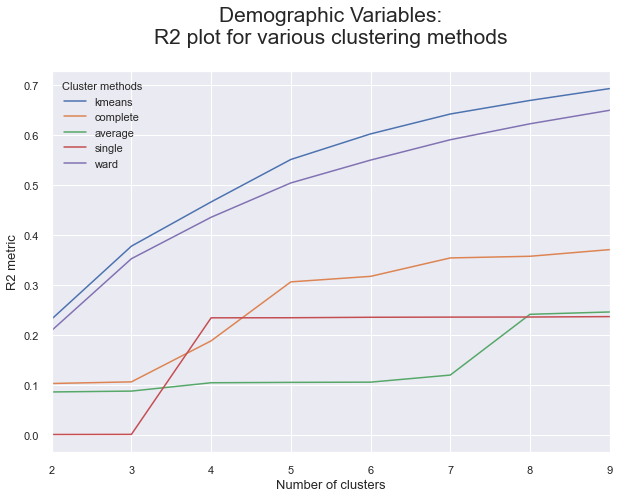

In [62]:
# Visualizing the R² scores for each cluster solution on demographic variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Demographic Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

#kmeans seems to be the best option, 5 clusters

### Repeat the process for summary variables

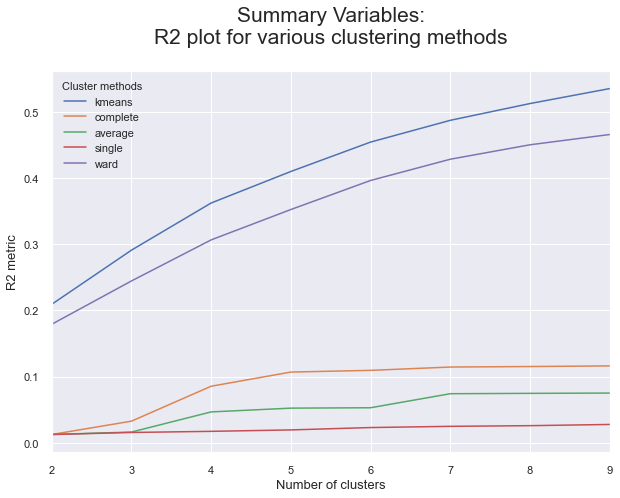

In [63]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_sum_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_sum_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Summary Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow


#4 to 6

### Repeat the process for census variables

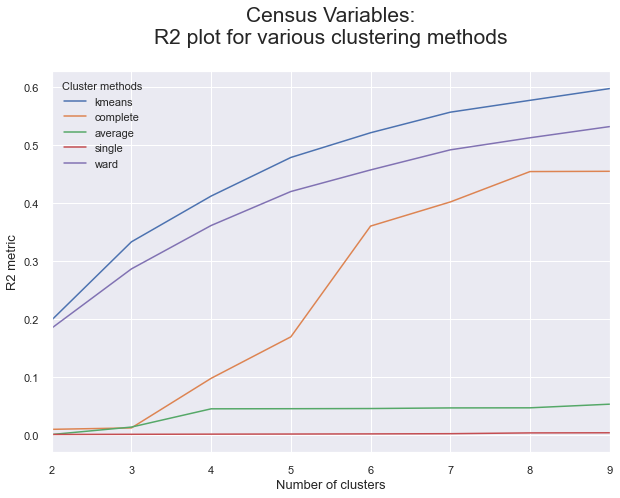

In [266]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_pca_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_pca_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Census Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow

#5

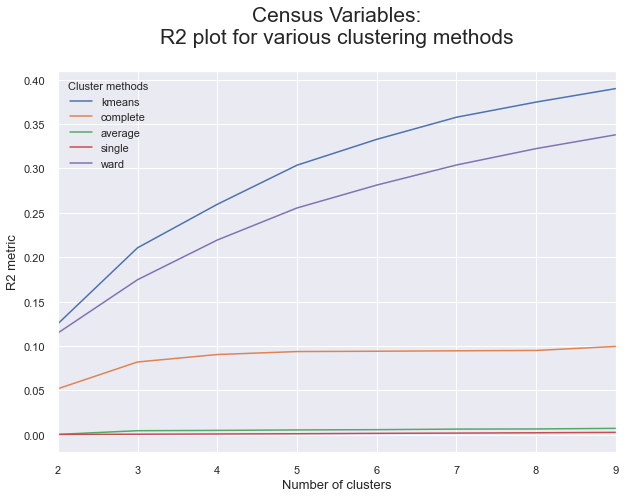

In [64]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_cen_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_cen_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Census Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow
#5

### Repeat the process for interest variables

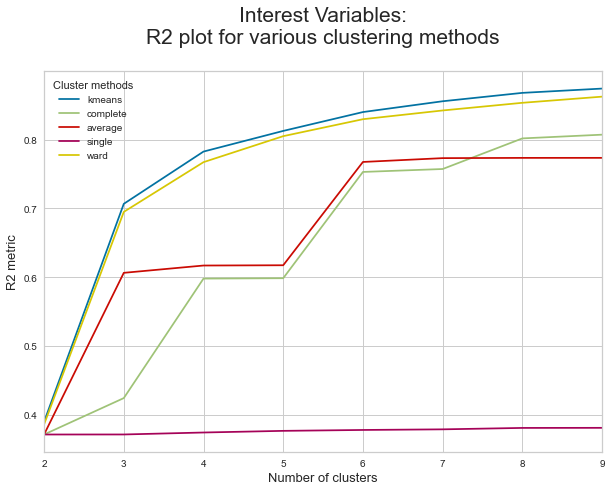

In [34]:
# Obtaining the R² scores for each cluster solution on product variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_int_sample, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:
    r2_scores[linkage] = get_r2_scores(
        df_int_sample, hierarchical.set_params(linkage=linkage)
    )

# Visualizing the R² scores for each cluster solution on product variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Interest Variables:\nR2 plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)
plt.show()

# clusters, kmeans, elbow

For our dataset, none of he hierarchical clusters seems to be as good as k-means, so we won't be testing with the hierarchical clustering.

## Demograghic segmentation

### Defining the number of clusters:


In [128]:
range_clusters = range(1, 11)

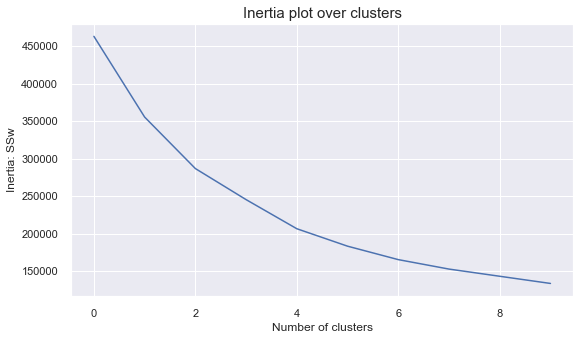

In [129]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_dem)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

#4

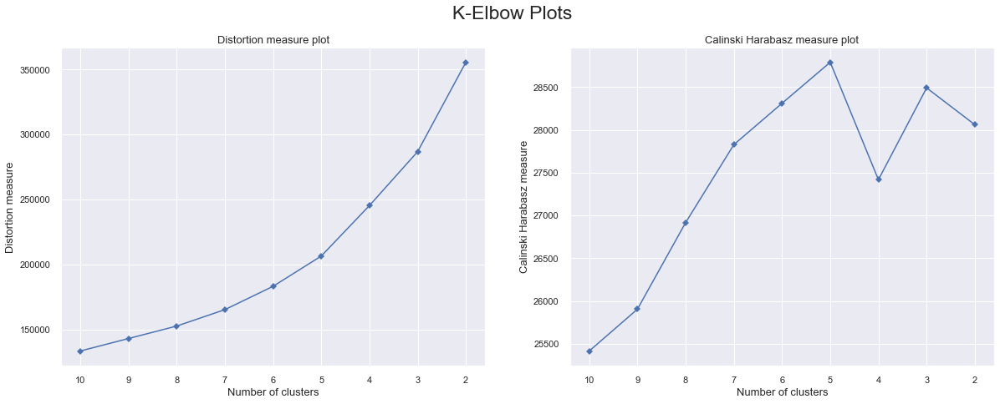

In [130]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_dem)
#5 clusters

For n_clusters = 2, the average silhouette_score is : 0.26251763907397924
For n_clusters = 3, the average silhouette_score is : 0.286936170456073
For n_clusters = 4, the average silhouette_score is : 0.2849109456652177
For n_clusters = 5, the average silhouette_score is : 0.30436936068151965
For n_clusters = 6, the average silhouette_score is : 0.3209020243745266
For n_clusters = 7, the average silhouette_score is : 0.32631375509679317
For n_clusters = 8, the average silhouette_score is : 0.3208454506777561
For n_clusters = 9, the average silhouette_score is : 0.3311382498450741
For n_clusters = 10, the average silhouette_score is : 0.32964332940565433


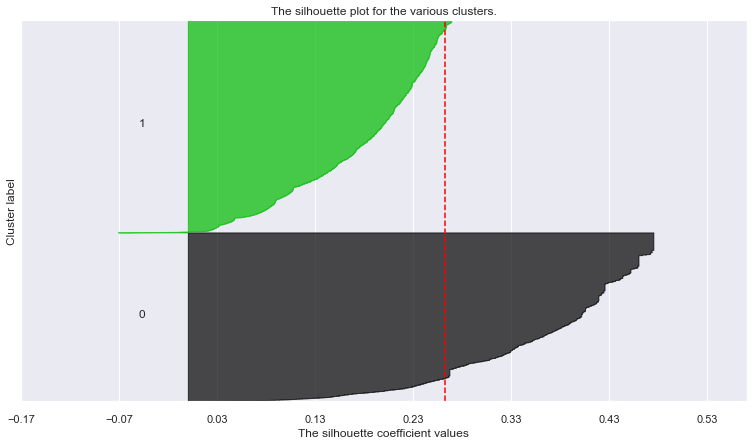

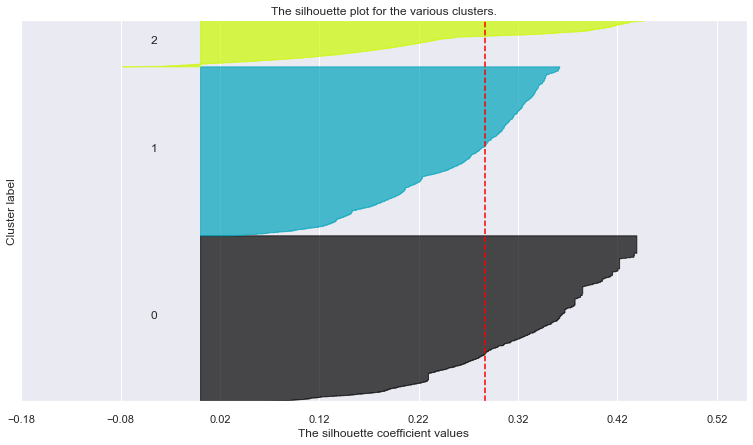

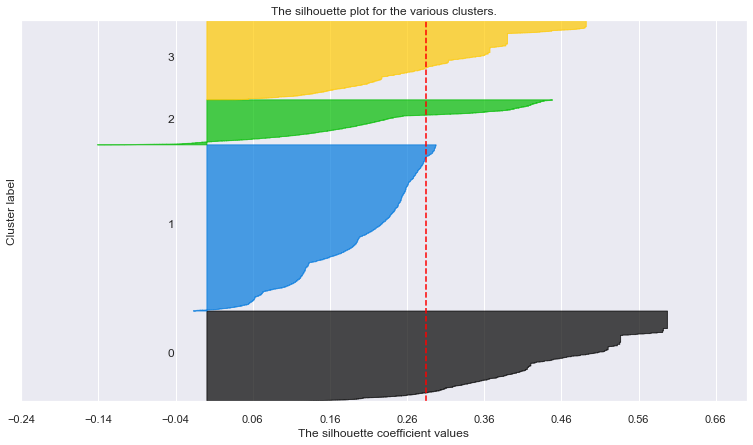

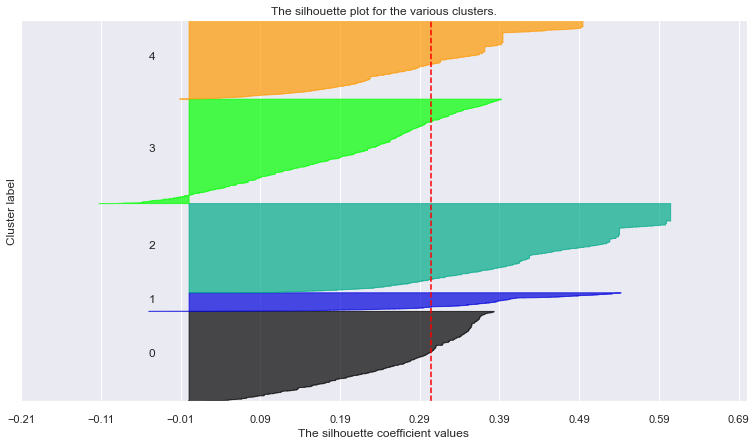

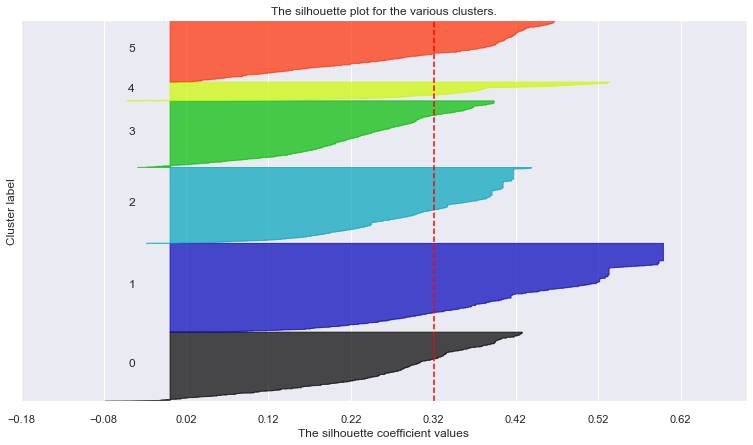

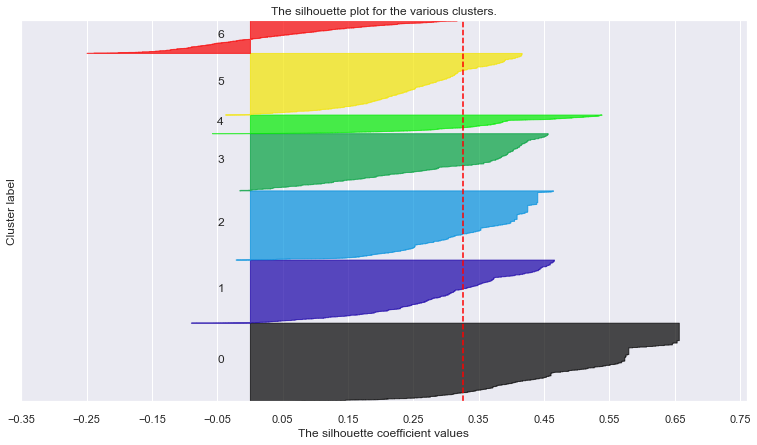

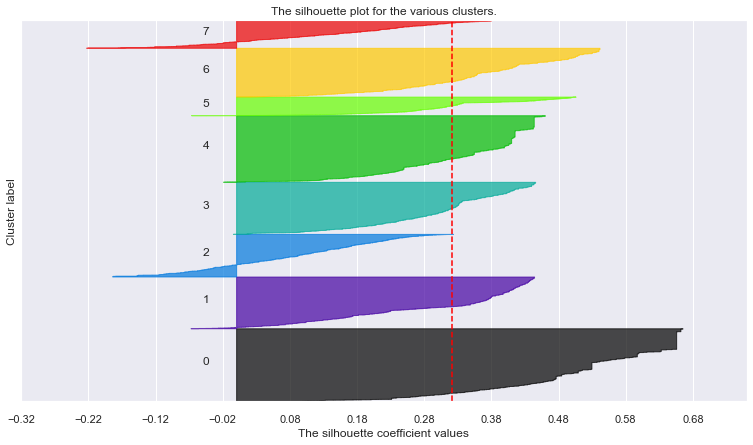

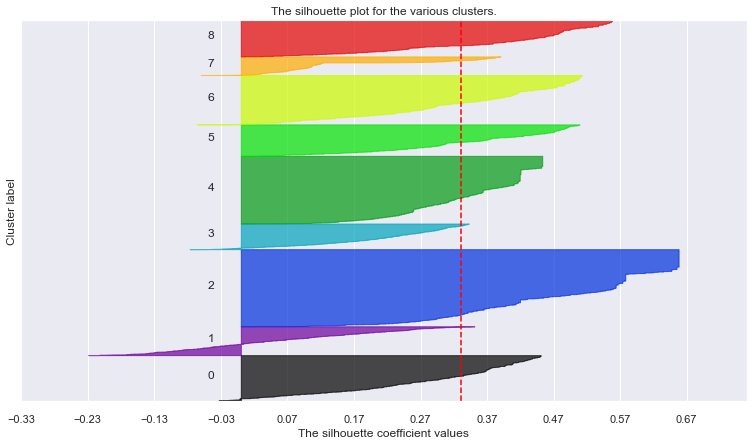

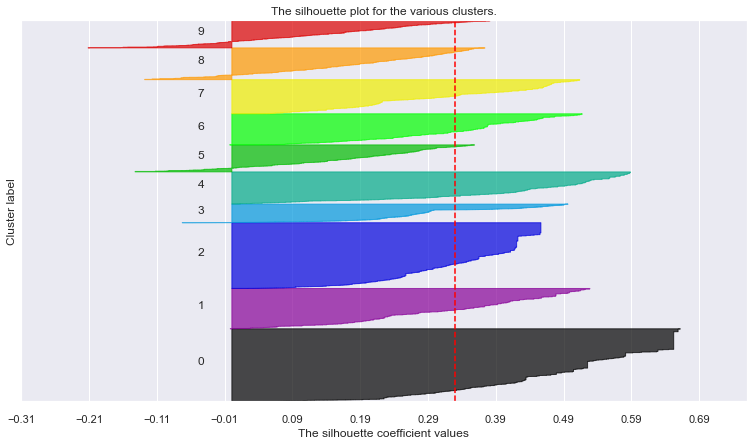

In [68]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_dem)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_dem, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_dem, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_dem) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

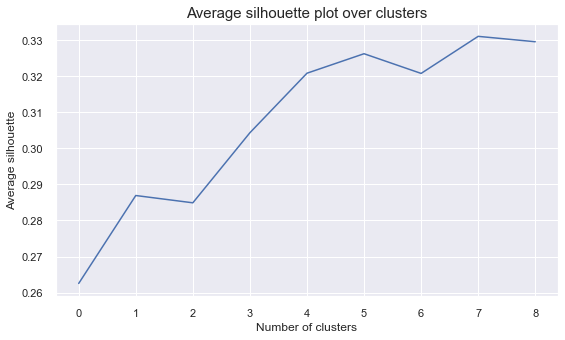

In [69]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#devia ser 5?

From the graphs above, the optimal number of clusters for the demographic segmentation is 5.

In [31]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_dem, 5)
kmeans_dem_df = df_dem.copy()
kmeans_dem_df["kmeans_dem_labels"] = clust_labels

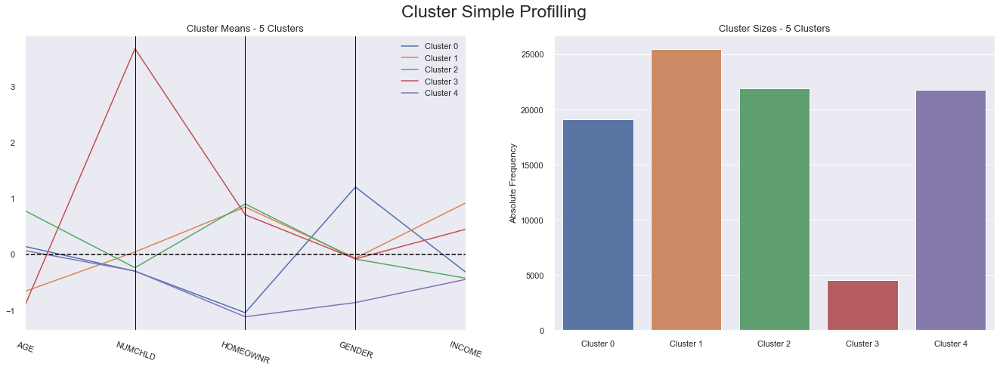

In [32]:
cluster_profiles(kmeans_dem_df, ["kmeans_dem_labels"], figsize=(23, 7))

In [33]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_dem_df, ['kmeans_dem_labels']).drop('kmeans_dem_labels').sort_values()

AGE         0.310821
INCOME      0.350729
GENDER      0.473472
NUMCHLD     0.711337
HOMEOWNR    0.924414
dtype: float64

In [34]:
#R2 score

r2(kmeans_dem_df, ["kmeans_dem_labels"])

0.6840944782530884

## Summary segmentation

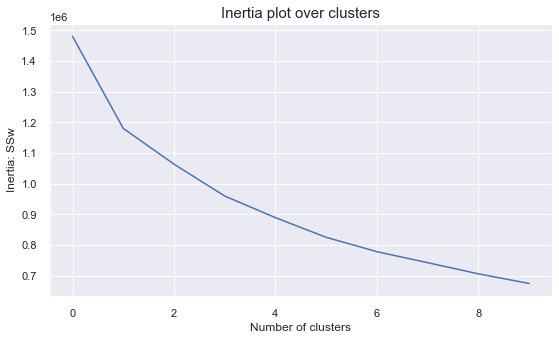

In [74]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_sum)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

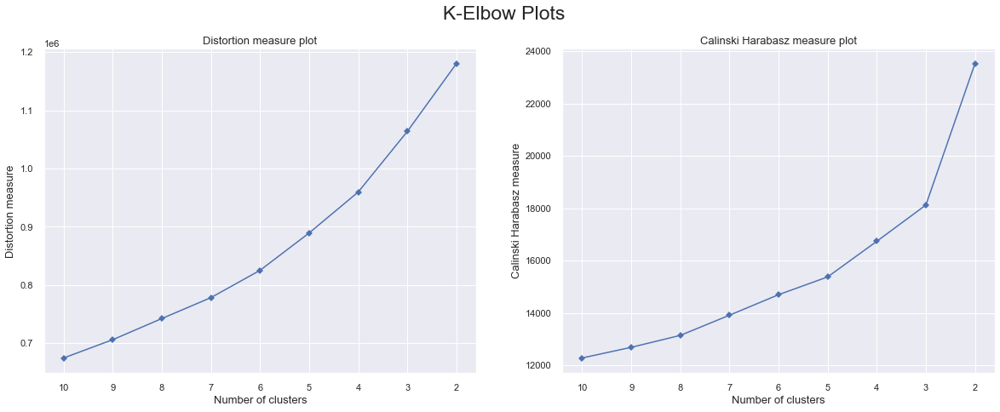

In [75]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_sum)

For n_clusters = 2, the average silhouette_score is : 0.22278899862181592
For n_clusters = 3, the average silhouette_score is : 0.22579342274684783
For n_clusters = 4, the average silhouette_score is : 0.20547098584376602
For n_clusters = 5, the average silhouette_score is : 0.206881207565048
For n_clusters = 6, the average silhouette_score is : 0.1913465029889374
For n_clusters = 7, the average silhouette_score is : 0.16290423279027846
For n_clusters = 8, the average silhouette_score is : 0.16025932880776494
For n_clusters = 9, the average silhouette_score is : 0.1605390468913132
For n_clusters = 10, the average silhouette_score is : 0.16771161503542373


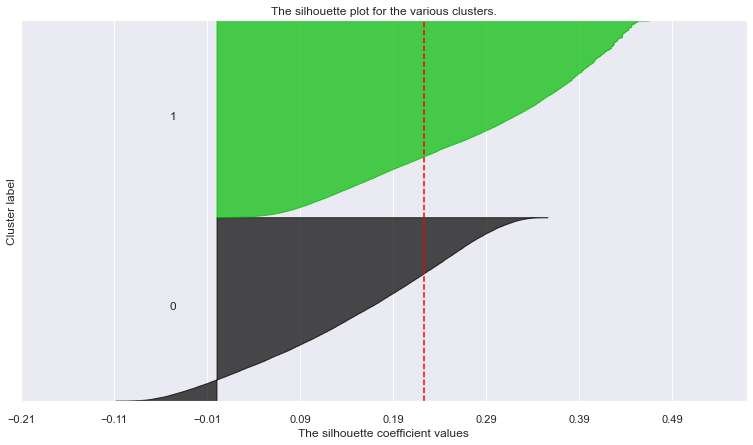

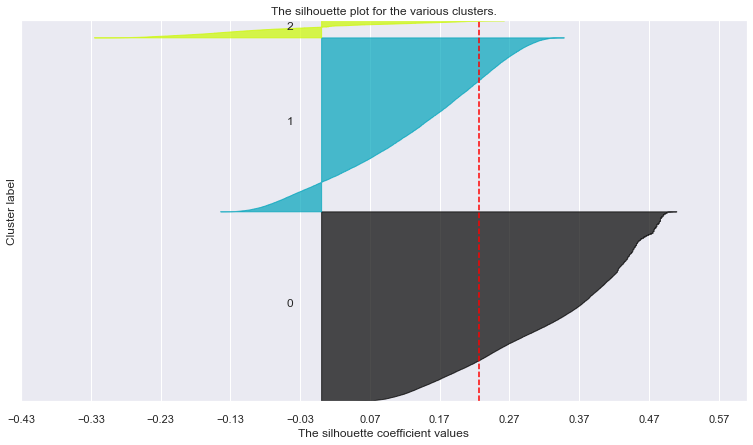

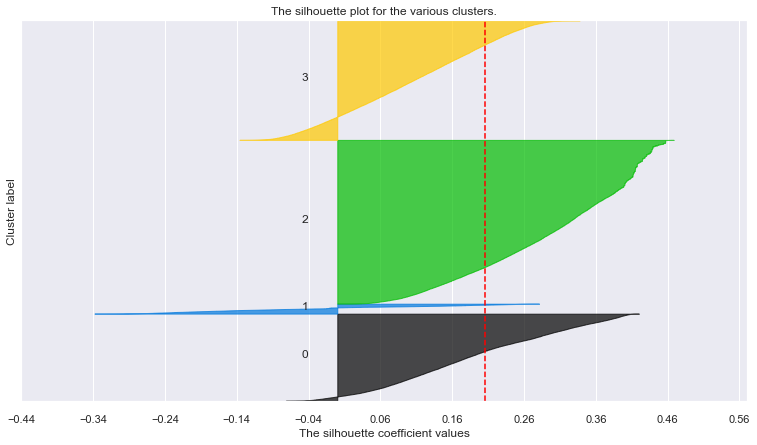

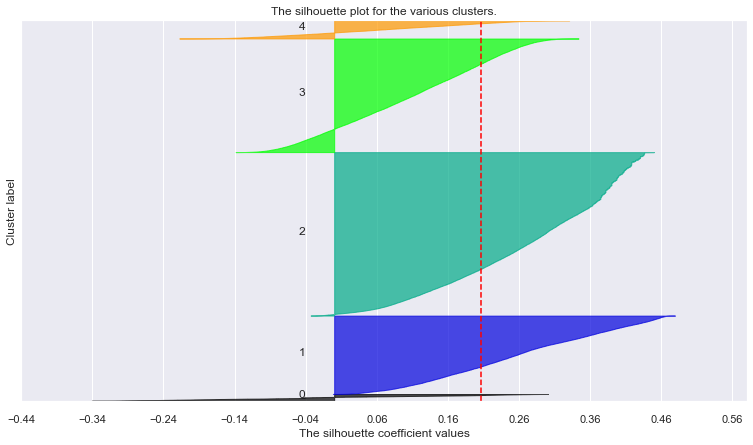

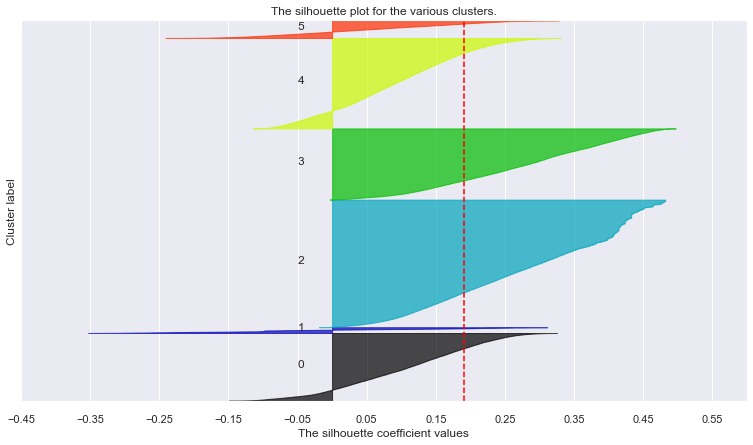

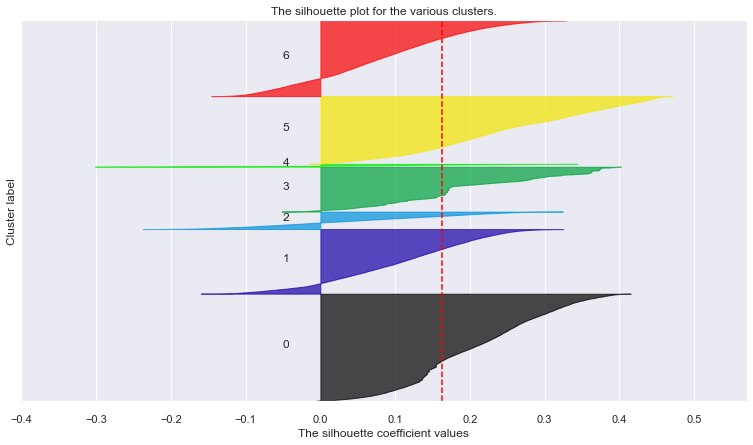

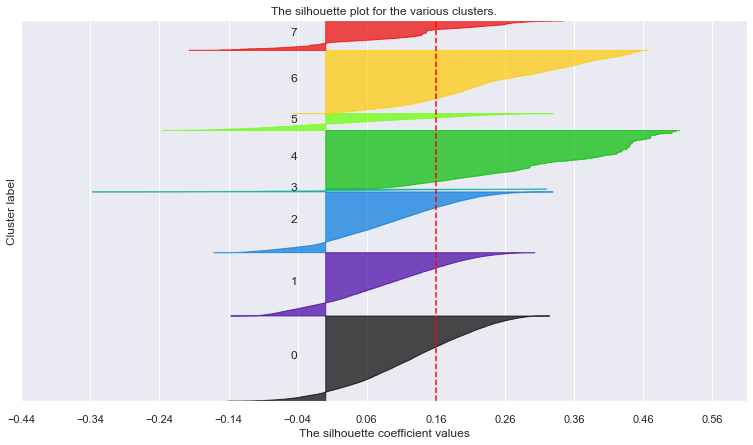

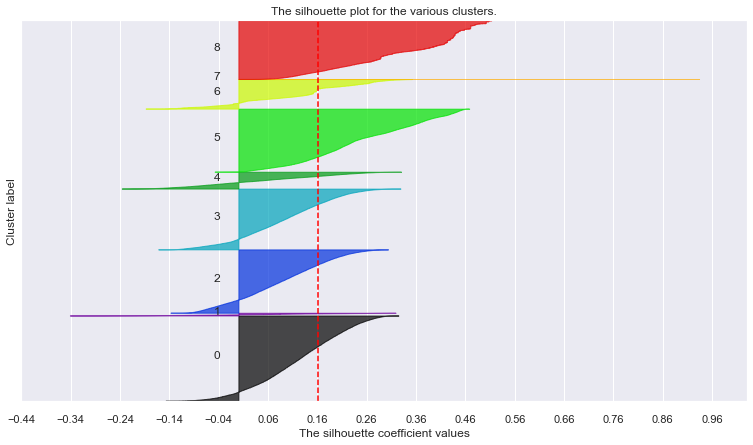

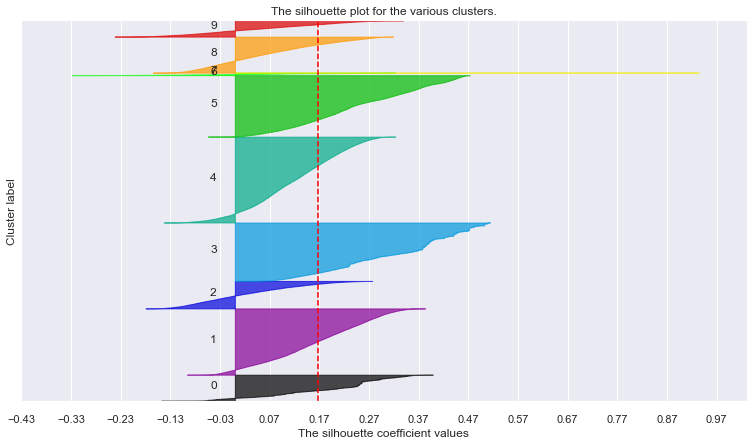

In [76]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_sum)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_sum, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_sum, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_sum) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

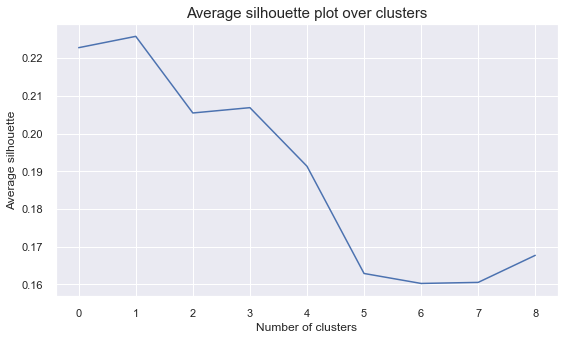

In [77]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#4 to 6

From the graphs above, the optimal number of clusters for the demographic segmentation is 3. However, we have negative silhouette samples and for this reason, the clustering approach can be improved.

In [35]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_sum, 3)
kmeans_sum_df = df_sum.copy()
kmeans_sum_df["kmeans_sum_labels"] = clust_labels

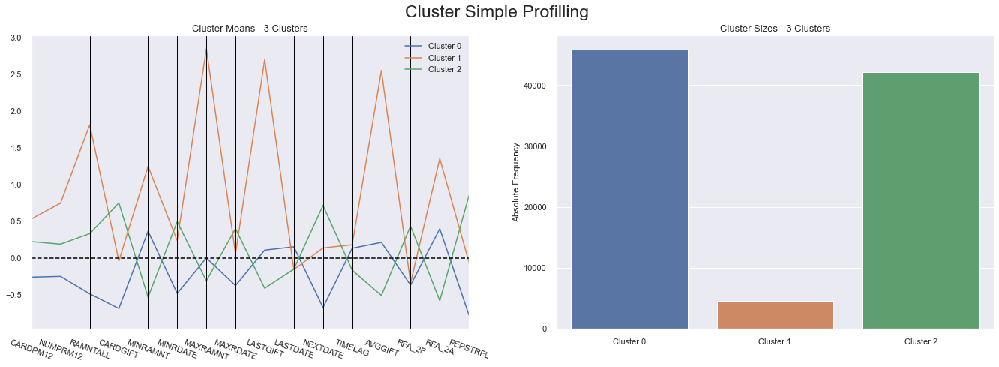

In [36]:
cluster_profiles(kmeans_sum_df, ["kmeans_sum_labels"], figsize=(23, 7))

In [37]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_sum_df, ['kmeans_sum_labels']).drop('kmeans_sum_labels').sort_values()

#before

TIMELAG     0.022777
LASTDATE    0.023240
CARDPM12    0.070235
NUMPRM12    0.074612
MAXRDATE    0.142536
RFA_2F      0.159303
MINRDATE    0.229596
MINRAMNT    0.271713
RFA_2A      0.322089
RAMNTALL    0.329638
LASTGIFT    0.442222
MAXRAMNT    0.443598
NEXTDATE    0.458958
AVGGIFT     0.462127
CARDGIFT    0.490036
PEPSTRFL    0.627111
dtype: float64

In [39]:
#R2 score

r2(kmeans_sum_df, ["kmeans_sum_labels"])

0.325616847979329

With this cluster we were able to see the most important variables for summary segmentation. We will only keep the variables that have an R2 score above 0.40. In the chapter "Clustering with the most important features" we will proceed our exploration.

In [40]:
summ = r2_variables(kmeans_sum_df, ['kmeans_sum_labels']).drop('kmeans_sum_labels').sort_values().tail(6).index.to_list()

#it was 8 before, number outliers decreased

In [41]:
summ

['LASTGIFT', 'MAXRAMNT', 'NEXTDATE', 'AVGGIFT', 'CARDGIFT', 'PEPSTRFL']

## Census segmentation

### PCA

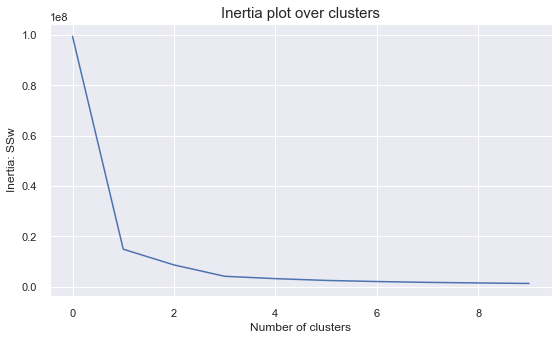

In [188]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_pca_cen[pca_feat_names])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

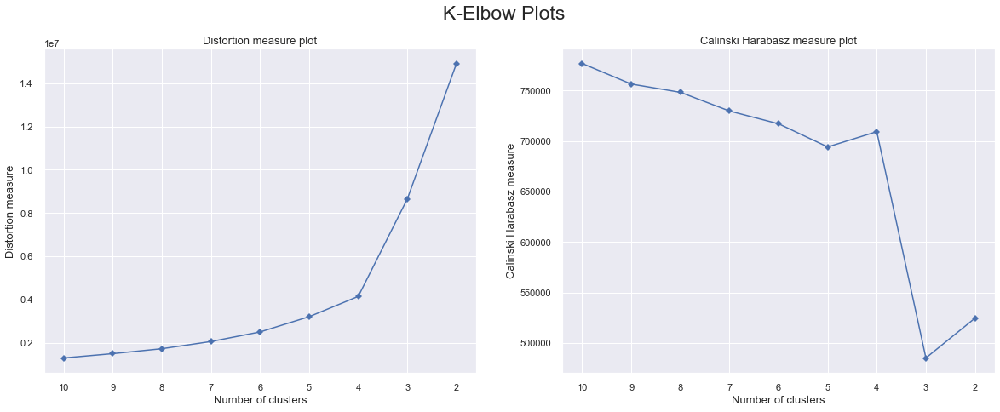

In [189]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_pca_cen[pca_feat_names])

For n_clusters = 2, the average silhouette_score is : 0.7859355502648512
For n_clusters = 3, the average silhouette_score is : 0.6322754479492814
For n_clusters = 4, the average silhouette_score is : 0.6330704551869687
For n_clusters = 5, the average silhouette_score is : 0.641767003193882
For n_clusters = 6, the average silhouette_score is : 0.38144905441153804
For n_clusters = 7, the average silhouette_score is : 0.3889382433575379
For n_clusters = 8, the average silhouette_score is : 0.37968865996667145
For n_clusters = 9, the average silhouette_score is : 0.3266627404213214
For n_clusters = 10, the average silhouette_score is : 0.3339315379726648


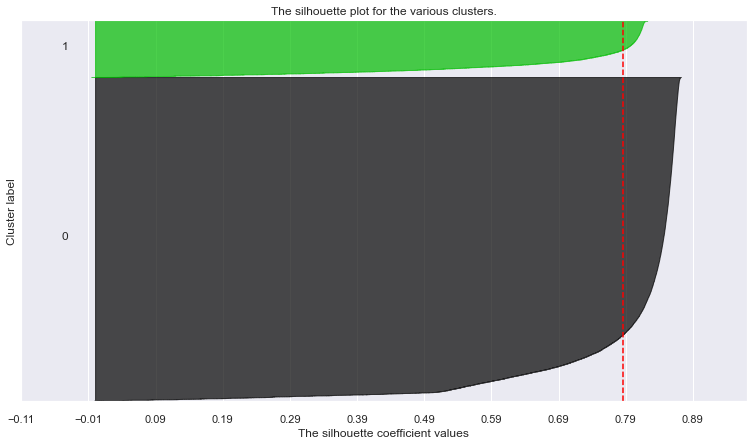

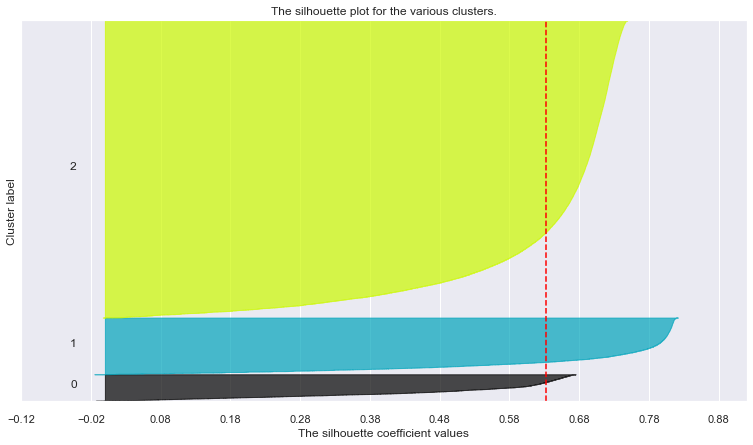

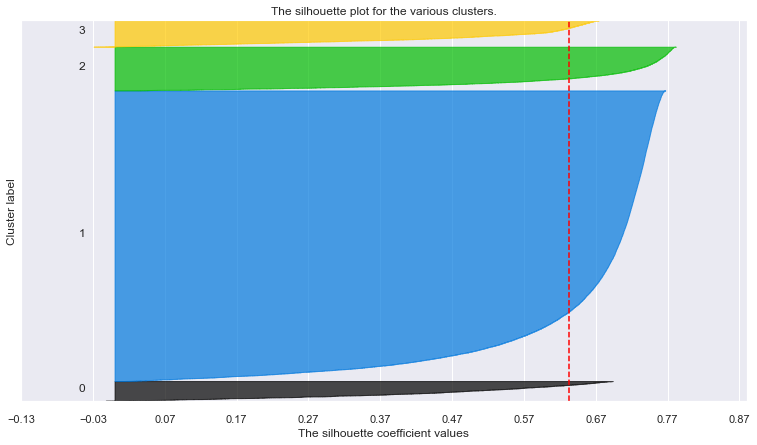

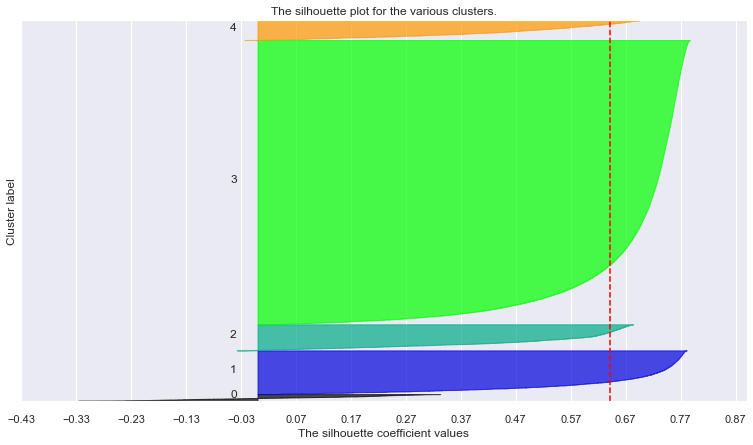

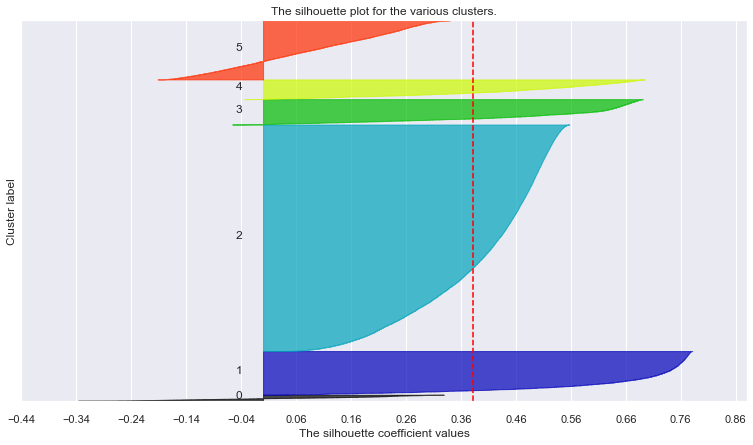

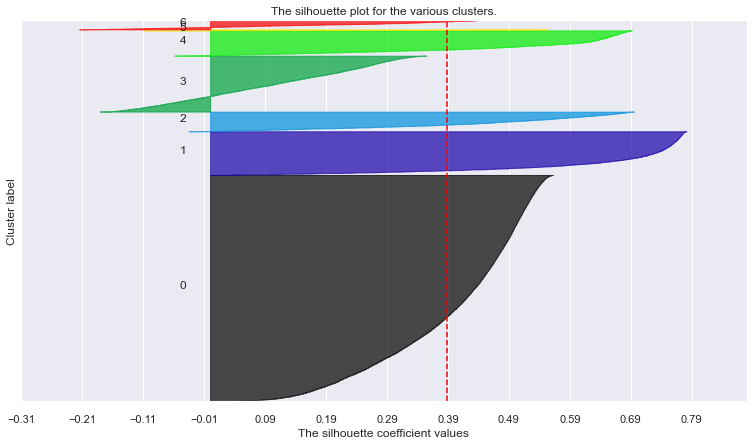

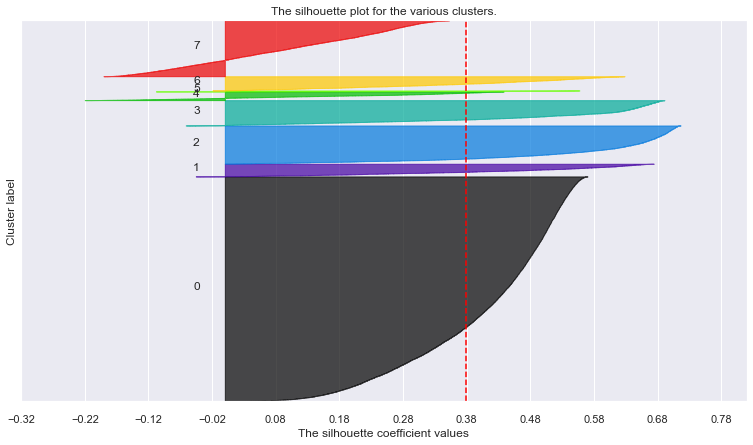

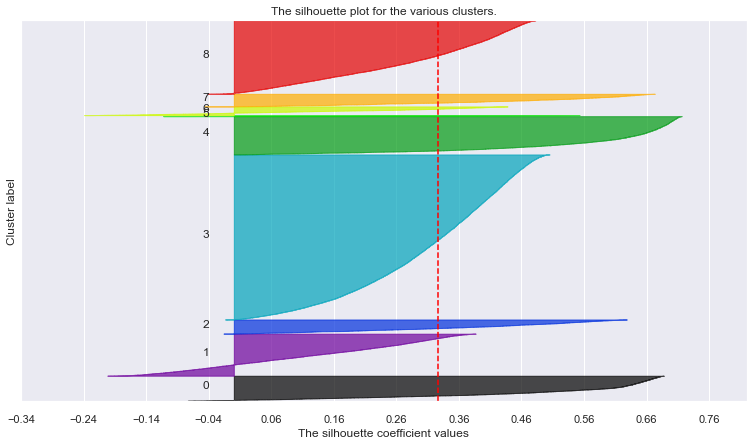

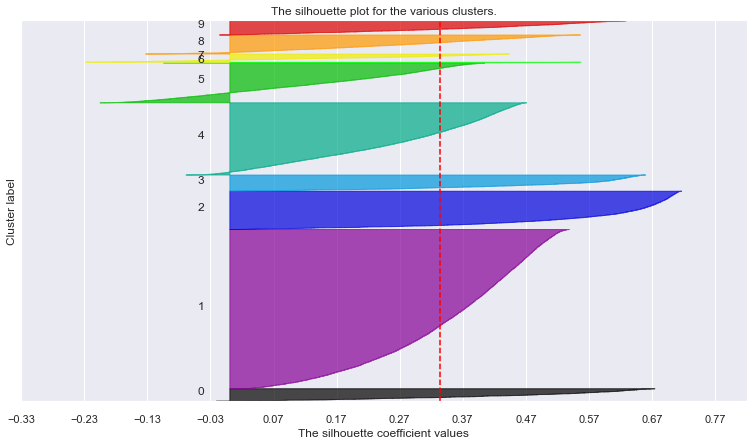

In [97]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_pca_cen[pca_feat_names])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_pca_cen[pca_feat_names], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_pca_cen[pca_feat_names], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_pca_cen[pca_feat_names]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

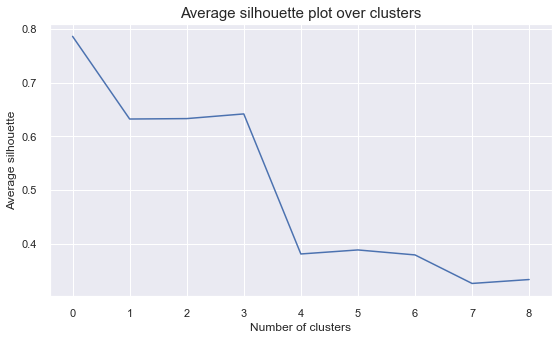

In [98]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [190]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_pca_cen[pca_feat_names], 4)
kmeans_cen_df = df_pca_cen[pca_feat_names].copy()
kmeans_cen_df["kmeans_cen_labels"] = clust_labels

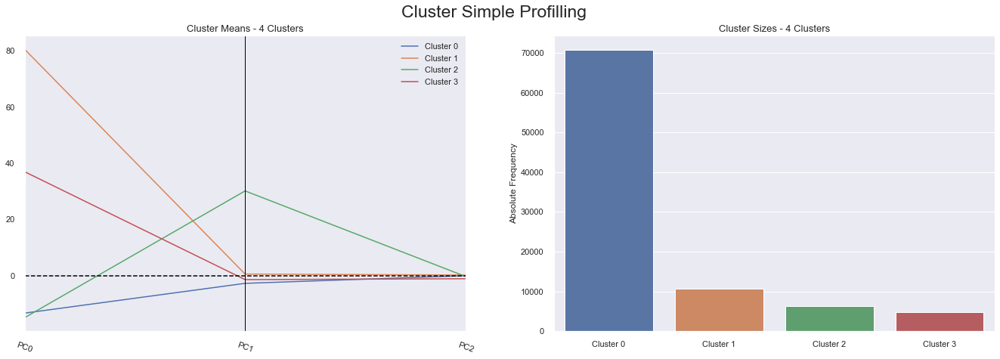

In [191]:
cluster_profiles(kmeans_cen_df, ["kmeans_cen_labels"], figsize=(23, 7))

In [ ]:
#only PC0 AND PC1 worth keepin

In [192]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values()

PC2    0.006333
PC1    0.825495
PC0    0.979967
dtype: float64

### Census variables

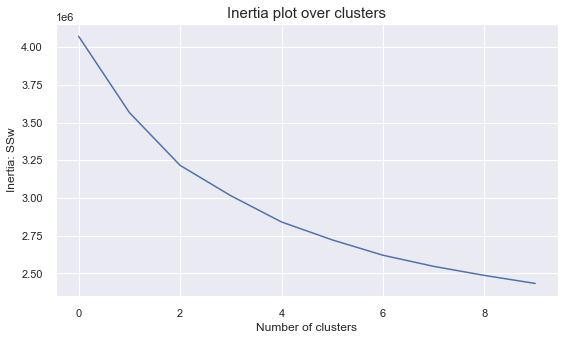

In [86]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_cen)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

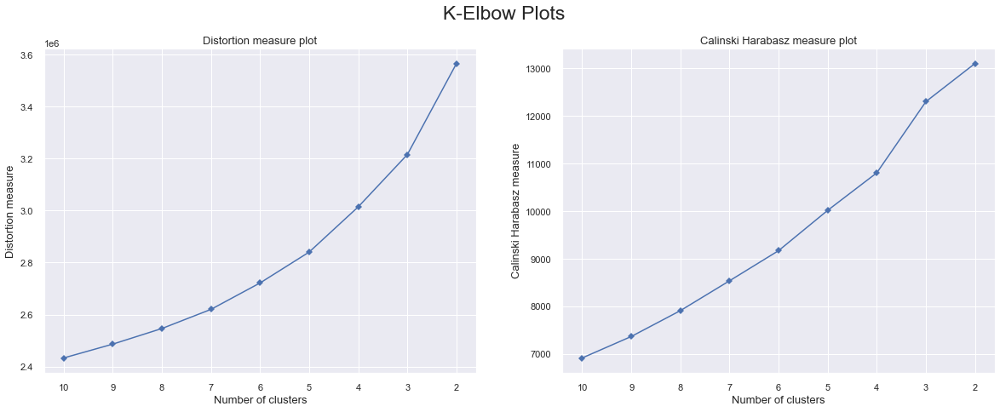

In [87]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_cen)

For n_clusters = 2, the average silhouette_score is : 0.12682448234419702
For n_clusters = 3, the average silhouette_score is : 0.12261529970712944
For n_clusters = 4, the average silhouette_score is : 0.11829450575505869
For n_clusters = 5, the average silhouette_score is : 0.12132511702328254
For n_clusters = 6, the average silhouette_score is : 0.11470870618169282
For n_clusters = 7, the average silhouette_score is : 0.11718585945087988
For n_clusters = 8, the average silhouette_score is : 0.11572675055790263
For n_clusters = 9, the average silhouette_score is : 0.10107169213722722
For n_clusters = 10, the average silhouette_score is : 0.092924035287782


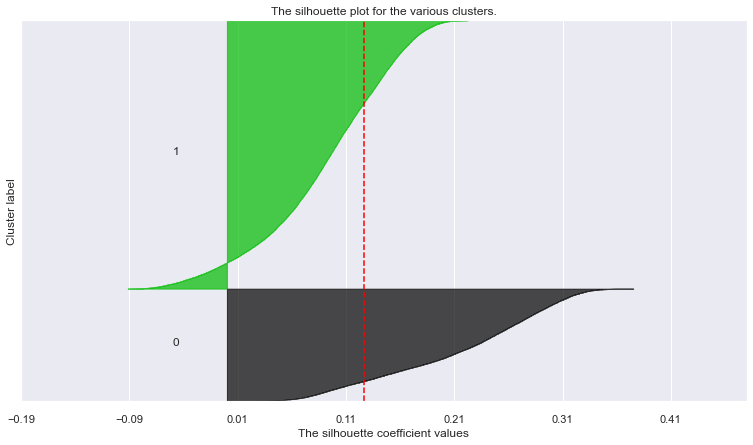

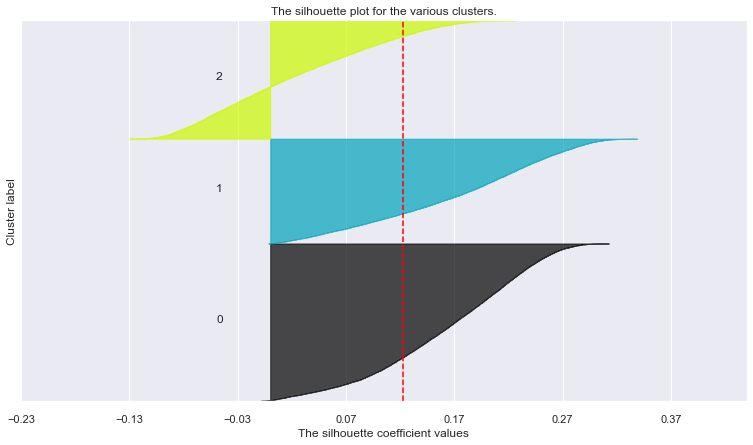

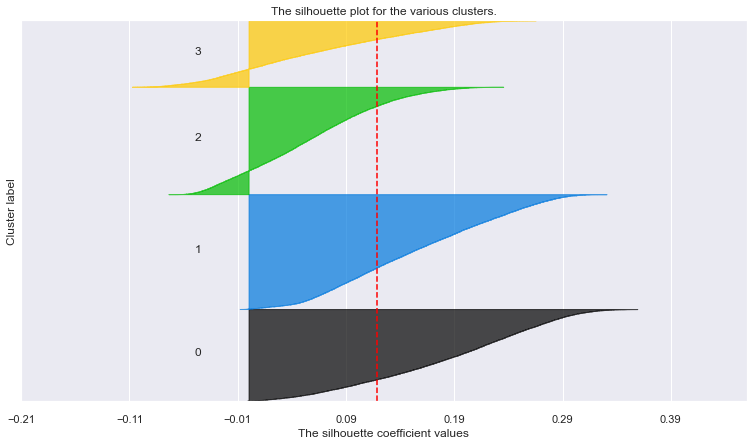

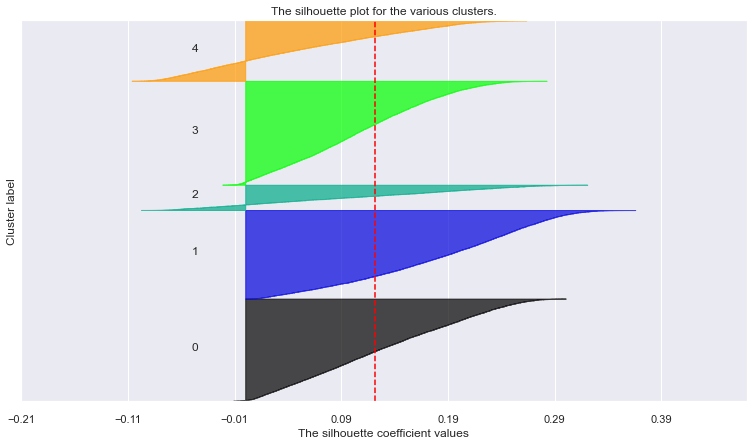

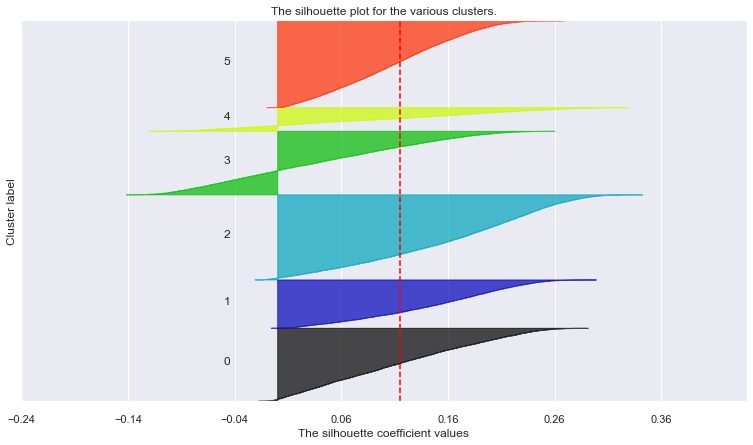

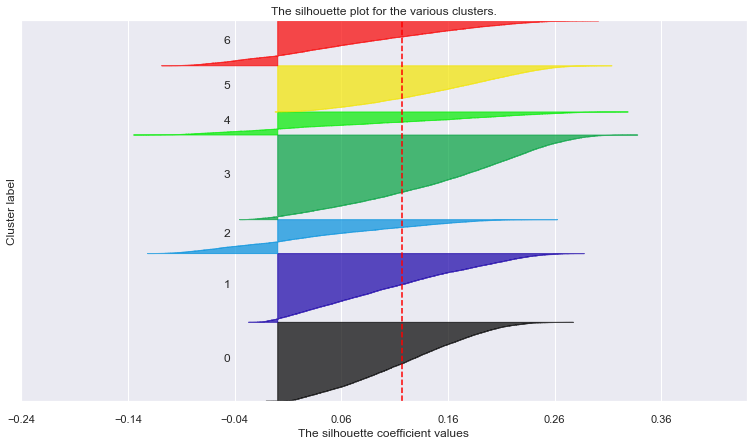

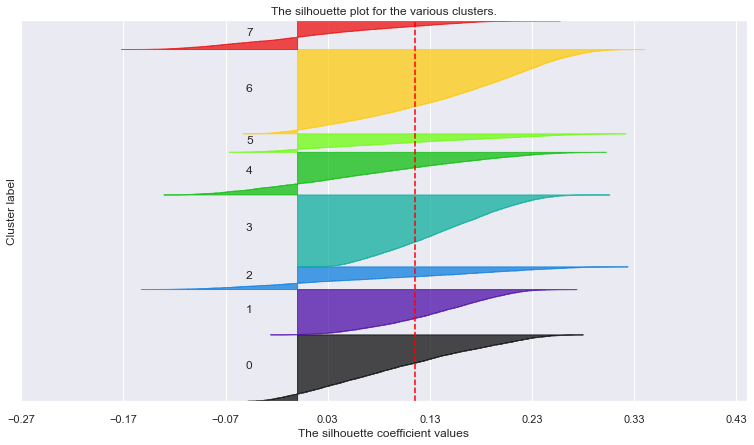

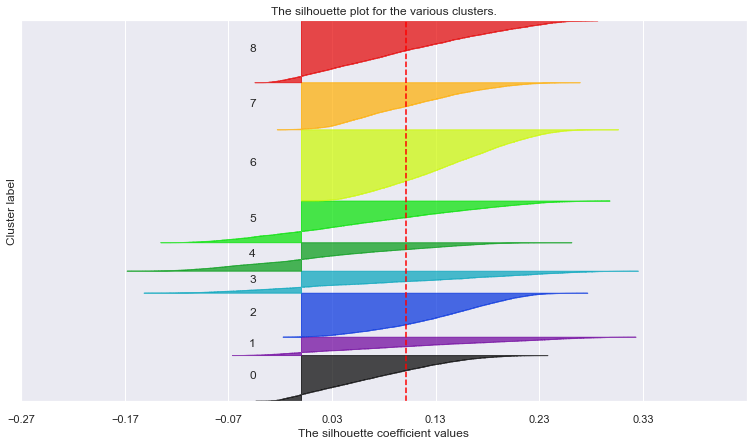

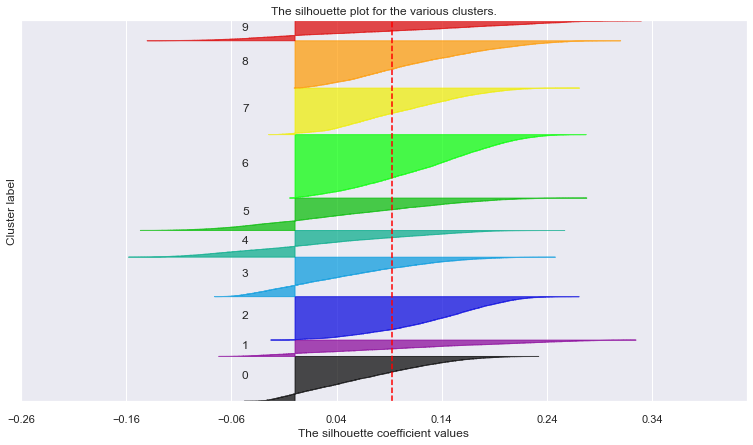

In [88]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_cen)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_cen, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_cen, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_cen) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

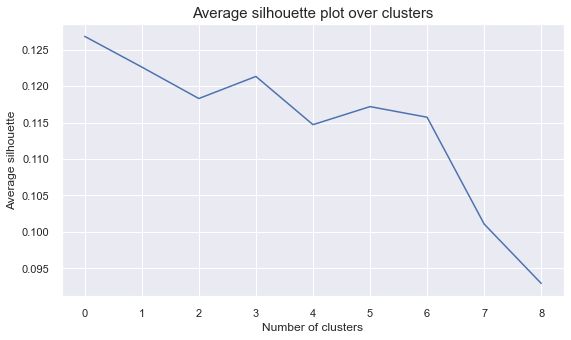

In [89]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#3-5

In [42]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_cen,4)
kmeans_cen_df = df_cen.copy()
kmeans_cen_df["kmeans_cen_labels"] = clust_labels

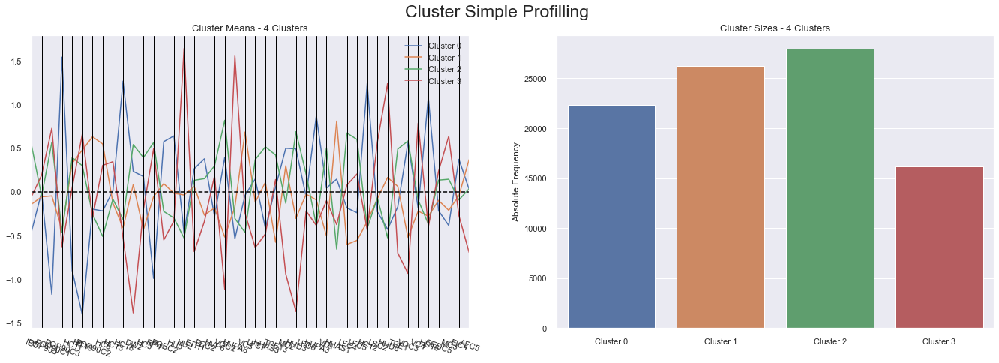

In [43]:
cluster_profiles(kmeans_cen_df, ["kmeans_cen_labels"], figsize=(23, 7))

In [44]:
#R2 score

r2(kmeans_cen_df, ["kmeans_cen_labels"])

0.27767066873656154

In [45]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values()

POP903     0.008043
LFC6       0.021574
HC13       0.027444
OEDC5      0.028931
EIC4       0.049616
HVP6       0.061469
LSC2       0.072571
PEC2       0.081664
ETH1       0.104677
HC5        0.114471
LFC7       0.121293
AFC5       0.122812
MC3        0.125312
VC4        0.132916
IC5        0.143536
HU5        0.145415
POBC2      0.150179
VC1        0.150609
TPE13      0.151695
POP90C2    0.157043
HHAS3      0.165811
TPE1       0.165864
HC8        0.190953
VC3        0.208652
LFC5       0.216755
MC2        0.244378
LFC4       0.248645
HUPA3      0.254811
HC11       0.272002
HHAS1      0.344840
HC16       0.374553
RP4        0.375619
HHD6       0.404679
VOC3       0.408051
DW2        0.437817
HC12       0.490662
HC18       0.515382
POP90C1    0.521315
HUPA6      0.527779
VOC2       0.531951
HHD3       0.554464
HU2        0.610728
HC19       0.645620
POP90C3    0.759802
dtype: float64

With this cluster we were able to see the most important variables for census segmentation. We will only keep the variables that have an R2 score above 0.50. In the chapter "Clustering with the most important features" we will proceed our exploration.

In [46]:
census = r2_variables(kmeans_cen_df, ['kmeans_cen_labels']).drop('kmeans_cen_labels').sort_values().tail(8).index.to_list()

In [47]:
census

['HC18', 'POP90C1', 'HUPA6', 'VOC2', 'HHD3', 'HU2', 'HC19', 'POP90C3']

## Interests segmentation

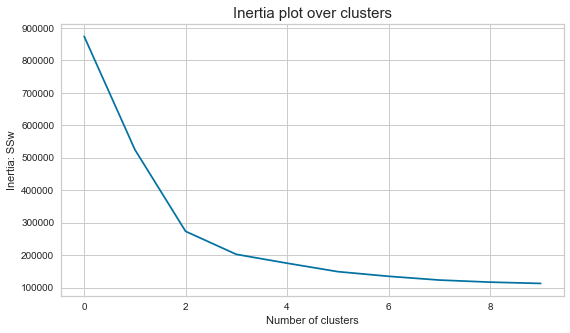

In [38]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_int)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

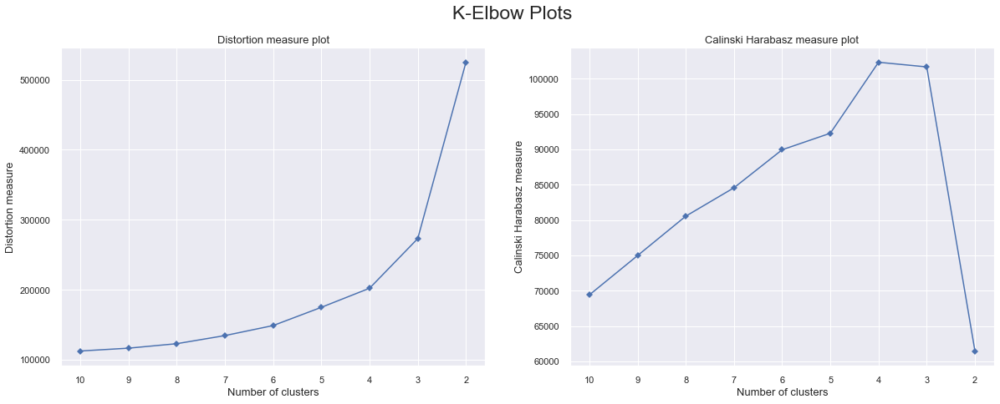

In [39]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_int)

For n_clusters = 2, the average silhouette_score is : 0.696170570864834
For n_clusters = 3, the average silhouette_score is : 0.6775166963453366
For n_clusters = 4, the average silhouette_score is : 0.5439811828871688
For n_clusters = 5, the average silhouette_score is : 0.4479664985294064
For n_clusters = 6, the average silhouette_score is : 0.44885780736822356
For n_clusters = 7, the average silhouette_score is : 0.4141460282748346
For n_clusters = 8, the average silhouette_score is : 0.41922673369818003
For n_clusters = 9, the average silhouette_score is : 0.41764341447146686
For n_clusters = 10, the average silhouette_score is : 0.42752740980075465


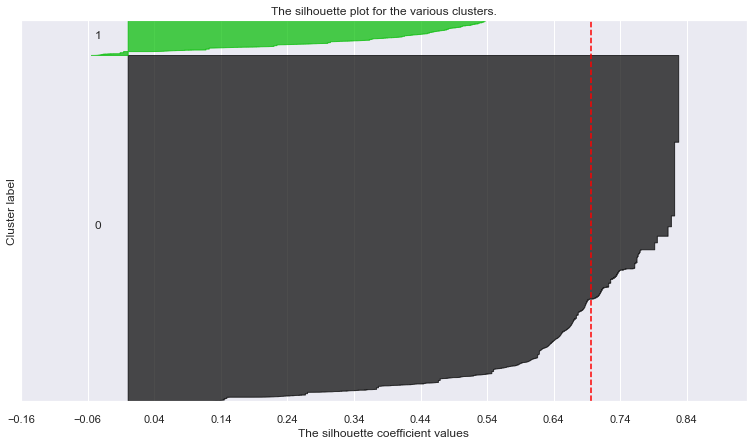

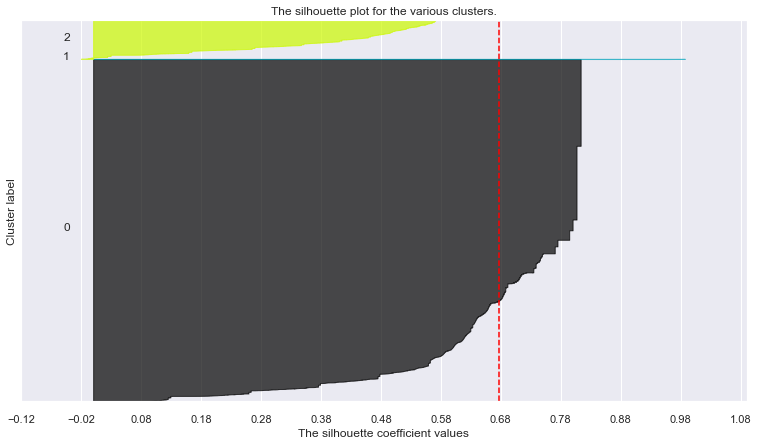

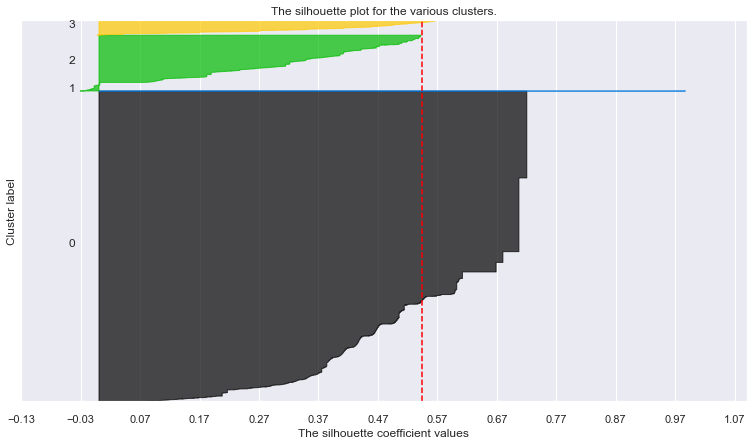

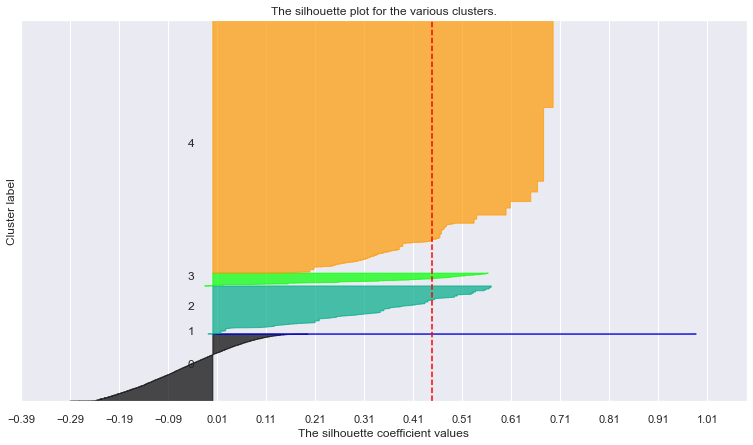

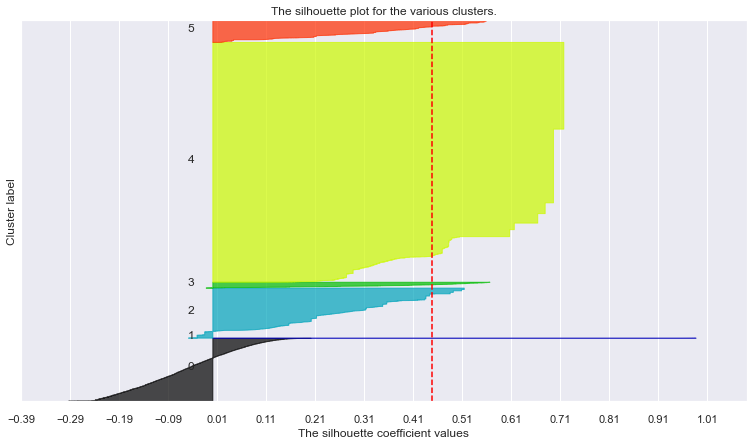

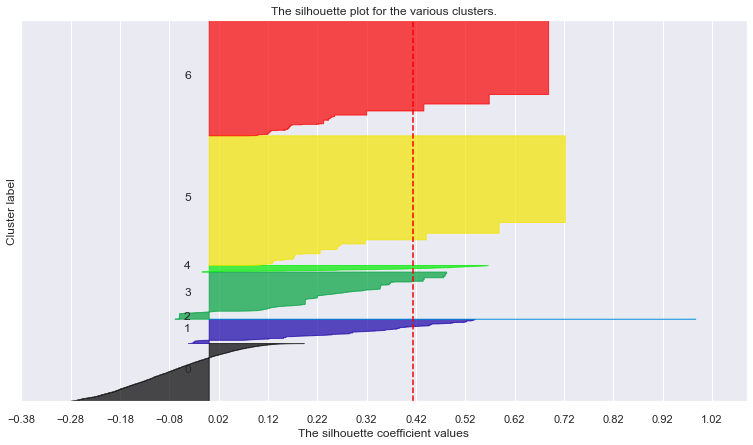

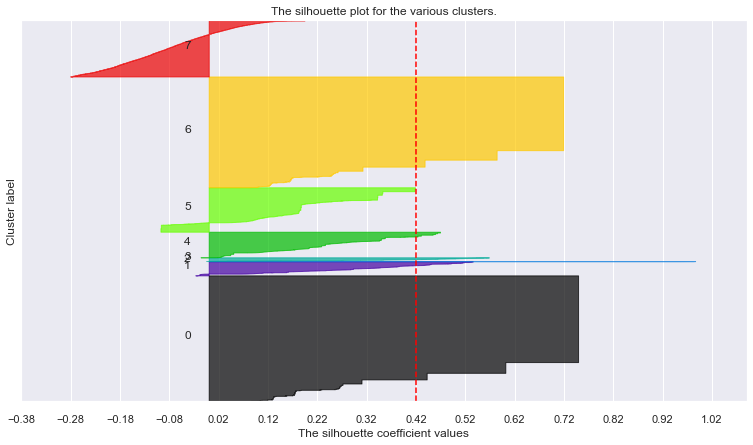

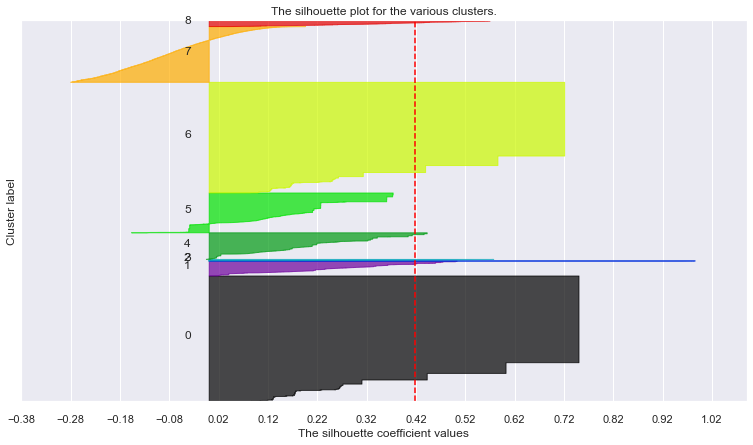

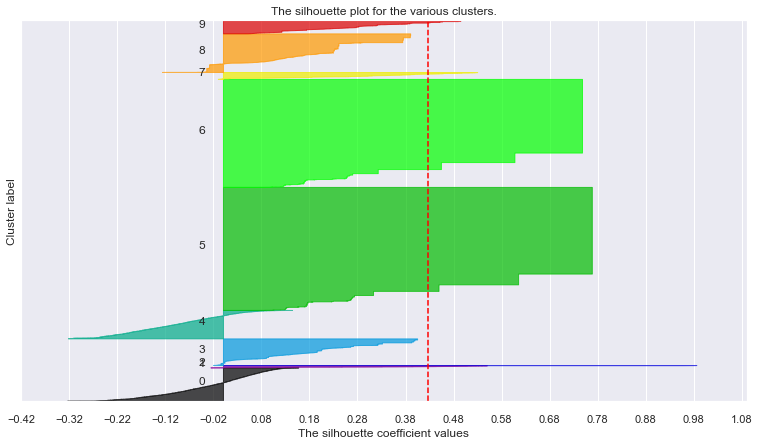

In [40]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_int)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_int, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_int, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_int) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

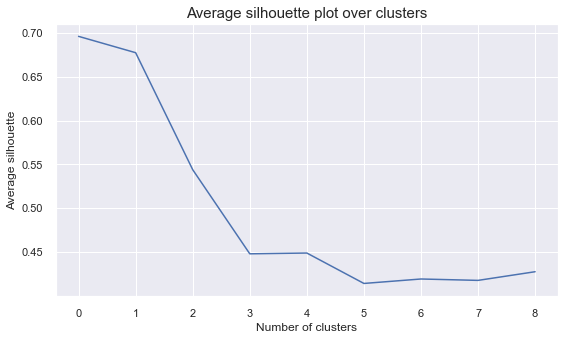

In [41]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [48]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_int, 4)
kmeans_int_df = df_int.copy()
kmeans_int_df["kmeans_int_labels"] = clust_labels

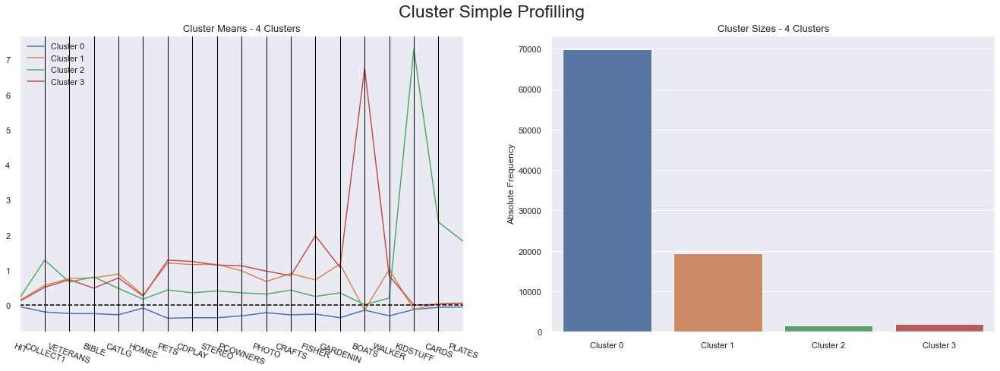

In [49]:
cluster_profiles(kmeans_int_df, ["kmeans_int_labels"], figsize=(23, 7))

In [50]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_int_df, ['kmeans_int_labels']).drop('kmeans_int_labels').sort_values()

HIT         0.006668
HOMEE       0.024023
PLATES      0.059281
CARDS       0.098682
COLLECT1    0.127994
PHOTO       0.151775
VETERANS    0.181470
BIBLE       0.186859
CATLG       0.237146
FISHER      0.241209
CRAFTS      0.243566
PCOWNERS    0.299229
WALKER      0.300770
GARDENIN    0.408620
STEREO      0.410511
CDPLAY      0.410735
PETS        0.444991
KIDSTUFF    0.922586
BOATS       0.981891
dtype: float64

In [51]:
r2(kmeans_int_df, ['kmeans_int_labels'])

0.31541405103154363

With this cluster we were able to see the most important variables for interest segmentation. We will only keep the variables that have an R2 score above 0.40. In the chapter "Clustering with the most important features" we will proceed our exploration.

In [52]:
intt = r2_variables(kmeans_int_df, ['kmeans_int_labels']).drop('kmeans_int_labels').sort_values().tail(5).index.to_list()

In [53]:
intt

['STEREO', 'CDPLAY', 'PETS', 'KIDSTUFF', 'BOATS']

# Clustering with the most important variables

In [42]:
df_dem

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME
CONTROLN,,,,,
95515,0.063676,-0.360928,-1.116803,-0.863304,-0.479693
148535,-0.961093,1.300858,0.895413,0.817879,1.320075
15078,0.131994,-0.360928,-1.116803,0.817879,-0.479693
172556,0.678537,-0.360928,-1.116803,-0.863304,-1.679539
7112,1.225080,1.300858,0.895413,-0.863304,-0.479693
...,...,...,...,...,...
184568,0.131994,-0.360928,-1.116803,0.817879,-0.479693
122706,-0.824457,1.300858,0.895413,0.817879,1.919998
189641,-0.004642,-0.360928,-1.116803,0.817879,-0.479693


In [54]:
#will only keep the most interesting variables for our analysis
census = ['POP90C1', 'HU2','HHD3','POP90C3']
df_cen2 = df_cen[census] 
df_cen2

,POP90C1,HU2,HHD3,POP90C3
CONTROLN,,,,
95515,-1.246311,-0.753171,0.697753,0.959165
148535,0.845151,-1.237107,1.874786,-0.658330
15078,-1.246311,-0.366023,0.370800,1.780354
172556,-1.246311,1.085784,0.109237,1.631047
7112,0.845151,-0.946746,-0.675451,-0.658330
...,...,...,...,...
35088,-1.246311,-0.801565,0.959316,1.805239
184568,0.845151,0.698635,-0.217716,-0.658330
122706,0.781774,-0.849958,1.678614,-0.558792


In [55]:
df_sum2= df_sum[summ]
df_sum2

,LASTGIFT,MAXRAMNT,NEXTDATE,AVGGIFT,CARDGIFT,PEPSTRFL
CONTROLN,,,,,,
95515,-0.619897,-0.561733,0.714133,-0.681649,1.988605,1.054636
148535,0.687573,0.396992,-0.982989,0.313356,-0.896453,-0.948195
15078,-1.055720,-0.266740,0.434478,-0.714351,1.988605,1.054636
172556,-0.619897,-0.635481,1.491866,-0.798346,0.435112,1.054636
7112,-0.184074,-0.340488,3.995967,-0.791771,0.657040,-0.948195
...,...,...,...,...,...,...
35088,-1.317214,-0.782977,0.630054,-1.229948,1.544750,1.054636
184568,0.687573,0.396992,-1.264472,1.485220,-1.118381,-0.948195
122706,0.251750,0.028252,-1.169426,0.857435,-1.118381,-0.948195


In [56]:
df_int2 = df_int[intt]
df_int2

,STEREO,CDPLAY,PETS,KIDSTUFF,BOATS
CONTROLN,,,,,
95515,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
148535,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
15078,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
172556,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
7112,2.528834,-0.386025,-0.422929,-0.128975,-0.147964
...,...,...,...,...,...
35088,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
184568,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
122706,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964


# K-means

## Demographic variables

In [58]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_dem, 5)
kmeans_dem2_df = df_dem.copy()
kmeans_dem2_df["kmeans_dem2_labels"] = clust_labels

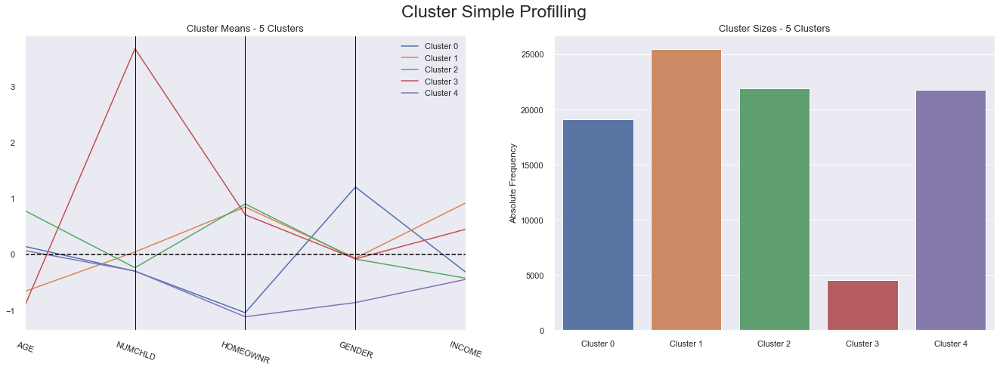

In [59]:
cluster_profiles(kmeans_dem2_df, ["kmeans_dem2_labels"], figsize=(23, 7))

Cluster 0 -> young group of people, highest number of children, homeowner, mixed group of female and male people and highest bound of income 

Cluster 1 -> middle group in terms of age, no kids, not a homeowner, male, slightly above the lower boundary of income

Cluster 2 -> youngest group, with a big number of children, is a homeowner, mixed group of female and male people and has the second highest income.

Cluster 3 -> oldest group, a few number of kids, is a homeowner, mixed group of female and male people and the lower bound of income

Cluster 4 -> middle group in terms of age, no kids, not a homeowner, female and the lower bound of income


In [60]:
#R2 score

r2(kmeans_dem2_df, ["kmeans_dem2_labels"])

0.6840944782530884

In [61]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_dem2_df, ['kmeans_dem2_labels']).drop('kmeans_dem2_labels').sort_values()

AGE         0.310821
INCOME      0.350729
GENDER      0.473472
NUMCHLD     0.711337
HOMEOWNR    0.924414
dtype: float64

## Census variables

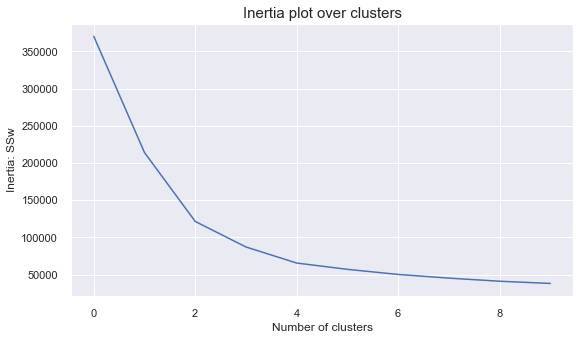

In [64]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_cen2)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

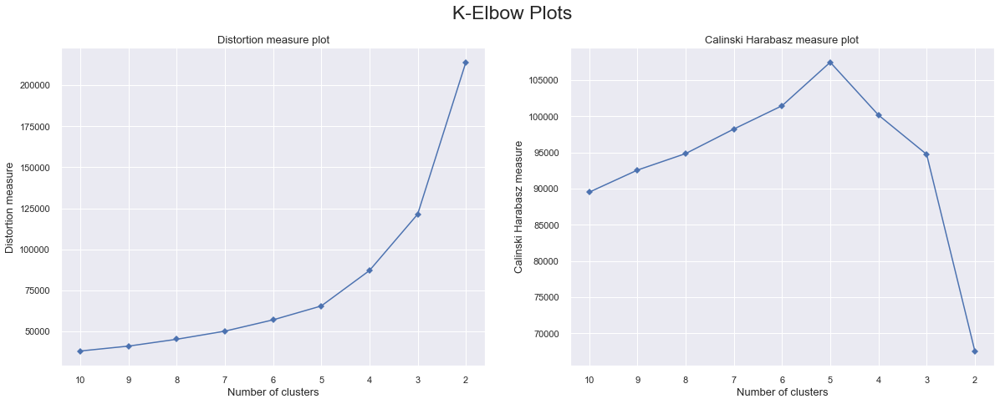

In [65]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=10, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_cen2)

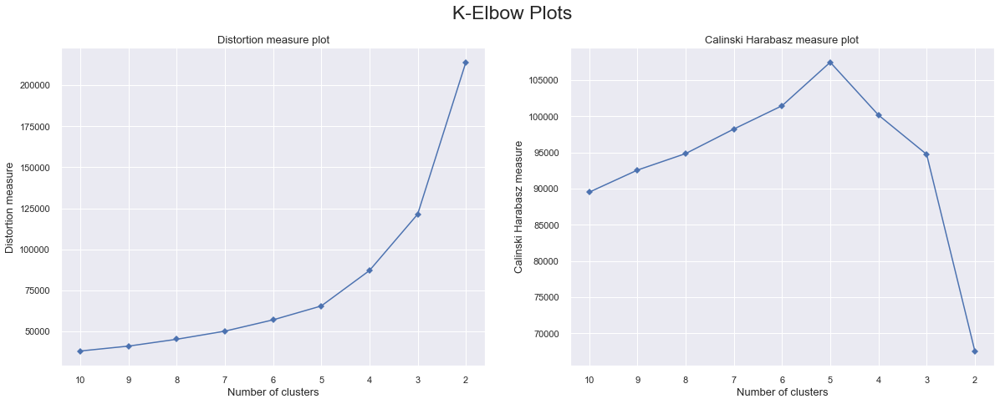

In [382]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=10, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_cen2)

For n_clusters = 2, the average silhouette_score is : 0.44681909752467314
For n_clusters = 3, the average silhouette_score is : 0.47653923884768723
For n_clusters = 4, the average silhouette_score is : 0.5045345810703783
For n_clusters = 5, the average silhouette_score is : 0.4791507687327872


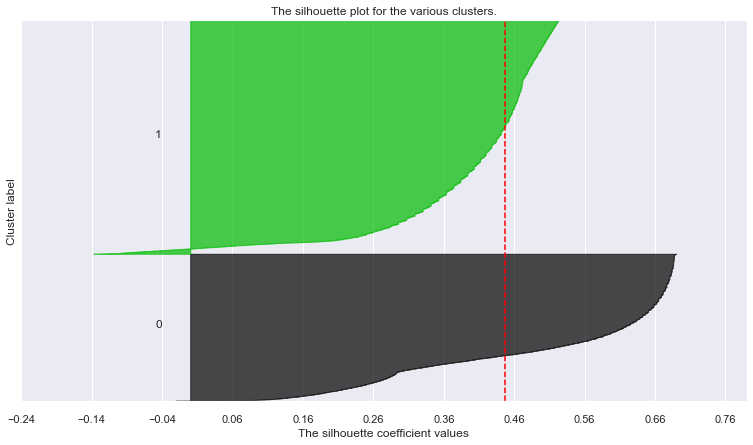

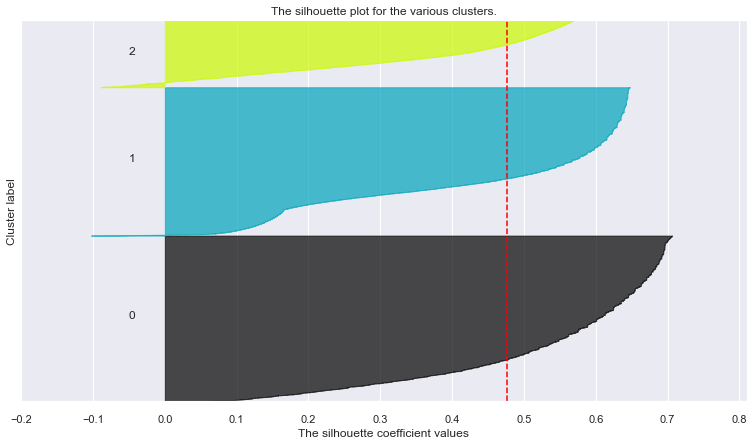

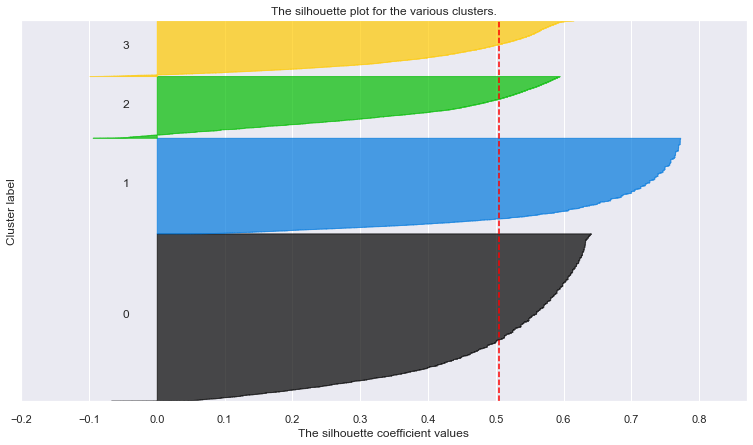

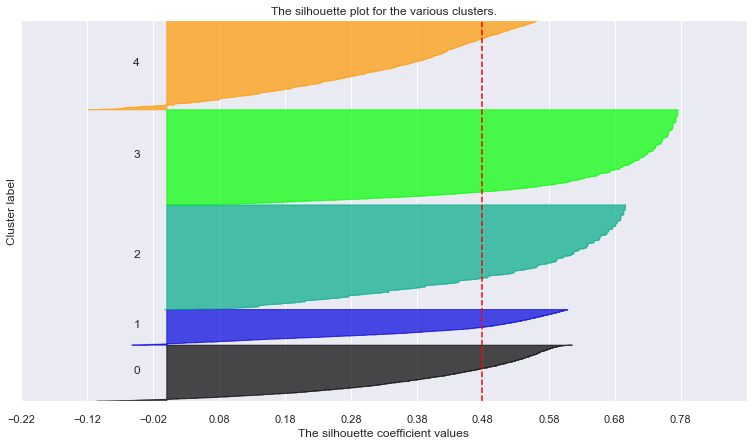

In [55]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,6):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_cen2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_cen2, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_cen2, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_cen2) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))
    
#

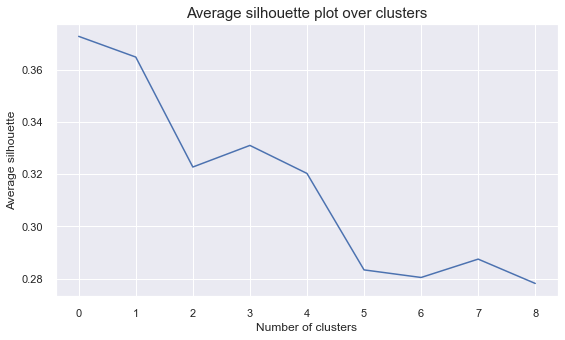

In [155]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [62]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_cen2, 4)
kmeans_cen2_df = df_cen2.copy()
kmeans_cen2_df["kmeans_cen2_labels"] = clust_labels

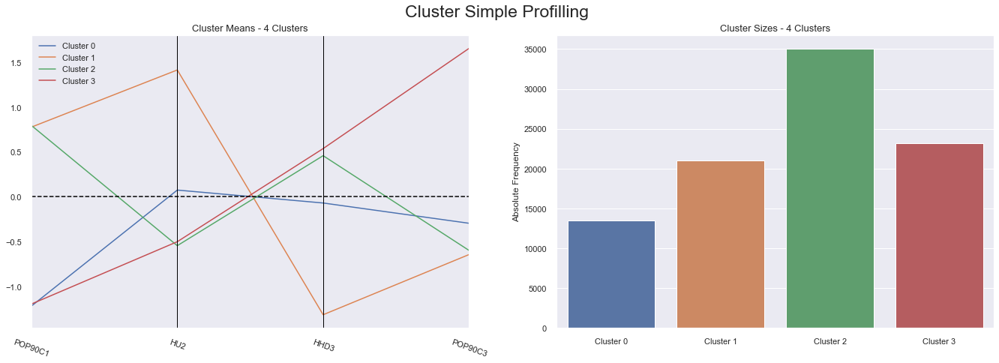

In [63]:
cluster_profiles(kmeans_cen2_df, ["kmeans_cen2_labels"], figsize=(23, 7))


Cluster 0 -> urban area, high percentage of renter occupied units, almost no Married Couple Families, non Rural Area 

Cluster 1 -> urban area, very low percentage of renter occupied units, a lot of Married Couple Families, male, non rural area

Cluster 2 -> non urban area, very low percentage of renter occupied units, great number of Married Couple Families, Rural Area

Cluster 3 -> non urban area, a slightly significant percentage of renter occupied units, some Married Couple Families, group with a few people in a rural area



In [64]:
#R2 score

r2(kmeans_cen2_df, ["kmeans_cen2_labels"])

0.8113171045857138

In [65]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_cen2_df, ['kmeans_cen2_labels']).drop('kmeans_cen2_labels').sort_values()

HHD3       0.545880
HU2        0.630766
POP90C3    0.930333
POP90C1    0.952065
dtype: float64

## Summary variables

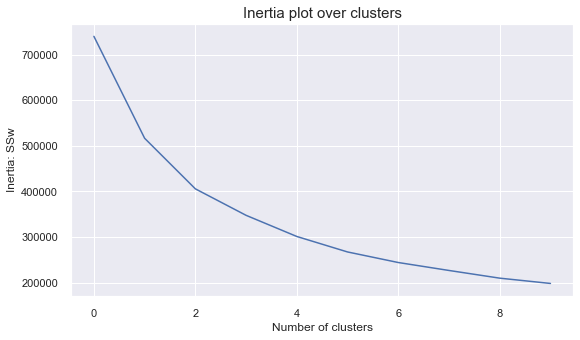

In [165]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_sum2)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

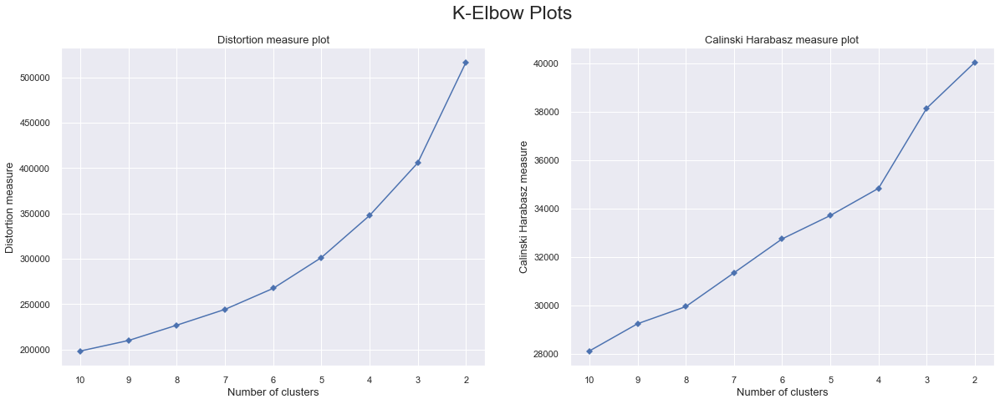

In [166]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_sum2)

For n_clusters = 2, the average silhouette_score is : 0.36001050323496914
For n_clusters = 3, the average silhouette_score is : 0.38000491340097997
For n_clusters = 4, the average silhouette_score is : 0.3744666165541512
For n_clusters = 5, the average silhouette_score is : 0.3224921768122629


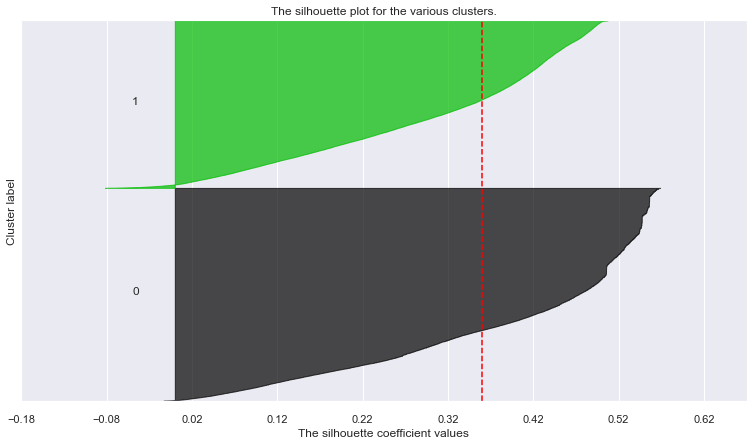

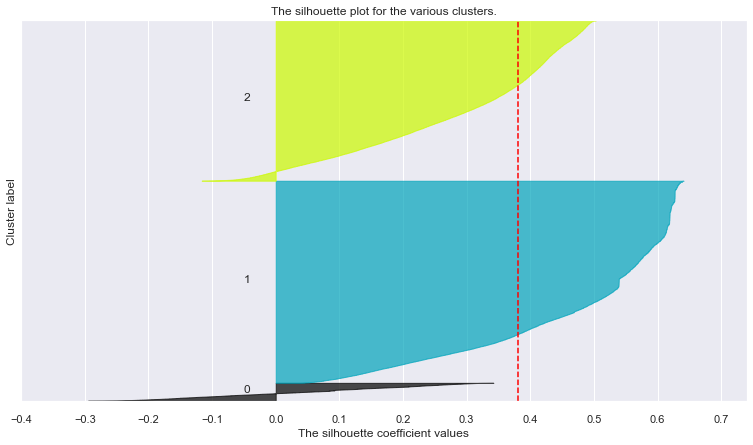

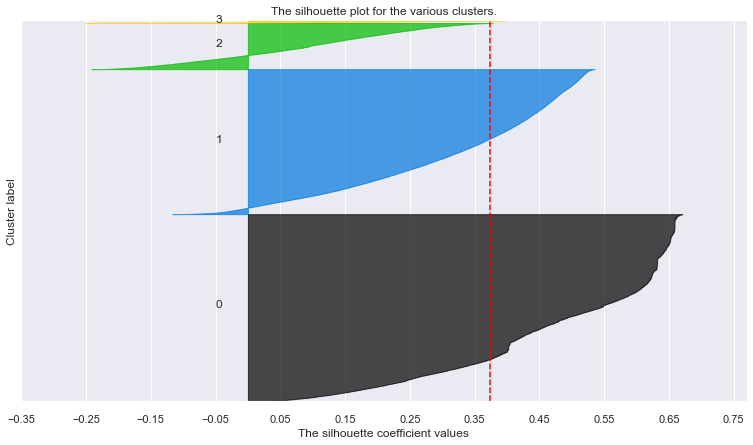

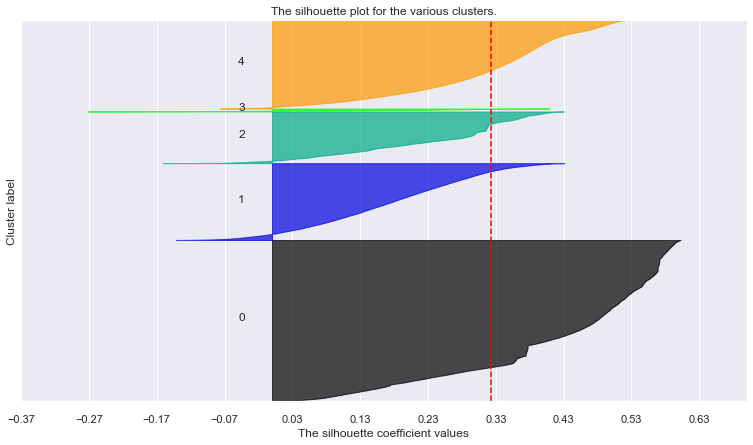

In [70]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,6):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_sum2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_sum2, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_sum2, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_sum2) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

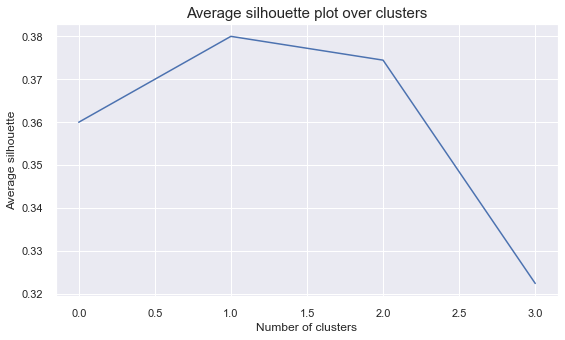

In [71]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#3 ou 4

In [66]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_sum2, 3)
kmeans_sum2_df = df_sum2.copy()
kmeans_sum2_df["kmeans_sum2_labels"] = clust_labels

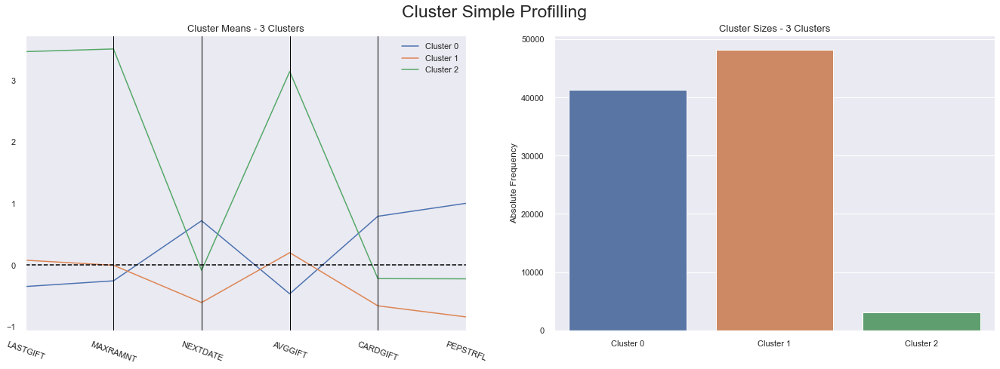

In [67]:
cluster_profiles(kmeans_sum2_df, ["kmeans_sum2_labels"], figsize=(23, 7))

Cluster 0 -> spent the least in the largest gift to date, spent the least money in the most recent gift, lowest average dollar amount of gifts to date, upper group of date of second gift (did it the most recent time), first position with the highest number of lifetime gifts to card promotions to date, group with PEP star RFA status

out:'middle group of money spent in all the lifetime gifts to date, spent the least money in the last promotion (RFA_2), '

Cluster 1 -> middle group of money spent in the largest gift to date, middle group of money spent in the most recent gift, middle group in the average dollar amount of gifts to date, date of second gift took in the last place in this dataset, last position with the highest number of lifetime gifts to card promotions to date, group with no PEP star RFA status

out:'spent the least money in all the lifetime gifts to date, middle group of money spent in the last promotion (RFA_2), '

Cluster 2 -> spent the most in the largest gift to date, spent the most money in the most recent gift, highest average dollar amount of gifts to date, middle group of date of second gift, second position with the highest number of lifetime gifts to card promotions to date, mixed group with PEP star RFA status

out:'spent the most money in all the lifetime gifts to date, spent the most money in the last promotion (RFA_2), '

In [68]:
#R2 score

r2(kmeans_sum2_df, ["kmeans_sum2_labels"])

0.5416717578588639

In [69]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_sum2_df, ['kmeans_sum2_labels']).drop('kmeans_sum2_labels').sort_values()

NEXTDATE    0.425105
MAXRAMNT    0.442155
AVGGIFT     0.449869
LASTGIFT    0.460246
CARDGIFT    0.510305
PEPSTRFL    0.820585
dtype: float64

## Interest variables

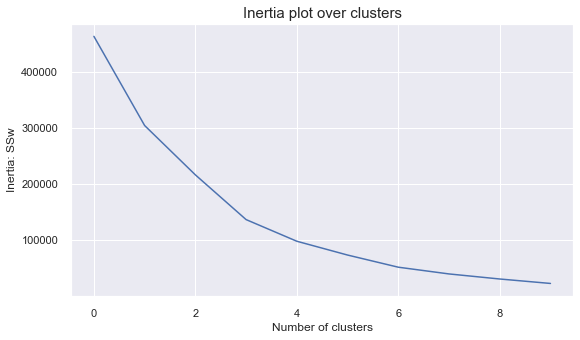

In [169]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_int2)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

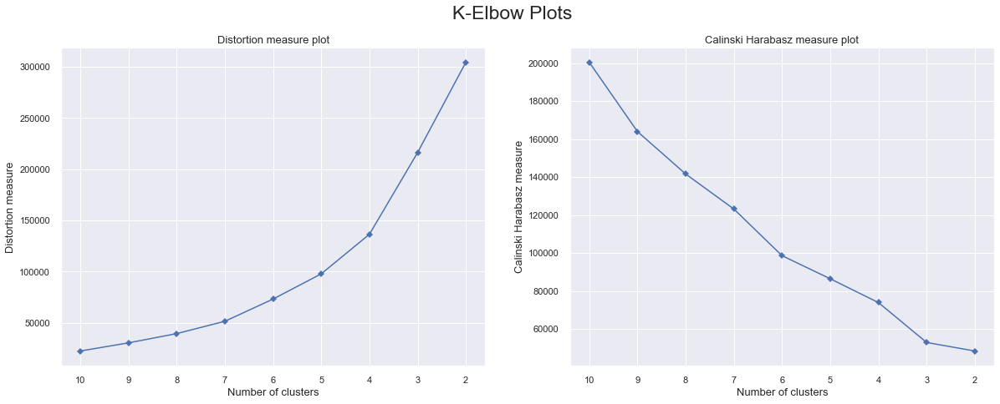

In [170]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_int2)

For n_clusters = 2, the average silhouette_score is : 0.7514593439946456
For n_clusters = 3, the average silhouette_score is : 0.7772794104940365
For n_clusters = 4, the average silhouette_score is : 0.7961220361490605
For n_clusters = 5, the average silhouette_score is : 0.8355243350404302


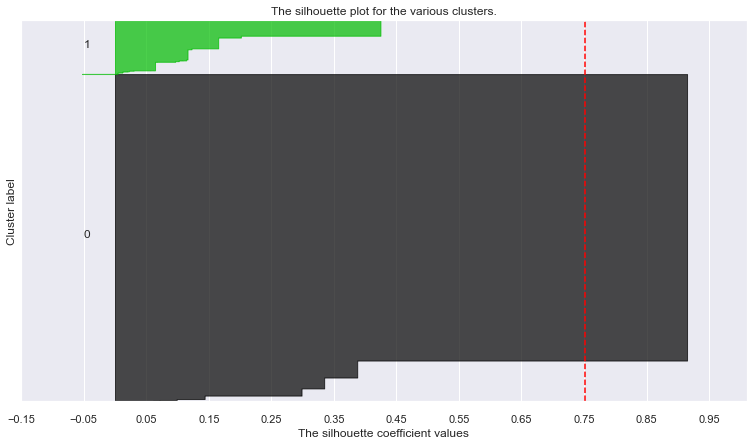

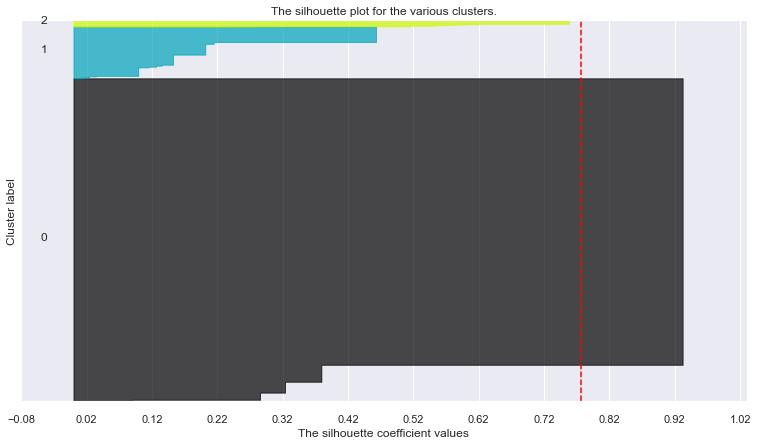

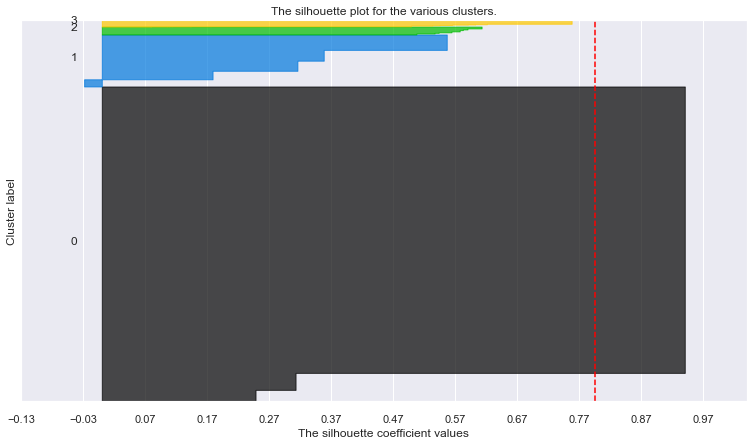

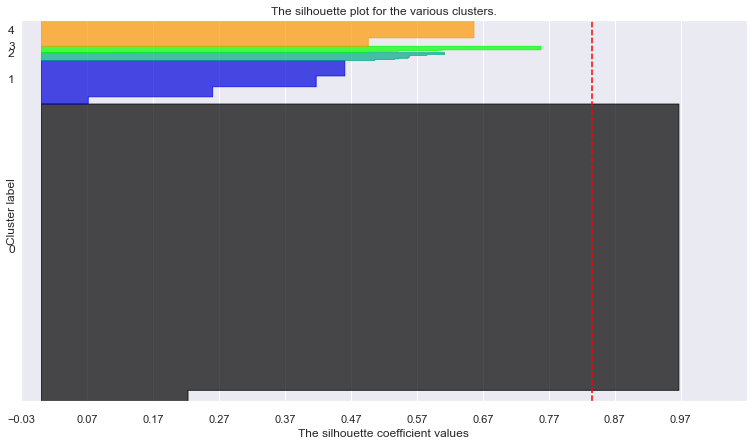

In [171]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,6):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_int2)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_int2, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_int2, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_int2) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

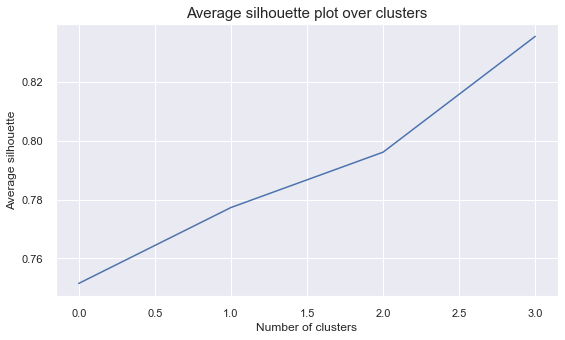

In [172]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

#

In [70]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_int2, 4)
kmeans_int2_df = df_int2.copy()
kmeans_int2_df["kmeans_int2_labels"] = clust_labels

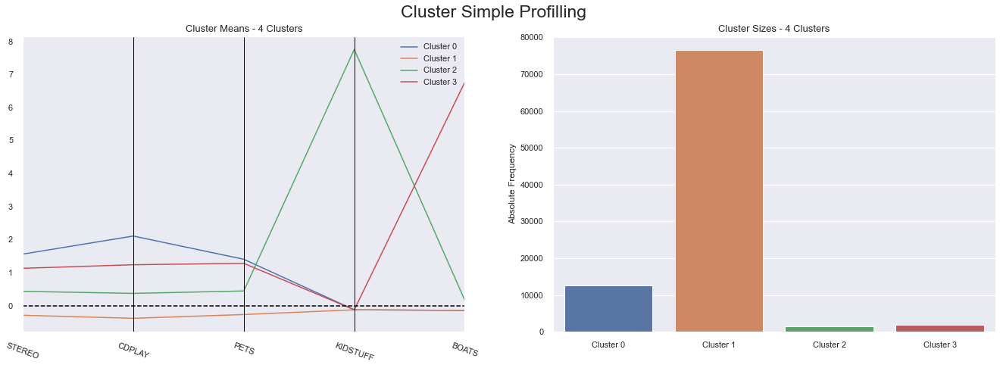

In [71]:
cluster_profiles(kmeans_int2_df, ["kmeans_int2_labels"], figsize=(23, 7))

Cluster 0 -> group with a slight more interest in stereo, cdplay and pets

Cluster 1 -> group with no significant interests

Cluster 2 -> big interest in kidstuff

Cluster 3 -> big interest in boats

In [72]:
#R2 score

r2(kmeans_int2_df, ["kmeans_int2_labels"])

0.718252462102859

In [73]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_int2_df, ['kmeans_int2_labels']).drop('kmeans_int2_labels').sort_values()

PETS        0.366414
STEREO      0.432007
CDPLAY      0.761614
BOATS       0.966563
KIDSTUFF    1.000000
dtype: float64

## All Data Segmentation

In [178]:
df_dem

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME
CONTROLN,,,,,
95515,0.063169,-0.360666,-1.116268,-0.863232,-0.479556
148535,-0.961915,1.302090,0.895842,0.817624,1.320615
15078,0.131508,-0.360666,-1.116268,0.817624,-0.479556
172556,0.678220,-0.360666,-1.116268,-0.863232,-1.679670
7112,1.224931,1.302090,0.895842,-0.863232,-0.479556
...,...,...,...,...,...
35088,-0.688559,-0.360666,0.895842,-0.863232,1.320615
184568,0.131508,-0.360666,-1.116268,0.817624,-0.479556
122706,-0.825237,1.302090,0.895842,0.817624,1.920673


In [177]:
df_sum2

,MAXRAMNT,LASTGIFT,NEXTDATE,AVGGIFT,CARDGIFT,PEPSTRFL
CONTROLN,,,,,,
95515,-0.561733,-0.619897,0.714133,-0.681649,1.988605,1.054636
148535,0.396992,0.687573,-0.982989,0.313356,-0.896453,-0.948195
15078,-0.266740,-1.055720,0.434478,-0.714351,1.988605,1.054636
172556,-0.635481,-0.619897,1.491866,-0.798346,0.435112,1.054636
7112,-0.340488,-0.184074,3.995967,-0.791771,0.657040,-0.948195
...,...,...,...,...,...,...
35088,-0.782977,-1.317214,0.630054,-1.229948,1.544750,1.054636
184568,0.396992,0.687573,-1.264472,1.485220,-1.118381,-0.948195
122706,0.028252,0.251750,-1.169426,0.857435,-1.118381,-0.948195


In [179]:
df_cen2

,POP90C1,HU2,HHD3,POP90C3
CONTROLN,,,,
95515,-1.246311,-0.753171,0.697753,0.959165
148535,0.845151,-1.237107,1.874786,-0.658330
15078,-1.246311,-0.366023,0.370800,1.780354
172556,-1.246311,1.085784,0.109237,1.631047
7112,0.845151,-0.946746,-0.675451,-0.658330
...,...,...,...,...
35088,-1.246311,-0.801565,0.959316,1.805239
184568,0.845151,0.698635,-0.217716,-0.658330
122706,0.781774,-0.849958,1.678614,-0.558792


In [74]:
dem_sum = df_dem.merge(df_sum2, on='CONTROLN') #.drop(['RFA_2A', 'AVGGIFT', 'LASTGIFT'], axis=1)
df_merged_ = dem_sum.merge(df_cen2, on='CONTROLN')
df_merged = df_merged_.merge(df_int2, on='CONTROLN')
df_merged

#com todos do summary segment

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,LASTGIFT,MAXRAMNT,NEXTDATE,AVGGIFT,CARDGIFT,PEPSTRFL,POP90C1,HU2,HHD3,POP90C3,STEREO,CDPLAY,PETS,KIDSTUFF,BOATS
CONTROLN,,,,,,,,,,,,,,,,,,,,
95515,0.063169,-0.360666,-1.116268,-0.863232,-0.479556,-0.619897,-0.561733,0.714133,-0.681649,1.988605,1.054636,-1.246311,-0.753171,0.697753,0.959165,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
148535,-0.961915,1.302090,0.895842,0.817624,1.320615,0.687573,0.396992,-0.982989,0.313356,-0.896453,-0.948195,0.845151,-1.237107,1.874786,-0.658330,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
15078,0.131508,-0.360666,-1.116268,0.817624,-0.479556,-1.055720,-0.266740,0.434478,-0.714351,1.988605,1.054636,-1.246311,-0.366023,0.370800,1.780354,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
172556,0.678220,-0.360666,-1.116268,-0.863232,-1.679670,-0.619897,-0.635481,1.491866,-0.798346,0.435112,1.054636,-1.246311,1.085784,0.109237,1.631047,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
7112,1.224931,1.302090,0.895842,-0.863232,-0.479556,-0.184074,-0.340488,3.995967,-0.791771,0.657040,-0.948195,0.845151,-0.946746,-0.675451,-0.658330,2.528834,-0.386025,-0.422929,-0.128975,-0.147964
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35088,-0.688559,-0.360666,0.895842,-0.863232,1.320615,-1.317214,-0.782977,0.630054,-1.229948,1.544750,1.054636,-1.246311,-0.801565,0.959316,1.805239,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
184568,0.131508,-0.360666,-1.116268,0.817624,-0.479556,0.687573,0.396992,-1.264472,1.485220,-1.118381,-0.948195,0.845151,0.698635,-0.217716,-0.658330,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964
122706,-0.825237,1.302090,0.895842,0.817624,1.920673,0.251750,0.028252,-1.169426,0.857435,-1.118381,-0.948195,0.781774,-0.849958,1.678614,-0.558792,-0.395439,-0.386025,-0.422929,-0.128975,-0.147964


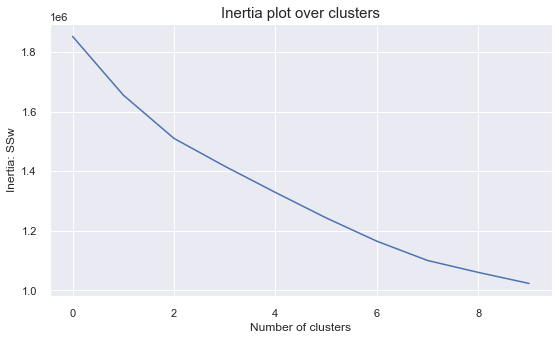

In [183]:
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_merged)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

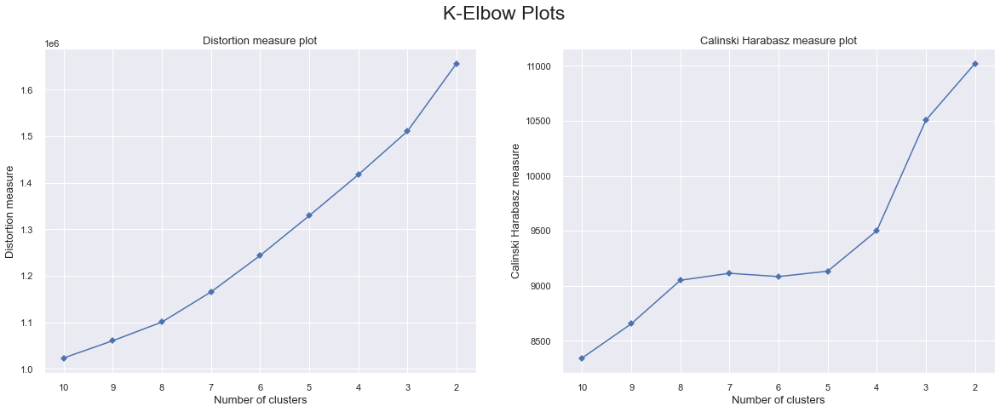

In [184]:
# Instantiate a scikit-learn K-Means model
clus_estim = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
# K-elbow plots
kelbowplots(clus_estim, df_merged)

For n_clusters = 2, the average silhouette_score is : 0.11481227683306638
For n_clusters = 3, the average silhouette_score is : 0.12003047021708473
For n_clusters = 4, the average silhouette_score is : 0.12298587806382631
For n_clusters = 5, the average silhouette_score is : 0.11599259802975934


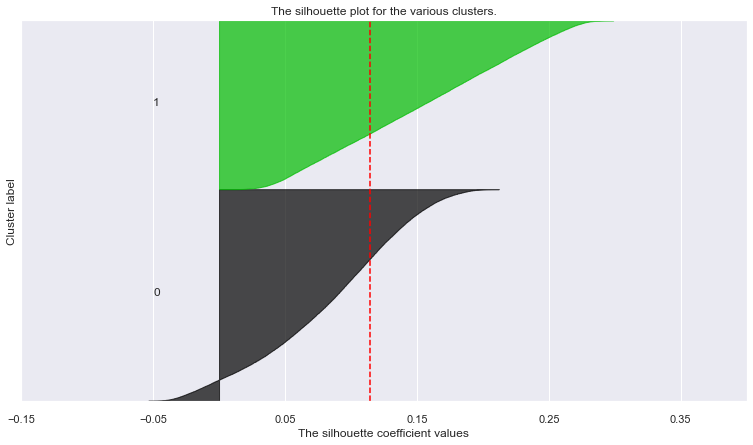

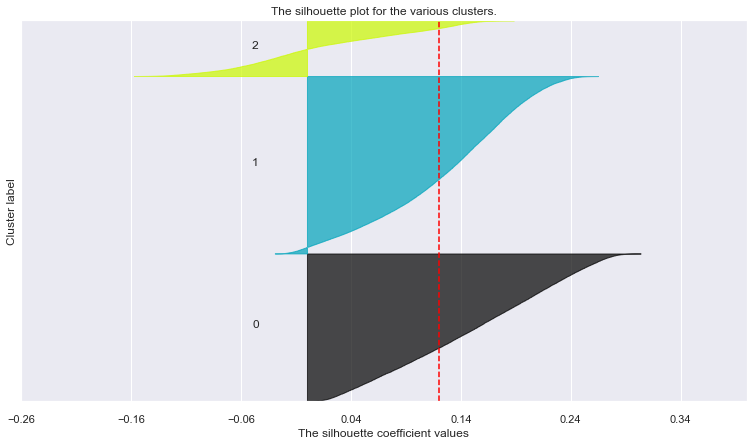

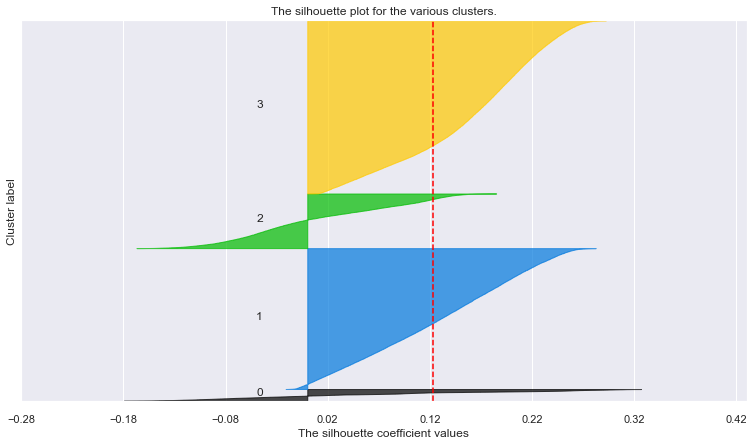

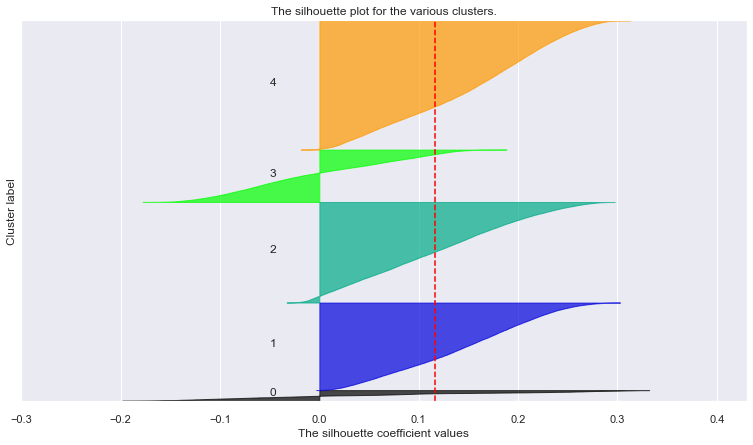

In [185]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,6):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_merged)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_merged, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_merged, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_merged) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

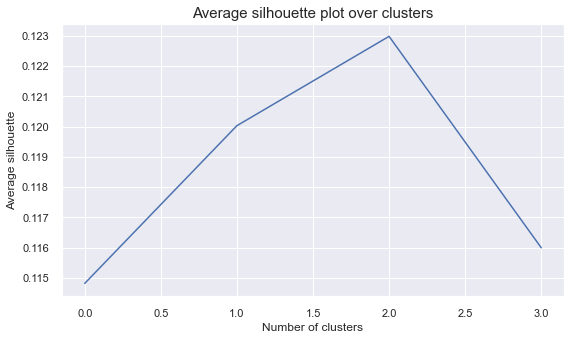

In [186]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [86]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_merged, 4)
kmeans_merged_df = df_merged.copy()
kmeans_merged_df["kmeans_merged_labels"] = clust_labels

#com todos do summary segment

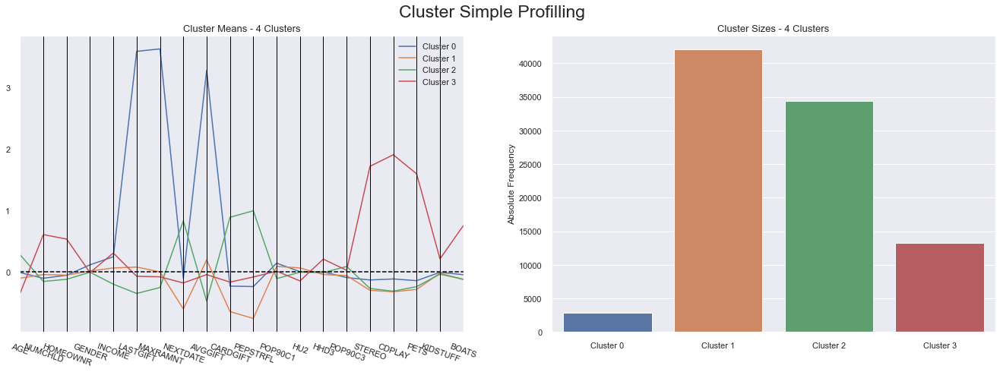

In [88]:
cluster_profiles(kmeans_merged_df, ["kmeans_merged_labels"], figsize=(23, 7))

In [77]:
#R2 score

r2(kmeans_merged_df, ["kmeans_merged_labels"])

#drop gender

0.25691346777987434

In [78]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(kmeans_merged_df, ['kmeans_merged_labels']).drop('kmeans_merged_labels').sort_values()

GENDER      0.000499
POP90C3     0.004854
HU2         0.004950
HHD3        0.007022
KIDSTUFF    0.007078
POP90C1     0.008693
INCOME      0.032132
HOMEOWNR    0.047659
AGE         0.051568
NUMCHLD     0.063082
BOATS       0.093473
PETS        0.424450
NEXTDATE    0.427484
MAXRAMNT    0.432621
AVGGIFT     0.435152
LASTGIFT    0.447867
CARDGIFT    0.487955
STEREO      0.492094
CDPLAY      0.605872
PEPSTRFL    0.630714
dtype: float64

In [94]:
df_merged_final = df_merged.drop(['GENDER','KIDSTUFF'], axis=1)

#gender has very low variance in the graph and contributes very little for r2 and kidstuff goes very similarly with numchild

In [95]:
# Performing kmeans and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels, cent = clus_Kmeans(df_merged_final, 4)
kmeans_merged_df = df_merged_final.copy()
kmeans_merged_df["kmeans_merged_labels"] = clust_labels

#com todos do summary segment

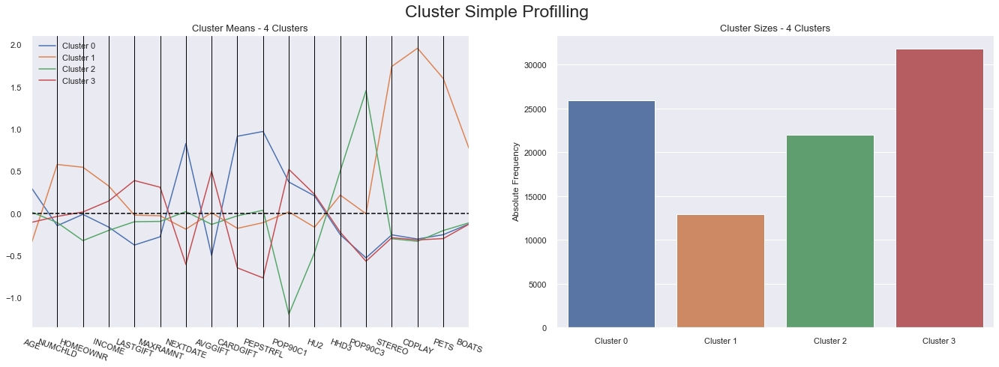

In [96]:
cluster_profiles(kmeans_merged_df, ["kmeans_merged_labels"], figsize=(23, 7))

escrever o novo

Cluster 0 -> slightly older group of people, with a bit less children, mixed group of people who are homeowners and who are not, slightly comparatively below income, spent the most in all the lifetime gifts to date but spent the least in the last promotion (RFA_2) and in the largest gift to date, leastamount of most recent gift, the least Average dollar amount of gifts to date,the second gift was done the most recent, highest number of lifetime gifts to card promotions to date, every person has PEP star RFA status, most live in an Urbanized Area, mixed people in renter occupied housing units and some live Inside Rural Area, in the neighborhood there is a low Percentage of Married Couple Families.


Cluster 1 -> younger group of people, slightly less people who are homeowners, slightly comparatively below income, spent the second least in all the lifetime gifts to date and spent second the least in the last promotion (RFA_2) and in the largest gift to date, few people have the PEP star RFA status, most do not live in an Urbanized Area, most people do not live in renter occupied housing units and most live Inside Rural Area, in the neighborhood there is a higher Percentage of Married Couple Families.


(least amount of most recent gift, the least Average dollar amount of gifts to date,the second gift was done the most recent, highest number of lifetime gifts to card promotions to date, )



Cluster 2 -> younger group of people, with a bit more children, slightly more people who are homeowners, slightly above income, spent least in all the lifetime gifts to date but spent the most in the last promotion (RFA_2) and in the largest gift to date, least amount of most recent gift, the highest Average dollar amount of gifts to date,the second gift was done the most time ago, lowest number of lifetime gifts to card promotions to date, few people have the PEP star RFA status, most live in an non Urbanized Area, more people live in renter occupied housing units and many people live Inside Rural Areas, in the neighborhood there is a lower Percentage of Married Couple Families.


In all the clusters there is a mix of people from both genders.

In [97]:
#R2 score

r2(kmeans_merged_df, ["kmeans_merged_labels"])

#drop gender

0.3156055738593303

In the rest of the notebook, we continued the exploration of the whole dataset with the most important variables. Although, there is a better r2 score with DBSCAN, this is due to having more clusters (5 instead of 3). From all the clusters explored, we found that kmeans is the best one for our dataset. 


GMM and DBSCAN both produce worse solutions since we obtain clusters with more similar average behaviour. For example, in the GMM clustering, in terms of Percentage of Population in Urbanized Area the 3 clusters lines are more near each other in the GMM than in the K-means solution. In the DBSCAN clustering, we can see that cluster 1 and cluster 3 don't appear to have any particular behaviour, since the cluster line overlap each other in many of the variables.


By analyzing the K-means solution, we can see that the variables that provide more discriminant behaviours across the clusters are Percentage of Population in Urbanized Area, Percent Population Inside Rural Area, PEP Star RFA Status and  Number of lifetime gifts to card promotions to date, suggesting that the customers differ mainly according to the historical behaviour with donations and where they live. 




# "
Furthermore, we can see (cluster 2) that there's a clear relationship between the year_salary and the product behaviour: people that earn less, invest mainly in the LOBs household, life and work_comp (and don't spend in motor). Besides, these customers are the ones that spend the highest proportion of their salary in premiums (t_premiums_salary) and the ones that have higher customer monetary value (cmv), making them a very important segment, despite their small size.

We can also identify a segment (cluster 1) of customers that spend a lot in motor and in nothing else. Finally, cluster 0 are the customers that spend the most in health, have the highest salary and are averse to spending money in motor."

## Using a Decision Tree

In [99]:
from sklearn.manifold import TSNE
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
import graphviz

In [100]:
# Preparing the data
X = kmeans_merged_df.drop(columns=['kmeans_merged_labels'])
y = kmeans_merged_df.kmeans_merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the donnors correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 86.98% of the customers correctly


In [101]:
# Assessing feature importance
pd.Series(dt.feature_importances_, index=X_train.columns)

AGE         0.000000
NUMCHLD     0.000000
HOMEOWNR    0.000000
INCOME      0.000000
LASTGIFT    0.000000
MAXRAMNT    0.000000
NEXTDATE    0.000000
AVGGIFT     0.000000
CARDGIFT    0.000000
PEPSTRFL    0.366020
POP90C1     0.000000
HU2         0.000000
HHD3        0.000000
POP90C3     0.345352
STEREO      0.015700
CDPLAY      0.272928
PETS        0.000000
BOATS       0.000000
dtype: float64

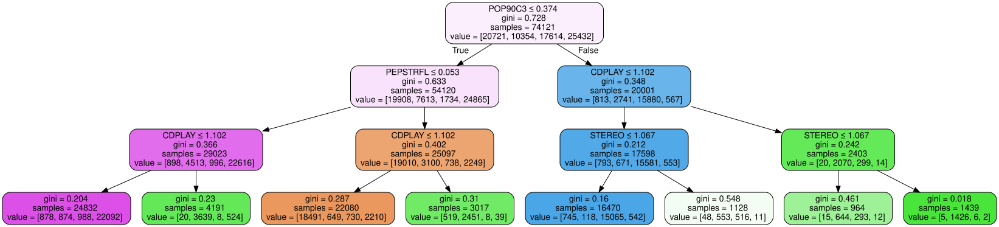

In [102]:
# Visualizing the decision tree
dot_data = export_graphviz(dt, out_file=None, 
                           feature_names=X.columns.to_list(),
                           filled=True,
                           rounded=True,
                           special_characters=True)  
graphviz.Source(dot_data)

## Classification of Outliers
Even though we believe some of the outliers we spotted previously can be truly aberrant observations, we will proceed to classify them according to the final concatenated cluster. For this task we will resort to a simple decision tree which allows us to easily classify the outliers.

This classifier will also provide a useful tool for the future, as a set of rules can be extracted that helps understand why customers belong to a certain cluster. With this information, we can easily classify future customers by making simple queries to the database. This will allow a more personalized service to each future customer which can be dynamically adapted (a customer can belong to different clusters across time).

In [103]:
df_out= df_outliers[kmeans_merged_df.drop(columns=['kmeans_merged_labels']).columns]
df_out

#tem de se correr tudo duma vez

NameError: name 'df_outliers' is not defined

In [199]:
#Firstly, to be able to predict the outliers, data needs to be imputed to the nan values and, 
#then, it needs to be standardized.

imp_mean = IterativeImputer(random_state=0)
df_complete = imp_mean.fit_transform(df_out[df_out.columns])
df_out[df_out.columns] = df_complete

df_out.reset_index(inplace=True)
out = df_out.columns.to_list()
out.remove('CONTROLN')

scaler = StandardScaler()
df_out[out] = pd.DataFrame(scaler.fit_transform(df_out[out]), columns = out)

df_out.set_index(['CONTROLN'],inplace=True) 

df_out

,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,MAXRAMNT,LASTGIFT,NEXTDATE,AVGGIFT,CARDGIFT,PEPSTRFL,POP90C1,HU2,HHD3,POP90C3,STEREO,CDPLAY,PETS,KIDSTUFF,BOATS
CONTROLN,,,,,,,,,,,,,,,,,,,,
87813,-0.081053,-0.246214,-0.74162,-1.03127,-0.036019,-0.292147,-0.460697,-0.748149,-0.408780,-0.855743,-0.715678,0.616569,-0.684500,-0.128870,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444
42329,-1.250177,0.372376,-0.74162,0.51876,-0.352220,-0.292147,-0.460697,-0.816092,-0.454715,-0.468119,-0.715678,-1.641822,-1.415390,1.053537,2.541065,3.287784,3.287784,2.695676,0.0,-0.143444
3583,-1.534407,-0.246214,-0.74162,-1.03127,-1.572447,-0.292147,-0.460697,-0.710312,-0.438737,-0.855743,-0.715678,-1.641822,0.831420,-0.615743,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444
159410,-0.013599,-0.246214,-0.74162,0.51876,-0.291906,-0.266418,-0.381061,-0.134971,-0.376825,-0.468119,-0.715678,0.616569,0.885560,0.218897,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444
143714,1.307890,-0.246214,1.34840,-1.03127,-1.572447,-0.305012,-0.500515,-0.919292,-0.448723,-0.080495,1.397276,0.616569,1.183331,-0.893957,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96541,-0.082950,-0.246214,-0.74162,-1.03127,-0.571087,-0.292147,-0.476624,-0.762772,-0.443017,-0.274307,-0.715678,0.616569,1.183331,-1.519937,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444
94564,0.112955,-0.246214,-0.74162,-1.03127,0.257893,-0.289574,-0.452733,1.017429,-0.449450,-0.080495,1.397276,0.616569,0.425370,0.218897,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444
6648,0.881546,-0.246214,1.34840,0.51876,1.478120,-0.266418,-0.381061,1.094830,-0.376026,-0.080495,-0.715678,0.616569,1.183331,1.818624,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444


In [200]:
# Predicting the cluster labels of the outliers
df_out['merged_labels'] = dt.predict(df_out)
df_out.head()


,AGE,NUMCHLD,HOMEOWNR,GENDER,INCOME,MAXRAMNT,LASTGIFT,NEXTDATE,AVGGIFT,CARDGIFT,PEPSTRFL,POP90C1,HU2,HHD3,POP90C3,STEREO,CDPLAY,PETS,KIDSTUFF,BOATS,merged_labels
CONTROLN,,,,,,,,,,,,,,,,,,,,,
87813,-0.081053,-0.246214,-0.74162,-1.03127,-0.036019,-0.292147,-0.460697,-0.748149,-0.408780,-0.855743,-0.715678,0.616569,-0.684500,-0.128870,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444,1
42329,-1.250177,0.372376,-0.74162,0.51876,-0.352220,-0.292147,-0.460697,-0.816092,-0.454715,-0.468119,-0.715678,-1.641822,-1.415390,1.053537,2.541065,3.287784,3.287784,2.695676,0.0,-0.143444,3
3583,-1.534407,-0.246214,-0.74162,-1.03127,-1.572447,-0.292147,-0.460697,-0.710312,-0.438737,-0.855743,-0.715678,-1.641822,0.831420,-0.615743,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444,1
159410,-0.013599,-0.246214,-0.74162,0.51876,-0.291906,-0.266418,-0.381061,-0.134971,-0.376825,-0.468119,-0.715678,0.616569,0.885560,0.218897,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444,1
143714,1.307890,-0.246214,1.34840,-1.03127,-1.572447,-0.305012,-0.500515,-0.919292,-0.448723,-0.080495,1.397276,0.616569,1.183331,-0.893957,-0.421339,-0.304156,-0.304156,-0.370965,0.0,-0.143444,2


## Cluster visualization using t-SNE

<a class="anchor" id="hier">

In [104]:
# This is step can be quite time consuming
two_dim = TSNE(random_state=42, n_jobs=4).fit_transform(kmeans_merged_df.drop(columns=['kmeans_merged_labels']))   

#-1 mais rapido 

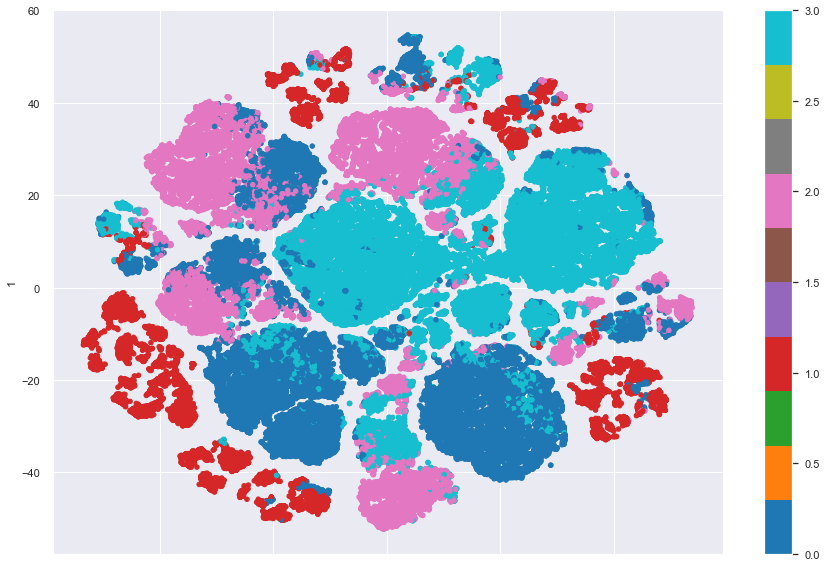

In [105]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=kmeans_merged_df['kmeans_merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

## DBSCAN (Density-based spatial clustering of applications with noise)

<a class="anchor" id="hier">

We've tried with different parameters and the best results, with 5 clusters, can be seen below.

In [106]:
from sklearn.neighbors import NearestNeighbors

In [107]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=3, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df_merged_final)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

#43 com eps=2
#36 com eps=1
#10 com eps=3

Number of estimated clusters : 6


In [110]:
# Concatenating the labels to df_merged_final
dbscan_merged_df = pd.concat([df_merged_final, pd.Series(dbscan_labels, index=df_merged_final.index, name="dbscan_labels")], axis=1)
dbscan_merged_df.head()

,AGE,NUMCHLD,HOMEOWNR,INCOME,LASTGIFT,MAXRAMNT,NEXTDATE,AVGGIFT,CARDGIFT,PEPSTRFL,POP90C1,HU2,HHD3,POP90C3,STEREO,CDPLAY,PETS,BOATS,dbscan_labels
CONTROLN,,,,,,,,,,,,,,,,,,,
95515,0.063169,-0.360666,-1.116268,-0.479556,-0.619897,-0.561733,0.714133,-0.681649,1.988605,1.054636,-1.246311,-0.753171,0.697753,0.959165,-0.395439,-0.386025,-0.422929,-0.147964,0
148535,-0.961915,1.302090,0.895842,1.320615,0.687573,0.396992,-0.982989,0.313356,-0.896453,-0.948195,0.845151,-1.237107,1.874786,-0.658330,-0.395439,-0.386025,-0.422929,-0.147964,0
15078,0.131508,-0.360666,-1.116268,-0.479556,-1.055720,-0.266740,0.434478,-0.714351,1.988605,1.054636,-1.246311,-0.366023,0.370800,1.780354,-0.395439,-0.386025,-0.422929,-0.147964,0
172556,0.678220,-0.360666,-1.116268,-1.679670,-0.619897,-0.635481,1.491866,-0.798346,0.435112,1.054636,-1.246311,1.085784,0.109237,1.631047,-0.395439,-0.386025,-0.422929,-0.147964,0
7112,1.224931,1.302090,0.895842,-0.479556,-0.184074,-0.340488,3.995967,-0.791771,0.657040,-0.948195,0.845151,-0.946746,-0.675451,-0.658330,2.528834,-0.386025,-0.422929,-0.147964,-1


In [112]:
# Computing the R^2 of the cluster solution
df_nonoise = dbscan_merged_df.loc[dbscan_merged_df['dbscan_labels'] != -1]
sst = get_ss(df_merged_final)  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

#60 com eps=2
#94 com eps=1
#21 com eps=3

Cluster solution with R^2 of 0.1568


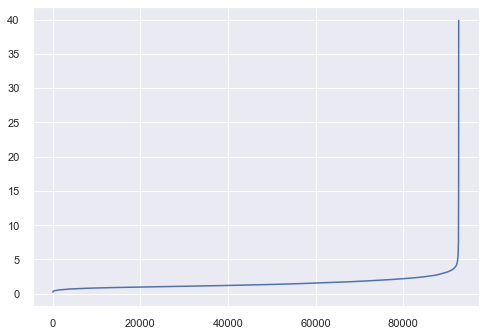

In [113]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20,n_jobs=4)
neigh.fit(df_merged_final)
distances, _ = neigh.kneighbors(df_merged_final)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

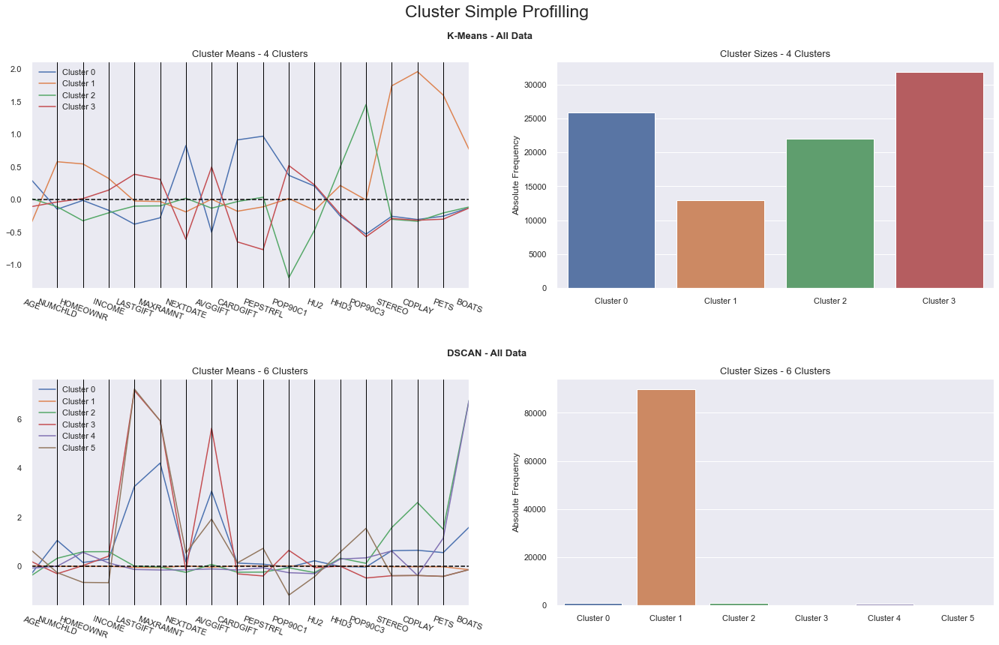

In [114]:
# Comparing both K-means and DBSCAN solutions
dbkm_complete_std_df = kmeans_merged_df.merge(dbscan_merged_df["dbscan_labels"], left_index=True, right_index=True)
cluster_profiles(dbkm_complete_std_df, ["kmeans_merged_labels", "dbscan_labels"], figsize=(23, 13), compar_titles=["K-Means - All Data", "DSCAN - All Data"])

## GMM (Gaussian Mixture Model )
### Characteristics:
- Assumes the data is generated from a mixture of finite number of Gaussian distributions with unknown parameters
- Use the EM (Expectation Maximization algorithm) to estimate the parameters
- Provides a probability of each observation belonging to each cluster
- Advantages over K-Means:
    - Can deal with spherical and elipsoid cluster shapes
    - Number of components needs to be defined apriori
<a class="anchor" id="hier">
    


In [115]:
# GMM
from sklearn.mixture import GaussianMixture

In [116]:
def comp_gmm_models(df, max_nclus, min_nclus=2):
    """
    This function produces a bar plot for each quality criteria (AIC, BIC) to asses what is the best gmm configuration
    """
    # Data
    n_components_range = range(min_nclus, max_nclus+1)
    cv_types = ['spherical', 'tied', 'diag', 'full'] #values of the covariance type parameter
    bic = np.empty((4, len(n_components_range)))
    aic = np.empty((4, len(n_components_range)))
    for r, cv_type in enumerate(cv_types):
        for c, n_components in enumerate(n_components_range):
            # Fit a Gaussian mixture with EM
            gmm = GaussianMixture(n_components=n_components, covariance_type=cv_type)
            gmm.fit(df)
            # Save quality measure value
            bic[r, c] = gmm.bic(df)
            aic[r, c] = gmm.aic(df)

    # Traces
    bic = pd.DataFrame(bic, columns=n_components_range, index=cv_types)
    aic = pd.DataFrame(aic, columns=n_components_range, index=cv_types)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(23,7))
    
    sns.barplot(data=bic.reset_index().melt(id_vars="index"),
                x="variable", y="value", hue="index", ax=ax1)
    
    sns.barplot(data=aic.reset_index().melt(id_vars="index"),
                x="variable", y="value", hue="index", ax=ax2)

    # Layout
    ax1.set_xlabel('Number of Components')
    ax2.set_xlabel('Number of Components')
    ax1.set_ylabel('BIC Criteria')
    ax2.set_ylabel('AIC Criteria')
    ax1.legend(title="Covariance Type")
    ax2.legend(title="Covariance Type")
    plt.suptitle('BIC and AIC Scores per Model', fontsize=23)

    plt.show()

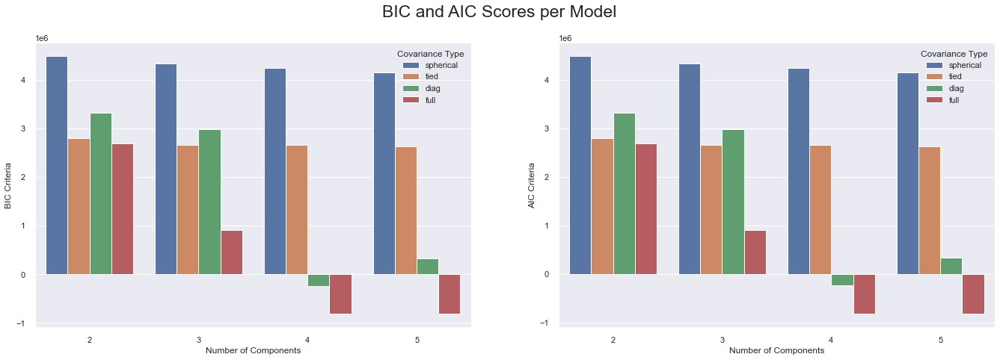

In [117]:
# Use the function built to choose the best GMM configuration
comp_gmm_models(df_merged_final, 5)

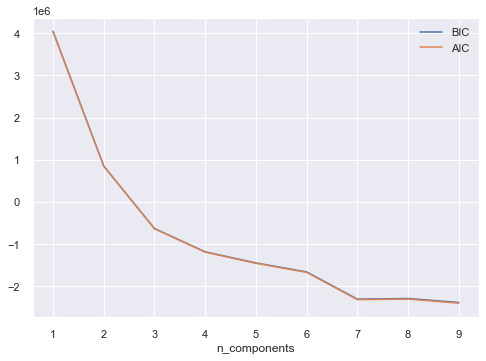

In [118]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 10)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df_merged_final) #, n_jobs=4
          for n in n_components]

bic_values = [m.bic(df_merged_final) for m in models]
aic_values = [m.aic(df_merged_final) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

The first step in GMM is to define the parameters to use, such as the number of clusters to retain and the covariancy type to use. In this case, we will do with 3 clusters, following to the graph above.

From the plot above, the covariance type "full" is the best one to use, both in terms of AIC and BIC information criteria (the lower the better), which are measures of the cluster quality. Therefore, from the plot above we conclude that we want to use the "full" Covariance Type in our GMM.

Besides, it is also possible to see how the quality varies according to the number of clusters retained. One can conclude that with more clusters, the quality increases overall, independently of the covariance type (as it would be expected). Therefore, we will perform some further investigation on how many clusters to retain.

In [119]:
#the gmm method was aggregated on a function
def doGMM(df, nclust):
    model=GaussianMixture(n_components=nclust, init_params='kmeans', random_state=0)
    model.fit(df)
    clust_labels = model.predict(df)
    return(clust_labels)

In [120]:
# Performing gmm and appending the cluster labels to a new dataframe that keeps the cluster labels
clust_labels = doGMM(df_merged, 3)
gmm_df = df_merged_final.copy()
gmm_df["gmm_labels"] = clust_labels

In [121]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_merged_final)  # get total sum of squares
ssw_labels = gmm_df.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.1477


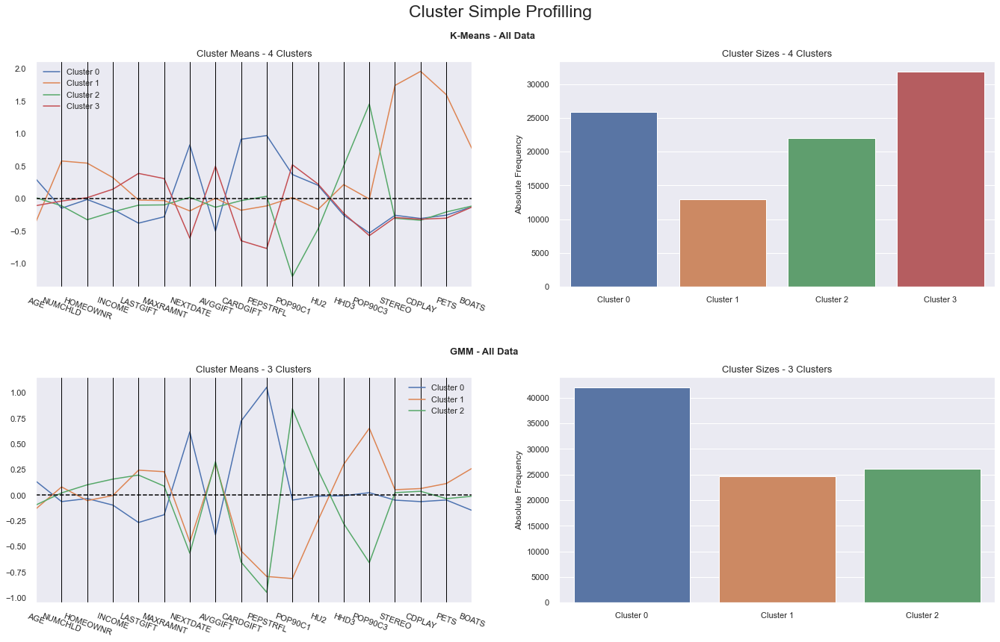

In [122]:
# Comparing both K-means and GMM solutions
comp_complete_df = kmeans_merged_df.merge(gmm_df["gmm_labels"], left_index=True, right_index=True)
cluster_profiles(comp_complete_df, ["kmeans_merged_labels", "gmm_labels"], figsize=(23, 13), compar_titles=["K-Means - All Data", "GMM - All Data"])

In [151]:
prof = ProfileReport(d[categorical_data])
prof.to_file(output_file='profiling2.html')

## References:
Deal with nan values:
https://stackoverflow.com/questions/50670080/mice-implementation-in-python
https://stackoverflow.com/questions/45321406/missing-value-imputation-in-python-using-knn
https://stackoverflow.com/questions/45239256/data-imputation-with-fancyimpute-and-pandas
https://stackoverflow.com/questions/54059964/can-not-use-mice-from-fancyimputer-python


Use mean or median:
https://www.wcc.nrcs.usda.gov/normals/median_average.htm